### Criar Dicionários de Dataframes com cada empresa

In [3]:
import joblib
import pandas as pd  # lib para análise de dados
import os  # lib para adiministrar arquivos do projeto
from pandas_datareader import data as web
import numpy as np
from sklearn.preprocessing import StandardScaler
import yfinance as yf

In [4]:
df_indices = pd.read_excel('balanco_exemplo.xlsx')

df_indices

,Unnamed: 0
0,NaN
1,Ativo Total
2,Ativo Circulante
3,Caixa e Equivalentes de Caixa
4,Aplicações Financeiras
5,Contas a Receber
6,Estoques
7,Ativos Biológicos
8,Tributos a Recuperar
9,Despesas Antecipadas


In [5]:
empresas = ["ABEV3", "AZUL4", "AMER3", "B3SA3", "BBSE3", "BBDC4", "BRAP4", "BBAS3","BRKM5", "BRFS3", "BPAC11", "CRFB3", "CCRO3", "CMIG4", "CIEL3", "COGN3", "CPLE6","CSAN3", "CPFE3", "CVCB3", "CYRE3", "ECOR3", "ELET6", "EMBR3", "ENGI11","ENEV3", "EGIE3", "EQTL3", "EZTC3", "FLRY3", "GGBR4", "GOAU4", "GOLL4", "NTCO3","HAPV3", "HYPE3", "ITSA4", "ITUB4", "JBSS3", "JHSF3", "KLBN11", "RENT3","LREN3", "MGLU3", "MRFG3", "BEEF3", "MRVE3", "MULT3", "PCAR3", "PETR4", "VBBR3","PRIO3", "QUAL3", "RADL3", "RAIL3", "SBSP3", "SANB11", "CSNA3", "SUZB3","TAEE11", "VIVT3", "TIMS3", "TOTS3", "UGPA3", "USIM5", "VALE3", "BHIA3", "WEGE3", "YDUQ3"]

fundamentos = {}
arquivos = os.listdir("balanco_09_2023") # acessando o balanço das empresas

for arquivo in arquivos:
    #pegando apenas o nome da empresa no nome do arquivo
    if len(arquivo) == 18:
        nome = arquivo[-10:-4]
    else:
        nome = arquivo[-9:-4]
    
    if nome in empresas:
        print(nome)
        # pegar o balanco da empresa
        balanco = pd.read_excel(f'balanco_09_2023/{arquivo}', sheet_name=0)
        
        have_indices = balanco.iloc[:,0].isin(['Ativo Total']).any()
        
        if not have_indices:
            balanco.insert(0, "", df_indices['Unnamed: 0'], allow_duplicates=False)
        
        # na primeira coluna colocar o título com o nome da empresa
        balanco.iloc[0,0] = nome
        
        # tornando a 1ª linha em cabeçalho
        balanco.columns = balanco.iloc[0]
        balanco = balanco[1:]
        
        # tornar a 1ª coluna índice
        balanco = balanco.set_index(nome)
        display('BALANCO:',balanco)
        
        dre = pd.read_excel(f'balanco_09_2023/{arquivo}', sheet_name=1)
        
        # na primeira coluna colocar o título com o nome da empresa
        dre.iloc[0,0] = nome
        
        # tornando a 1ª linha em cabeçalho
        dre.columns = dre.iloc[0]
        dre = dre[1:]
        
        # tornar a 1ª coluna índice
        dre = dre.set_index(nome)
        dre = dre.dropna(axis=1, how='all') # drop Nan column
        
        fundamentos[nome] = balanco.append(dre) # adicionando no dicionário o balanço com o dre da empresa
        display('DRE:', dre)

BPAC11
WARNING *** file size (80987) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BPAC11,,,,,,,,,,,,,,,,,,,,,
Ativo Total,46459797.504,41850454.016,52278120.448,59324534.784,58252722.176,72450859.008,82125873.152,85434818.56,86720233.472,102550126.592,...,301280952.32,301413171.2,340556054.528,318201790.464,327950925.824,384224428.032,368817602.56,369588207.616,367168978.944,390000312.32
Ativo Circulante,41887543.296,36837609.472,47202553.856,51963445.248,47648956.416,61748158.464,69261885.44,71409156.096,72857862.144,84463632.384,...,211008831.488,222731403.264,236904726.528,214016425.984,304515022.848,355304112.128,339788169.216,337608736.768,334213414.912,355435970.56
Disponibilidades,1905,2276,222632,34879,435144,37990,227412,599491.008,188402,505947.008,...,1334454.016,3513947.904,998504,1602316.032,1328962.944,1052593.984,1589502.976,1084210.048,1095169.024,2068504.064
Aplicações Interfinanceiras de Liquidez,18277447.68,18338424.832,19711895.552,19158980.608,15250366.464,23775367.168,25235378.176,29583155.2,24290469.888,38895927.296,...,46947901.44,42075017.216,51068334.08,54244376.576,50844549.12,58632105.984,59102609.408,75635335.168,88070406.144,66693406.72
Títulos e Valores Mobiliários,16170532.864,11871336.448,19402539.008,25127047.168,25641754.624,29615495.168,33747460.096,34017308.672,38997680.128,33608503.296,...,81235222.528,111311069.184,133339029.504,90779189.248,144421568.512,136413634.56,141736443.904,114304851.968,118969556.992,174369112.064
Relações Interfinanceiras,99740,82412,251516.992,830164.992,874878.016,1064961.984,915854.016,809654.976,473129.984,420944,...,5790337.024,6849615.872,7728054.784,9753879.552,9380121.6,12866158.592,30111029.248,14739812.352,13534683.136,14688983.04
Relações Interdependências,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Operações de Crédito,1333705.984,2100605.056,3457722.112,2636967.936,2740456.96,2338668.032,2650772.992,2517250.048,3082188.032,2725146.112,...,23395704.832,26289135.616,24434391.04,30059157.504,58558476.288,63208521.728,63070699.52,64922087.424,59474690.048,50933645.312
Operações de Arrendamento Mercantil,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (80987) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,30/06/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BPAC11,,,,,,,,,,,,,,,,,,,,,
Receitas da Intermediação Financeira,1360370.048,1289478.016,1490926.976,1332544.896,1998510.976,1520632.96,1760529.024,1720659.84,2103639.04,1499448.064,...,4079738.112,4357202.944,2558382.08,5792865.28,8541150.208,19703531.52,10380596.224,11003955.2,8702659.584,13105568.768
Despesas da Intermediação Financeira,-1130412.032,-888419.008,-1451362.048,-1029533.76,-1203122.944,-1312800,-1038985.984,-1140374.272,-1113538.048,-1416272,...,-4028899.072,-1004291.968,-2112909.056,-3982851.584,-5983563.776,-17358344.192,-7898498.048,-9784712.192,-6410997.248,-10025566.208
Resultado Bruto Intermediação Financeira,229958,401059.008,39565,303011.008,795388.032,207832.992,721542.976,580286.08,990100.992,83176,...,50839,3352911.104,445472.992,1810011.776,2557585.92,2345187.072,2482097.92,1219238.912,2291663.104,3080003.072
Outras Despesas/Receitas Operacionais,185127.008,-9066,132535,85047.992,42400,442398.016,89491,59589,-59999,376728,...,837609.984,577523.968,670838.016,214835.968,422772.992,69402,342134.016,249783.024,386355.008,-53337
Receitas de Prestação de Serviços,134970,175146,169800.992,132324.032,140758,212027.008,178123.008,268480.96,198324.992,277006.016,...,686936,869260.992,992924.992,780568.896,662278.016,877622.976,1048643.968,983599.936,828304,677804.992
Despesas de Pessoal,-45412,-46561,-45956,-104966.008,-55954,-51737,-52362,-232755.008,-53015,-54644,...,-147051.008,-138304.992,-153628.992,-248469.024,-219359.008,-234532.992,-244347.008,-338175.008,-306049.984,-292408.992
Outras Despesas Administrativas,-45431,-67890,-66628,-73471.992,-58026,-123147,-112934,-125193,-118063,-107701,...,-394828.992,-472620.992,-550547.008,-733662.016,-692905.024,-832449.024,-699171.008,-1022608.896,-945912,-971225.024
Despesas Tributárias,-35270,-33514,-43859,-64003,-52876,-46904,-45864,-65728.992,-62957,-42456,...,-76882,-240872.992,-118875,-141991.008,-279795.008,-128938,-205247.008,-226603.984,-192186,-268576
Outras Receitas Operacionais,8552,22860,36830,78109.008,29675,31440,13312,9660,41060,13119,...,168992,83657,98479,254292.032,0,0,0,0,0,230803.008


MRFG3
WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MRFG3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,5217999.872,6880036.864,9155172.352,9239444.48,9336327.168,9381093.376,11451640.832,13594374.144,14706199.552,18585391.104,...,41711591.424,43706572.8,47109808.128,48003256.32,48561750.016,134003834.88,137191170.048,136104321.024,131530719.232,127044993.024
Ativo Circulante,2817910.016,3750103.04,4370444.8,4420738.048,4795302.912,4852367.872,6533742.08,5263784.96,6046668.8,9577892.864,...,18894223.36,22111035.392,25488855.04,19514304.512,21180360.704,48268255.232,51062841.344,50598080.512,46768230.4,43935109.12
Caixa e Equivalentes de Caixa,741036.992,1172212.992,1071664,1125081.984,1284370.048,1277089.024,3033437.952,1543840,2028812.032,5281013.76,...,1563155.968,1611197.056,2979220.992,1759481.984,4959477.76,7736989.184,9563703.296,6403787.776,5774752.768,5628975.104
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,9493799.936,11892624.384,12621580.288,6640778.24,6208358.912,11129500.672,10495086.592,16088744.96,13837072.384,12962833.408
Contas a Receber,1170171.008,1564721.024,1691304.96,1619254.016,1783513.984,1854814.976,1726648.96,1476610.048,1687158.016,1527769.984,...,2724433.92,3209437.952,3207073.024,3841373.952,2522539.008,6529458.176,7445386.752,6727128.064,6098731.008,5766419.968
Estoques,896089.984,996643.968,1581933.952,1626524.032,1679832.064,1672707.968,1726482.048,2198881.024,2276150.016,2686387.968,...,3562968.064,3810767.104,4224105.984,4351282.176,4037161.984,13924700.16,14637074.432,12852084.736,12701239.296,11568586.752
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,26905,26848,24648,64162,62269,3145676.032,3036028.928,3200633.088,3104209.92,3026875.904
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,733740.992,813569.984,1637426.048,1937212.032,2226745.088,3689021.952,3509075.968,3261989.12,3528154.112,2858520.064
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MRFG3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1641709.952,2628133.12,2445527.04,2572357.12,2537709.056,2723602.432,3405352.96,3769181.952,4112556.032,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-118117,-232131.008,-194652.992,-168364.992,-135108.992,-165329.024,-209422,-211664,-305312,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1523592.96,2396002.048,2250874.112,2403992.064,2402599.936,2558273.792,3195930.88,3557518.08,3807244.032,5317775.36,...,17235826.688,20573671.424,23637794.816,23941167.104,22340812.8,34485645.312,36416638.976,37388599.296,31757479.936,32513916.928
Custo de Bens e/ou Serviços Vendidos,-1238625.024,-1815718.144,-1937491.968,-2079780.992,-2034770.944,-2182302.208,-2649634.048,-2959191.04,-3202205.952,-4465993.216,...,-14985944.064,-16064939.008,-18222645.248,-18914336.768,-18858708.992,-29704159.232,-31034816.512,-33281701.888,-28981684.224,-29455919.104
Resultado Bruto,284968,580284.032,313382.016,324211.008,367828.992,375972.032,546297.024,598326.976,605038.016,851783.104,...,2249882.112,4508733.952,5415148.032,5026839.04,3482105.088,4781484.032,5381822.976,4106903.808,2775795.968,3057995.008
Despesas Com Vendas,-94078,-149175.984,-155932.992,-154316.992,-160626,-170663.984,-270406.016,-348041.984,-378630.016,-410422.016,...,-660099.968,-685454.976,-784219.008,-991981.952,-878630.016,-2576934.912,-2874000.896,-3165640.192,-2610181.888,-2591304.96
Despesas Gerais e Administrativas,-39657,-64634.008,-66737,-72153,-75566,-73076,-103876,-108667,-115801,-234344,...,-251512.992,-279142.016,-282924,-284409.984,-253810,-465640,-493320.992,-430155.968,-472684.992,-534828
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,223322,-215491.008,10248,20129,74622,-12241,38847,-3826,-8314,217777.984,...,-95120,-88641,-76110,-89384.008,0,3748525.056,21189,-664366.976,0,-4602


ITSA4
WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ITSA4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,349098835.968,402118934.528,638727356.416,625646370.816,603261239.296,619860787.2,615961591.808,642594242.56,660369702.912,694788620.288,...,73301999.616,79275999.232,81007001.6,85981003.776,85929000.96,89065996.288,95943000.064,96637001.728,97875001.344,102327001.088
Ativo Circulante,268068208.64,312832294.912,484355309.568,472136646.656,454315507.712,463159164.928,453898895.36,483707977.728,498427396.096,512660996.096,...,7308000.256,10448000,7625999.872,9772000.256,9392000,10183999.488,11187000.32,11692000.256,11184000,13210000.384
Caixa e Equivalentes de Caixa,5651661.824,6114097.152,15924908.032,13151174.656,9499862.016,10406612.992,10676078.592,11320259.584,12544772.096,11191320.576,...,2540999.936,5066999.808,2516999.936,3876000,3451000.064,3164999.936,4537999.872,4472000,4288000,5546999.808
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1452999.936,1440000,1412000,1516000,1539000.064,1852000,2038000,2004999.936,1992999.936,2059000.064
Contas a Receber,231452508.16,266674356.224,390896943.104,391064748.032,380455387.136,384832634.88,383144919.04,410043678.72,429984055.296,438873620.48,...,1628000,2236000,1942000,2379000.064,2130000,2849999.872,2272999.936,3056000,2268999.936,3071000.064
Estoques,706376,772249.024,758019.008,668289.024,629971.968,666337.024,758518.016,785072,709438.016,656969.024,...,1119000.064,1167000.064,1251000.064,1432999.936,1718000,1803000.064,1759000.064,1604999.936,1707000.064,1616999.936
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,321000,265000,281000,279000,305000,282000,405000,387000,632000,735000
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ITSA4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,3721860.096,4901554.176,4445618.176,4484904.96,4971144.192,5450224.64,5322054.144,5679844.864,5632167.936,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,0,0,0,0,0,0,0,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,3721860.096,4901554.176,4445618.176,4484904.96,4971144.192,5450224.64,5322054.144,5679844.864,5632167.936,-11394066.432,...,1768000,1974000,2176999.936,2250999.808,2131000.064,2214000.128,2160999.936,1980000,1712000,1954000
Custo de Bens e/ou Serviços Vendidos,-865526.016,-906208.064,-743657.984,-707707.008,-877896,-976077.888,-931824,-1048774.976,-740808,-902593.024,...,-1162000,-1252999.936,-1424999.936,-1456000.128,-1388000,-1436999.936,-1420999.936,-1364999.936,-1048000,-1276000
Resultado Bruto,2856334.08,3995346.944,3701959.936,3777198.08,4093248,4474147.84,4390230.016,4631070.208,4891360.256,-12296660.992,...,606000,721000,752000,794999.872,743000,777000,740000,615000.064,664000,678000
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,-206000,-228000,-241000,-331000,-283000,-314000,-268000,-255000,-235000,-280000
Despesas Gerais e Administrativas,-5079448.064,-13908327.424,-8175313.92,-8513327.104,-8297624.064,-8164342.272,-8234049.024,-8883496.96,-9389102.08,12452648.96,...,-106000,-114000,-127000,-160000,-120000,-143000,-140000,-145000,-122000,-148000
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,288320,1456445.056,332225.984,620699.008,0,593712.064,362675.008,333942.016,172635.008,171747.968,...,66000,521000,89000,663000.064,1164000,102000,534000,1083000.064,168000,544000


HAPV3
WARNING *** file size (38367) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,30/06/2019,30/09/2019,31/12/2019,31/03/2020,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
HAPV3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2614945.024,2694052.096,5033259.008,4925211.136,4876674.048,5978750.976,6087942.144,10896094.208,12453686.272,12798019.584,...,13794698.24,17305812.992,17404289.024,21034387.456,72662409.216,71950630.912,71127957.504,73213730.816,73393979.392,75034386.432
Ativo Circulante,1517774.976,1493476.992,1412876.032,1385730.944,1275954.048,1227313.024,1926258.048,1934209.024,2161302.016,2754238.976,...,3689238.016,3749082.112,3710512.896,3318191.104,7795069.952,7167574.016,6945760.256,7931901.952,7600617.984,9179330.56
Caixa e Equivalentes de Caixa,104209,347750.016,113049,89154,185484,143035.008,142951.008,169620,224228.992,497971.008,...,175819.008,226616,506142.016,347256,1016801.024,593358.016,568707.008,1267915.008,364243.008,547961.984
Aplicações Financeiras,802814.016,572822.976,671929.984,619961.024,702363.008,639817.024,1093972.992,1151588.992,1180418.048,1390963.968,...,2362159.104,2270856.96,2028355.968,1720024.064,3336817.92,3528038.912,3269010.944,3331740.928,4049487.872,5187752.96
Contas a Receber,421844.992,363758.016,407408,443134.016,152747.008,167571.008,173708.992,146128.992,296987.008,358752.992,...,487727.008,496601.984,424156.992,474304,1269537.024,1311428.992,1307970.944,1480801.024,1377825.024,1457511.04
Estoques,14226,12553,14906,12407,19187,17749,20271,21051,72704,85958,...,135570,143987.008,141278,156932.992,300315.008,328683.008,286132.992,280759.008,264151.008,285368.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,26505,21589,23336,35935,65287,68602,83122,82582,160483.008,167659.008,...,194150,208120.992,201988,237872.992,483287.008,552417.024,653326.976,708113.984,737708.992,768742.016
Despesas Antecipadas,0,0,0,0,103766,121949,104832,107428,145168.992,0,...,172816.992,208214,228723.008,221496,489620,508209.984,518623.008,471940,449307.008,437816


WARNING *** file size (38367) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,30/06/2019,30/09/2019,31/12/2019,31/03/2020,30/06/2020,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
HAPV3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1089872,1110948.992,1163735.04,1211342.08,1256999.936,1276257.024,1315771.008,1785354.88,2078787.968,2076297.984,...,2323152.896,2402443.008,2558882.048,2598906.88,4841522.176,6083615.744,6321211.904,6502454.784,6726193.152,6839823.872
Custo de Bens e/ou Serviços Vendidos,-597990.016,-678065.984,-728489.984,-750115.904,-726411.008,-751360,-818579.008,-1104075.008,-1279595.008,-1132562.048,...,-1522103.04,-1698787.968,-1851170.944,-1745397.248,-3720783.872,-4581814.784,-4793858.048,-4997250.56,-5046682.112,-5229299.2
Resultado Bruto,491881.984,432883.008,435244.992,461225.984,530588.992,524896.992,497192,681279.872,799193.024,943736,...,801049.984,703654.976,707710.976,853509.952,1120738.048,1501800.96,1527353.984,1505202.816,1679511.04,1610525.056
Despesas Com Vendas,-121935,-111374,-116639,-93466.016,-118732,-129387,-125079,-146529.008,-154568.992,-179795.008,...,-144338,-193496,-168575.008,-219098.96,-330572,-454516.992,-485116.992,-550243.072,-519945.984,-482048.992
Despesas Gerais e Administrativas,-96787,-132240,-139086,-139064.992,-139279.008,-128855,-138424.992,-269520.992,-333383.008,-310324,...,-409500,-438121.984,-504766.016,-475865.056,-837436.032,-1192760.96,-1362038.016,-1150188.032,-1078381.952,-1103700.992
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,329,9464,-424,-9498,-550,-1956,-1977,-192,554,-2466,...,3430,11999,18799,-3124,14574,13753,428951.008,94630.984,12154,39197


AZUL4
WARNING *** file size (43729) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2016,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
AZUL4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,8400409.088,8069520.896,9184295.936,9009838.08,10316615.68,10401317.888,10963489.792,11448014.848,11793206.272,16742080.512,...,15192453.12,17386729.472,17777995.776,18533472.256,17785616.384,18529572.864,18318913.536,18721292.288,17402236.928,17121995.776
Ativo Circulante,1910326.016,1695544.96,2639741.952,2663008,3304340.992,3103513.088,3423943.936,3623930.112,3521797.888,3585737.984,...,4562772.992,6755204.096,6771660.8,5846336,5030171.136,5719831.04,5129420.8,4871936,3949701.12,4628297.216
Caixa e Equivalentes de Caixa,549164.032,434969.984,500913.984,485864,762318.976,738940.032,848961.024,893676.032,1169136,908387.968,...,2275429.888,4339074.048,3633320.96,3073798.912,1857771.008,2033628.032,1103747.968,668348.032,466350.016,616209.984
Aplicações Financeiras,384616,284684.992,973243.008,971654.976,1044956.032,631619.968,725835.008,667619.968,517423.008,396823.008,...,10624,1049,1180,1430,1509,915,243,0,0,0
Contas a Receber,673275.008,622468.992,778632,810032,914428.032,1166112,1175689.984,1340771.968,1069056,1417303.04,...,1018920,1190594.944,1652664.064,997892.992,1329380.992,1561404.032,2170555.904,1803997.952,1267102.976,1351187.968
Estoques,107102,114835,129615,134432.992,150392.992,175138,171464.992,198368.992,200144.992,224872,...,454160,479243.008,519556.992,571923.968,601814.976,658198.976,678456,721737.984,718868.992,722736
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,44488,54723,87298,102417,112891,108542,176974,257660.992,283840.992,303572,...,137280,124374,132987,109699,152584,159140.992,207678,234891.008,234748,188019.008
Despesas Antecipadas,97501,110186,91038,88455,109784,104650,103279,127651,163828.992,152600.992,...,148122,152774,172204,244412.992,226514,224378,195046,182891.008,150216,233530


WARNING *** file size (43729) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,30/06/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
AZUL4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1873793.024,1723256.064,1998189.056,2194258.688,2213400.064,2017875.968,2441650.944,2480429.824,2541991.936,2617694.976,...,1825821.952,1702365.952,2717800.96,3729740.288,3193040.896,3924762.88,4376811.008,4453451.776,4478327.808,4254194.944
Custo de Bens e/ou Serviços Vendidos,-1464577.024,-1420332.032,-1494347.008,-1604125.952,-1689086.976,-1970984.96,-1984156.032,-1911885.952,-1918365.056,-1978525.056,...,-1828397.056,-1821842.048,-2336886.016,-2137078.912,-3020835.072,-3500627.968,-3634074.88,-3006426.624,-3894823.936,-3588001.024
Resultado Bruto,409216,302924,503841.984,590132.992,524312.992,46891,457495.008,568544,623627.008,639169.984,...,-2575,-119476,380915.008,1592660.992,172206,424135.008,742736,1447025.024,583504,666193.984
Despesas Com Vendas,-73735,-73645,-86371,-94176.008,-88896,-82604,-104295,-111078.984,-97782,-115720,...,-90853,-79569,-91516,-162742,-132345,-163322,-201764.992,-223576,-181988,-188778
Despesas Gerais e Administrativas,-130269,-124351,-168187.008,-190359.968,-159491.008,-171806,-179092.992,-174531.024,-190246,-183580,...,-68338,-98272,-104997,-57362.984,-78773,-55666,-119142,-100292.984,-114197,-75690
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


CIEL3
WARNING *** file size (87637) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CIEL3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2188685.056,1913334.016,1888225.024,2051256.96,2490947.072,2812974.08,3177783.04,3549425.92,3771406.08,3867518.976,...,81835810.816,82843541.504,88715952.128,98646687.744,99813597.184,104818114.56,103353868.288,115018113.024,105783877.632,95865479.168
Ativo Circulante,1497298.944,1270941.056,1297084.032,1469403.008,1919656.96,1727740.032,2040958.976,2358670.08,2536321.024,2542119.936,...,70019964.928,71018553.344,76936355.84,87109844.992,88137170.944,91153809.408,89804275.712,103862845.44,94592385.024,84501487.616
Caixa e Equivalentes de Caixa,1072156.992,285871.008,344760,360695.008,510241.984,171456,211040.992,245816,250603.008,237836.992,...,3766872.064,2072050.944,2437840.896,2048018.944,602310.016,1756224,1014558.016,1087435.008,1018601.024,951896
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3201434.112,3783112.96,5405681.152,5568736.768,6263742.976,2199277.056,2257956.096,9927566.336,10632309.76,0
Contas a Receber,420654.016,978328,943310.976,1101031.936,1403527.936,1542755.968,1823005.952,2105769.984,2285718.016,2304282.88,...,62456033.28,64674545.664,68557680.64,78998495.232,80710688.768,86534782.976,85806252.032,92195389.44,82265243.648,82770296.832
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,520833.984,344892,400732,382956,424929.984,504396,573844.992,571779.008,549568,647224
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,74797,143950,134419.008,111639,135491.008,159127.008,151663.008,80680,126661,132076


WARNING *** file size (87637) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CIEL3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,881609.984,914422.976,972264,1058428.16,1061534.976,1081645.952,1156425.984,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-90318,-96580,-104589,-101063.016,-108426,-111556,-125362,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,791292.032,817843.008,867675.008,957364.928,953108.992,970089.984,1031064,1038231.104,965004.992,983137.984,...,1169234.048,1173602.944,1267376,1381796.224,1333672.96,2540197.888,2636715.008,-283296.768,1585409.024,2642076.928
Custo de Bens e/ou Serviços Vendidos,-212176,-228412,-244324,-225785.984,-251658,-257459.008,-317062.016,-354648,-311492.992,-342387.008,...,-751228.992,-711606.016,-776147.968,-843258.048,-815582.016,-1465539.968,-1467806.976,254065.856,-876350.016,-1395950.976
Resultado Bruto,579116.032,589430.976,623350.976,731579.008,701451.008,712630.976,714001.984,683582.976,653512,640750.976,...,418004.992,461996.992,491228,538537.984,518091.008,1074658.048,1168908.032,-29231.104,709059.008,1246125.952
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,-23883,-20950,-20908,-10322,-21694,-25331,-28552,-35971,-12602,-36044
Despesas Gerais e Administrativas,-100036,-90673,-91682,-141553.984,-99246,-102573,-108827,-124430,-139918,-119171,...,-235504.992,-232971.008,-246426,-294929.984,-296420,-313848.992,-337063.008,-364638.944,-329103.008,-393969.984
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,49625,0,-49625,0,383761.984


PRIO3
WARNING *** file size (82131) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PRIO3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,417860.992,402825.984,422430.016,396183.008,2695652.096,2708774.912,4379277.824,4422094.848,5390090.752,5823075.84,...,9341748.224,10504500.224,11445166.08,12221416.448,12862920.704,16292271.104,19920152.576,20302520.32,25623115.776,25991952.384
Ativo Circulante,355870.016,311942.016,266515.008,170640,2446144,2317658.88,979497.984,2143673.984,2853584.896,2044899.968,...,4097286.912,5517215.232,5463662.08,6106294.784,6805409.792,7975119.872,11122282.496,10602627.072,3884323.072,3664023.04
Caixa e Equivalentes de Caixa,344759.008,301515.008,251622,152946,20850,6736,84257,77472,57002,10298,...,3185030.912,3381618.944,1948978.944,970681.024,3091613.952,3193381.12,8362705.92,9612960.768,527180,1155252.992
Aplicações Financeiras,0,0,0,0,2405723.904,2261079.04,801449.984,1935650.048,1434177.024,1226044.032,...,77820,1135096.064,2577231.104,3680185.088,2352001.024,3365991.936,928878.976,0,0,0
Contas a Receber,8019,2010,4789,1950,1944,200,14299,82756,1382,729009.024,...,22568,329548,291783.008,915033.024,845187.008,888979.968,1079329.024,166304,2230117.888,1357895.936
Estoques,0,0,0,0,0,0,0,0,0,0,...,395780.992,382438.016,384679.008,217536,281174.016,275692.992,338513.984,0,0,729200
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,453424.992,599614.016,0
Tributos a Recuperar,0,0,0,0,7507,12609,17605,21319,34706,45031,...,105144,84757,76977,85839,56077,44358,47006,76012,92436,199216.992
Despesas Antecipadas,0,0,0,0,2137,19622,15976,10800,8392,8296,...,23233,15940,9352,9760,31995,26054,18803,10809,5342,13944


WARNING *** file size (82131) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PRIO3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1840,5897,3626,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-299,-833,-823,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1541,5064,2803,6185,353,7840,640,1104,3150,41,...,655334.016,1022836.992,939516.992,1778314.752,1529995.008,1873985.024,1985785.984,973708.928,2814955.008,2311205.888
Custo de Bens e/ou Serviços Vendidos,-4026,-3136,-4626,-2630,-2800,-2788,-1822,-2019,-707,-1339,...,-236531.008,-468563.008,-453256,-725007.936,-462095.008,-657336,-612310.976,-374560.992,-981886.016,-843072
Resultado Bruto,-2485,1928,-1823,3555,-2447,5052,-1182,-915,2443,-1298,...,418803.008,554273.984,486260.992,1053307.136,1067900.032,1216648.96,1373474.944,599148.032,1833069.056,1468134.016
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,-96642,-165166
Despesas Gerais e Administrativas,-23091,-21762,-35811,-108984,-64550,-103009,-164044,-175737.984,-137952,-120921,...,-81780,-70667,-70309,-92884,-90184,-84814,-99121,-93409.992,-83634,-104501
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,600,0,1447,-1453,0,506,0,-506,18,14,...,0,0,15776,-15776,0,0,3238,23332,0,0


TAEE11
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TAEE11,,,,,,,,,,,,,,,,,,,,,
Ativo Total,3304440.064,3204153.088,3234907.904,3271864.064,3324096,3406172.928,3514297.088,3566181.12,4190406.912,4385330.176,...,15020635.136,15184962.56,16104987.648,15895634.944,17394247.68,18230116.352,17852092.416,17309079.552,18436499.456,18812340.224
Ativo Circulante,388088,315452.992,363912,390376.992,439288,533143.008,237476,319616,976483.968,1087959.04,...,2618436.096,2252477.952,2520584.96,2135182.976,3326999.04,3953126.912,3620492.032,3089668.096,3196076.032,3598344.96
Caixa e Equivalentes de Caixa,287328,201424.992,242206,239796.992,278468,347088,119295,201383.008,319286.016,418976.992,...,1021838.976,719540.992,967878.976,384824,1453195.008,1843025.024,1564460.032,1083174.016,1039721.024,1323640.064
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,75605,81809,99405,113253,99749,105352,82462,89568,633360,640361.984,...,202379.008,154202,209418,212068.992,208990,227336.992,234180,202942,242392,334516.992
Estoques,3362,3362,3378,3520,157,1635,1527,1537,1735,1494,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,141628,154543.008,143212,160896.992,152759.008,183763.008,238952,244886,260216.992,277228.992
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TAEE11,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,182100.992,175981.984,209094,196104.992,194672,164687.984,198083.008,177580.992,316166.016,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-14183,-14676,-16139,-10983,-15246,-13217,-13872,-12607,-17869,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,167918,161306.016,192955.008,185122,179426,151471.008,184211.008,164974,298296.992,151111.984,...,908449.024,904321.024,942321.024,716957.824,795646.976,847721.024,463792.992,509356.128,692915.008,678504
Custo de Bens e/ou Serviços Vendidos,-51493,-71359,-62864,-56651,-61715,-56998,-45881,-14058,-15507,4872,...,-197048.992,-131497,-195024,-125418.04,-69712,-93797,-137843.008,-197096,-106446,-240191.008
Resultado Bruto,116425,89946.992,130091,128471,117711,94472.984,138330,150916,282790.016,155983.952,...,711400,772824,747297.024,591539.968,725934.976,753923.968,325950.016,312260.032,586468.992,438312.992
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-19730,3727,-8484,-7277,-10543,-10862,-10569,-10830,-10436,16606,...,-32040,-39616,-37996,-45955.008,-39400,-44650,-44982,-45455.008,-42044,-50765
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,5750,5917,0,0,14621,29081,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


BRAP4
WARNING *** file size (90733) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRAP4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,4385530.88,6524766.208,11928193.024,6663581.184,6007880.192,6165464.064,11112353.792,11622984.704,12343168,12901122.048,...,13366992.896,13477625.856,14587619.328,7553823.744,7715440.128,7793799.168,7927777.792,8062022.144,8017831.936,7641604.096
Ativo Circulante,321148,435220.992,3742672.896,396331.008,218239.008,350523.008,2512688.128,2605338.88,2293998.08,2630568.96,...,1301206.016,779422.976,2591806.976,294708.992,905566.016,310534.016,890635.008,649872,783124.992,259750
Caixa e Equivalentes de Caixa,298747.008,389860.992,1914827.008,241518,183775.008,278615.008,1057705.024,1470928,966264,1151170.048,...,1241718.016,748928,2555161.088,294708.992,905323.008,310379.008,842740.992,408700,782878.016,259346
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,22401,45360,462568.992,154682,34066,71864,327935.008,413318.016,626862.976,0,...,0,0,0,0,0,0,0,240890,0,0
Estoques,0,0,562800,0,0,0,343623.008,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,59110,30253,36528,0,0,0,47720,0,0,0
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,378,242,118,0,243,155,174,282,247,404


WARNING *** file size (90733) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRAP4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,0,4228028.928,0,0,0,2894736.896,757177.984,1047616,1490221.952,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,0,-129282,0,0,0,-76477,-25920,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,0,4098746.88,0,0,0,2818259.968,731257.984,1047616,1490221.952,1562230.272,...,0,0,0,0,0,0,0,0,0,0
Custo de Bens e/ou Serviços Vendidos,0,-1868408.064,0,0,0,-1610898.944,-385592.992,-437443.008,-523716.992,-612828.928,...,0,0,0,0,0,0,0,0,0,0
Resultado Bruto,0,2230339.072,0,0,0,1207361.024,345664.992,610172.992,966505.024,949400.96,...,0,0,0,0,0,0,0,0,0,0
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-5447,-290417.024,-1942,-13826,-3084,-219560.992,-36260,-41352,-49684,-117668.992,...,-5357,-7115,-8382,-6413,-5223,-5190,-4913,-5119,-5112,-5149
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,136116,16,9,0,571608.96,0,134422,40675,-99930,...,0,0,0,0,0,0,33,0,0,0


JBSS3
WARNING *** file size (90767) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
JBSS3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,12341042.176,13210014.72,16096349.184,15568384,14832775.168,14401594.368,42489090.048,34477010.944,35939155.968,45232078.848,...,166686982.144,172283265.024,196026826.752,207109128.192,189215326.208,205285588.992,206311522.304,208110616.576,200211562.496,198342885.376
Ativo Circulante,7260975.104,7735946.752,8260866.048,7247283.2,7041303.04,6476495.872,13943259.136,4639808,5711289.856,15266598.912,...,57806303.232,68156375.04,79367856.128,83925958.656,74981548.032,84007313.408,83546259.456,79391072.256,72617295.872,72247730.176
Caixa e Equivalentes de Caixa,2469886.976,2255576.064,2291617.024,1797950.976,2298658.048,2035251.968,4962519.04,1145622.016,1781235.968,4402454.016,...,7204802.048,16840599.552,23332139.008,23239149.568,17281755.136,19330433.024,16665127.936,13182157.824,8964673.536,12738711.552
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3053730.048,1281133.056,1146904.96,1245353.984,1239280,776172.032,595596.032,679390.976,403568.992,810027.008
Contas a Receber,2387710.976,2774292.992,2855322.112,2634465.024,2428174.08,2140441.984,4267468.032,2291394.048,2822479.872,5259531.776,...,15161156.608,16414935.04,18541455.36,19877408.768,17540401.152,20946968.576,21255620.608,20234895.36,18825576.448,16665449.472
Estoques,2144676.992,2380535.04,2549673.984,2335145.984,1941170.944,1835312,3732602.88,787848,921467.008,4694983.168,...,21168543.744,22402895.872,24382380.032,26542008.32,26347923.456,28732348.416,30170503.168,28142094.336,28218687.488,26373580.8
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,6490744.832,6436192.256,6475286.016,7420848.128,7442272.256,8331800.064,8700692.48,9710693.376,8872341.504,8391652.864
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,2880027.904,2857507.072,3021847.04,3204922.88,2678439.936,3607066.112,3900411.904,5330928.128,5383877.12,5089127.936
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90767) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
JBSS3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,7994324.992,9811739.648,9504573.44,9494949.888,8599235.584,7596719.104,2740472.064,3419075.072,14580968.448,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-222863.008,-231548.976,-236646,-239916,-219330,-187781.024,-240314,-284779.008,-511368.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,7771462.144,9580192.768,9267927.04,9255033.856,8379906.048,7408940.032,2500157.952,3134296.064,14069599.232,35351744.512,...,75251212.288,85626929.152,92625321.984,97192091.648,90866573.312,92191383.552,98928156.672,92865454.08,86683729.92,89382633.472
Custo de Bens e/ou Serviços Vendidos,-6830491.136,-8732682.24,-8509805.056,-8397498.88,-7635345.92,-6570054.144,-1973048.96,-2472306.944,-12291271.68,-31560181.76,...,-64139440.128,-69145960.448,-73354485.76,-77870694.4,-74500931.584,-76002852.864,-82692145.152,-82177622.016,-79069560.832,-79495151.616
Resultado Bruto,940971.008,847509.056,758121.984,857534.976,744560,838883.968,527108.992,661988.992,1778327.04,3791566.848,...,11111779.328,16480965.632,19270830.08,19321407.488,16365640.704,16188527.616,16236009.472,-48790175.744,7614169.088,9887477.76
Despesas Com Vendas,-402358.016,-446211.04,-414463.008,-394920.992,-383000,-370375.936,-192274,-242150,-699374.016,-1510510.976,...,-4080592.896,-4478739.968,-4972647.936,-5635331.072,-5754168.832,-5709406.208,-6408937.984,-6311946.24,-5775306.752,-5678715.904
Despesas Gerais e Administrativas,-120790,-273155.008,-215275.008,-177934,-150536.992,-161839.984,-60963,-159979.008,-364491.008,-1064641.984,...,-2499578.88,-4747269.12,-3491757.056,-4467296.256,-3176140.032,-2773562.88,-3076259.072,-2803585.024,-2670821.888,-2529346.048
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,11900,-767,-247,0,1376,0,-1376,...,137188,156151.008,121684,127956,92415,66744,328444,1141904,425696,75099


CVCB3
WARNING *** file size (65213) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2012,31/03/2013,30/06/2013,30/09/2013,31/12/2013,31/03/2014,30/06/2014,30/09/2014,31/12/2014,31/03/2015,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CVCB3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1720045.952,1557460.992,1924840.96,2010413.952,2069378.944,1928957.056,2049686.016,2371619.072,2296229.888,2284608,...,4829334.016,4728020.992,5293037.056,4957189.12,4474822.144,4764813.824,4497630.208,3917565.952,3732731.904,4121978.88
Ativo Circulante,1373902.976,1221746.944,1578881.024,1677824,1740281.984,1611662.976,1742274.048,2068071.04,1995865.984,2008116.992,...,2809075.968,2750885.12,3311964.928,2982947.072,2579608.064,2842904.064,2534029.056,1962440.96,1791005.056,2194914.048
Caixa e Equivalentes de Caixa,287000,94753,101994,60355,44660,53903,53518,61918,50499,102067,...,711857.024,583947.008,663505.024,795838.976,779358.016,479535.008,402353.984,687545.024,426211.008,646142.016
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,37000,71300,107197,190807.008,189684,195792.992,234272,127363,127188,127732
Contas a Receber,788406.976,823179.008,1015171.968,1154105.984,1249712,1125424,1168514.048,1415320.96,1396119.04,1359617.024,...,1092523.008,1165741.952,1541927.04,1092873.984,825811.968,1156141.056,983948.992,515456,589147.008,651321.984
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,119574,114569,111621,107987,94998,92116,103229,80675,62315,57843
Despesas Antecipadas,98806,86320,148934,153952.992,142736,118057,157756.992,189230,168016,144407.008,...,37859,39226,48327,37482,36966,44831,39959,39628,55584,49105


WARNING *** file size (65213) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2013,30/06/2013,30/09/2013,31/12/2013,31/03/2014,30/06/2014,30/09/2014,31/12/2014,31/03/2015,30/06/2015,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CVCB3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,163936.992,116580,177048.992,183623.008,185682,139742,188740.992,200369.984,220166,158906,...,165935.008,115520,230374,314036.992,292839.008,269743.008,337616,321396.992,295455.008,269356.992
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,-9056,-11054,20110,0,-9626,...,0,0,0,0,0,0,0,0,0,0
Resultado Bruto,163936.992,116580,177048.992,183623.008,185682,130686,177687.008,220479.968,220166,149280,...,165935.008,115520,230374,314036.992,292839.008,269743.008,337616,321396.992,295455.008,269356.992
Despesas Com Vendas,-32354,-29345,-37872,-35351,-37298,-33432,-34373,-41452.008,-45832,-38571,...,-30275,-35040,-39999,-56285.008,-43965,-64254,-45254,-41391.992,-58732,-67892
Despesas Gerais e Administrativas,-47871,-57892,-47486,-51513,-47257,-49902,-48281,-58264.992,-55769,-53521,...,-242771.008,-217206,-234126,-315440.992,-267264.992,-266232.992,-275383.008,-302744.992,-268596.992,-243052.992
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,3846,4502,2019,-8532,-13031,-688,-13978,-20702,-2771,-20272
Outras Receitas Operacionais,-5494,0,0,-18776,-6984,0,0,-19951,-6924,0,...,0,18665,19613,53208,36716,45678,49049,-34784,-1544,6668


CRFB3
WARNING *** file size (43745) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2016,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CRFB3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,28327999.488,25920000,27506999.296,28270999.552,33877999.616,31118999.552,32003999.744,32180000.768,36677001.216,35656998.912,...,50601000.96,51569000.448,54199001.088,58923999.232,58541998.08,79278997.504,81845002.24,92294995.968,87919001.6,86496002.048
Ativo Circulante,13761000.448,11137999.872,12474999.808,12005000.192,16757999.616,13660999.68,14165000.192,13914999.808,17898000.384,15546999.808,...,23156000.768,24572000.256,26656000,30837999.616,30617999.36,34155999.232,34982998.016,42746998.784,38250000.384,38001000.448
Caixa e Equivalentes de Caixa,3241999.872,775000,1296999.936,773000,4803999.744,1635000.064,1899000.064,1376000,4647000.064,747000,...,1210000,1902000,2350000.128,6944999.936,3608000,3656999.936,2352000,10835000.32,2456999.936,6037000.192
Aplicações Financeiras,0,91000,231000,188000,6000,7000,413000,60000,286000,295000,...,0,114000,8000,47000,84000,304000,228000,256000,211000,176000
Contas a Receber,5336000,5095000.064,5319000.064,5678000.128,6297999.872,6271000.064,6352999.936,6776000,7167000.064,7525000.192,...,11927000.064,12014000.128,13139000.32,12336000,14581999.616,14785999.872,16016000,15607000.064,17809999.872,16668999.68
Estoques,4751000.064,4611999.744,4768000,4679000.064,4999000.064,4998000.128,4918000.128,5177999.872,5132000.256,6216999.936,...,7958000.128,7866999.808,8534000.128,8787999.744,9511999.488,12190999.552,12528000,12293000.192,14204000.256,11363000.32
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,280000,277000,439000,468000,377000,398000,403000,399000,399000,413000,...,1015000,1179000.064,1222000,1324000,1476000,1984000,2726000.128,2024999.936,2075000.064,1687000.064
Despesas Antecipadas,41000,131000,116000,73000,48000,167000,143000,100000,60000,145000,...,900000,0,0,0,0,311000,0,229000,397000,373000


WARNING *** file size (43745) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,30/06/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CRFB3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,11877999.616,12298999.808,12385999.872,13717002.24,12544000,13059999.744,13484999.68,15177999.36,13642000.384,14727999.488,...,17312000,18719000.576,19855998.976,21864001.536,20014999.552,25279000.576,27744000,29851996.16,25792999.424,27466000.384
Custo de Bens e/ou Serviços Vendidos,-9507999.744,-9811999.744,-9832999.936,-10869999.616,-10000000,-10385000.448,-10712999.936,-11788000.256,-10773000.192,-11717000.192,...,-14065999.872,-15116000.256,-16090999.808,-17602000.896,-16291999.744,-20711000.064,-22498000.896,-23740000.256,-20988999.68,-22353999.872
Resultado Bruto,2369999.872,2487000.064,2552999.936,2847000.576,2544000,2675000.064,2772000,3390000.128,2868999.936,3011000.064,...,3246000.128,3603000.064,3764999.936,4262000.128,3723000.064,4568000,5246000.128,6111998.976,4803999.744,5112000
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-1808000,-1826000,-1883000.064,-1905000.064,-1888000,-1931000.064,-1976000,-2175999.744,-2080999.936,-2150000.128,...,-1912999.936,-2531000.064,-2598000.128,-3341999.872,-2867000.064,-3254000.128,-4048000,-4581000.192,-3928000,-4248999.936
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,2000,-72000,401000,-62000,-62000,-33000,-59000,-138000,52000,-902000,...,0,-38000,1000,671000,0,0,80000,-44000,0,0


MGLU3
WARNING *** file size (76463) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MGLU3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,3927780.096,3681969.92,4402022.912,4439437.824,4877353.984,4854808.064,5118172.16,5229006.848,5664755.2,4109117.952,...,22610558.976,25066188.8,30549499.904,38384615.424,33761224.704,34500956.16,35976404.992,37765844.992,34216568.832,35598876.672
Ativo Circulante,2895585.024,2673820.928,3320698.88,3235354.112,3567127.04,3504613.888,3742740.992,3827405.056,4069969.92,2390970.112,...,14620965.888,15993091.072,19874004.992,24509810.688,19591272.448,20065628.16,20721960.96,21938135.04,18175895.552,19085537.28
Caixa e Equivalentes de Caixa,328864.992,125618,48311,77968,173116.992,176122,140300,99026,423128,152276,...,639868.992,1288340.992,751222.976,2566217.984,1407203.968,1710712.064,1812210.048,2420045.056,1784888.064,2100610.048
Aplicações Financeiras,46732,145338,655520,259474,74957,162700.992,255055.008,274331.008,175227.008,476231.008,...,745393.984,468465.984,1354189.952,1556370.944,584427.008,211312.992,293884.992,304297.984,447910.016,386193.984
Contas a Receber,1524670.976,1522201.984,1630621.056,1758286.976,1927827.968,1884416,1966529.024,1963587.968,2104478.976,448828.992,...,3714318.08,3779101.952,5427841.024,5650759.168,4801071.104,5621703.168,5486042.112,6760269.824,4720361.984,5532904.96
Estoques,849798.976,741126.016,876603.008,1001019.008,1264657.024,1134219.008,1131270.016,1306919.04,1068761.984,974924.032,...,6808442.88,7496865.792,8126343.168,9112213.504,8077255.168,7965704.192,8471337.984,7790069.248,7564069.888,7570169.856
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,46524,31233,16755,26140,24608,27826,26499,42417,214771.008,190402,...,895425.984,976377.024,1148146.048,1514142.976,1566893.952,1696967.04,1787602.048,1878644.992,1837826.048,1684019.968
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (76463) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,30/06/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MGLU3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1416052.992,1472802.048,1602658.048,1927857.92,1805100.032,1801931.008,1844411.008,2213669.888,1765607.936,1843728,...,8252812.8,9013308.416,8612032.512,9399998.464,8762175.488,8562388.992,8807018.496,11167416.32,9067333.632,8572256.256
Custo de Bens e/ou Serviços Vendidos,-946195.008,-990145.024,-1079047.04,-1259696.896,-1230180.992,-1198740.992,-1226168.064,-1491506.816,-1267387.008,-1308848,...,-6182710.784,-6705038.848,-6877899.776,-7025694.72,-6330425.856,-6109614.08,-6352345.088,-8067720.704,-6588041.216,-6103610.88
Resultado Bruto,469857.984,482656.992,523611.008,668161.024,574918.976,603190.016,618243.008,722162.944,498220.992,534880,...,2070102.016,2308269.056,1734132.992,2374300.928,2431749.888,2452774.912,2454673.92,3099696.896,2479292.928,2468645.12
Despesas Com Vendas,-282296,-289172,-321289.984,-378213.024,-381632.992,-372544.992,-387684,-439186.976,-355072.992,-363860.992,...,-1420205.952,-1611416.064,-1583116.032,-1759691.136,-1589233.024,-1569740.032,-1548231.936,-2033904.256,-1644418.048,-1597042.048
Despesas Gerais e Administrativas,-92605,-96636,-111256,-141069.024,-114126,-109412,-113916,-144510.992,-118646,-117580,...,-403881.984,-460344,-429969.984,-554422.016,-617446.016,-608473.024,-607656,-700246.912,-616217.024,-645598.976
Perdas pela Não Recuperabilidade de Ativos,-50974,-52676,-68104,-73177.008,-80188,-88353,-84133,-85845.008,-4869,-5135,...,-33807,-32782,-31720,-55935,-61139,-59013,-58772,-60734,-98961,-105066
Outras Receitas Operacionais,18912,5977,46417,-44465,-10353,16064,13310,12262,8423,73405,...,282097.984,25910,191450,-237697.984,-81531,-21315,-6870,-7218,-91252,-135067.008


PETR4
WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PETR4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,250264338.432,271944548.352,292163846.144,304426319.872,305265344.512,333789528.064,345607274.496,365998080,382029856.768,507697037.312,...,998283018.24,941446987.776,974689009.664,972950994.944,998662012.928,1004753977.344,947574013.952,976708960.256,978576998.4,990459002.88
Ativo Circulante,60004777.984,64884297.728,63575281.664,64234287.104,57621536.768,75719057.408,76674015.232,74459103.232,71980236.8,111415033.856,...,153971998.72,151539007.488,166334005.248,168247001.088,199511998.464,224784990.208,159327010.816,163051995.136,157193994.24,136816001.024
Caixa e Equivalentes de Caixa,11046248.448,10776130.56,15888595.968,19532363.776,10072162.304,30088286.208,28795713.536,26951325.696,24209866.752,47291932.672,...,68154998.784,49125998.592,59393998.848,58410000.384,81601003.52,85310996.48,23650000.896,41722998.784,52276998.144,49882001.408
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3299000.064,3012999.936,2920000,3630000.128,5967000.064,14956999.68,13038000.128,14469999.616,14629000.192,11102999.552
Contas a Receber,15600860.16,16924479.488,14903732.224,14241430.528,14555268.096,13643311.104,13984270.336,16200354.816,15961581.568,18407325.696,...,13432000.512,22381000.704,25560000.512,35538001.92,26848999.424,26442999.808,22026000.384,26141999.104,23497000.96,21041000.448
Estoques,22998564.864,25976803.328,19977172.992,17957134.336,19674548.224,20635084.8,21424652.288,20030609.408,19680464.896,21359228.928,...,39729999.872,36038000.64,39577001.984,40485998.592,48350998.528,49821999.104,52825001.984,45803999.232,40483000.32,39240998.912
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,8552000,9674999.808,7997000.192,7511000.064,6175000.064,6675999.744,7762999.808,6818999.808,6102000.128,6352999.936
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PETR4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,81481719.808,58840133.632,53575409.664,55891488.768,60264415.232,60772675.584,63323783.168,66884448.256,68868743.168,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-14022149.12,-12642957.312,-10979835.904,-11287490.56,-12386795.52,-13139804.16,-12911715.328,-13253070.848,-14129697.792,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,67459567.616,46197170.176,42595573.76,44603994.112,47877619.712,47632871.424,50412072.96,53631381.504,54739042.304,54491160.576,...,86173999.104,110709997.568,121594003.456,134189998.08,141640990.72,170959994.88,170075996.16,158579015.68,139067998.208,113839996.928
Custo de Bens e/ou Serviços Vendidos,-46757031.936,-31895437.312,-25780269.056,-24613195.776,-29015412.736,-29628370.944,-31101667.328,-34244724.736,-35093721.088,-35611713.536,...,-42140999.68,-53704998.912,-62042001.408,-75143004.16,-66874998.784,-75098996.736,-83240001.536,-81941995.52,-65756999.68,-56158998.528
Resultado Bruto,20702535.68,14301739.008,16815301.632,19990798.336,18862206.976,18004512.768,19310399.488,19386654.72,19645323.264,18879461.376,...,44032999.424,57004998.656,59551997.952,59046993.92,74766000.128,95860998.144,86836002.816,76637003.776,73311002.624,57680998.4
Despesas Com Vendas,-1855174.016,-1992331.008,-1864141.952,-1745849.984,-1756579.968,-1785407.104,-2072393.984,-2276029.952,-2139537.024,-2172344.832,...,-5198000.128,-5742000.128,-5766000.128,-6099999.232,-6159000.064,-6136000,-6358000.128,-6794999.296,-6344000,-5946999.808
Despesas Gerais e Administrativas,-1994256,-2080078.976,-1753019.008,-1834082.048,-1965523.968,-1857617.024,-1828999.936,-1897404.032,-2116770.944,-2154074.112,...,-1496000,-1371000.064,-1763000.064,-1709999.616,-1559000.064,-1588999.936,-1752000,-1977000.192,-1855000.064,-1920999.936
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


CYRE3
WARNING *** file size (90855) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CYRE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,5601631.232,6140678.144,7557502.976,7766726.144,7896223.744,8863938.56,10550689.792,10879641.6,11232124.928,11602591.744,...,11657073.664,12376657.92,13162967.04,13841170.432,14217085.952,14743262.208,15685516.288,16560139.264,16321139.712,16825148.416
Ativo Circulante,3538992.896,3992225.024,5061542.912,3914562.048,4179246.08,5164839.936,6747892.224,6927707.136,7841098.752,7917485.056,...,6149962.24,6683987.968,7285661.184,7960915.968,7981628.928,8080344.064,8073976.832,9166995.456,8629089.28,8840339.456
Caixa e Equivalentes de Caixa,711265.984,730804.992,824001.984,651804.992,404904.992,837424,1561965.056,1189401.984,715417.024,736542.016,...,183084,292012.992,255175.008,205944,247999.008,262972.992,236436,129013,237859.008,231860.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1702057.984,1776216.064,1955220.992,2298887.936,1912845.952,2134817.024,2392615.936,2727728.128,2556506.112,2651824.896
Contas a Receber,1488523.008,1741725.056,1963300.992,1624852.992,2114029.056,2438605.056,3105264.128,3769940.992,4037819.904,4134713.088,...,1464397.952,1518593.024,1649122.048,1724412.032,1844753.024,1912589.056,2005262.976,2150673.92,2121430.016,2316700.928
Estoques,1339203.968,1519694.976,2274240,1637904,1660312.064,1888811.008,2080663.04,1968364.032,3087862.016,3046230.016,...,2599698.944,2898263.04,3197063.936,3498628.096,3718512.896,3495902.976,3112141.056,3821421.056,3339962.112,3267450.112
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,19442,26097,31372,16013,23973,36880,44438,17813,25982,35827
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,17855,15756,26945,22316,27229,24121,34679,33214,44802,21051


WARNING *** file size (90855) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CYRE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,728182.016,924565.12,698995.968,909715.008,1396985.984,1228295.936,1170168.96,1234539.008,1203538.944,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-32424,-35739,-27542,-34115,-48118,-36393,-37721,-28704,-40990,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,695758.016,888825.856,671454.016,875600,1348867.968,1191902.976,1132448,1205835.008,1162548.992,1389272.832,...,1003731.968,1182018.944,1288338.944,1316743.296,1231651.968,1250082.944,1559644.032,1370916.224,1283426.048,1633054.976
Custo de Bens e/ou Serviços Vendidos,-401600,-618396.032,-419368.992,-575731.968,-890296,-793174.016,-737830.976,-812793.984,-753585.024,-1049265.088,...,-657192,-749734.976,-841441.984,-876644.032,-848102.016,-858752,-1031260.032,-940218.88,-888958.976,-1105966.976
Resultado Bruto,294158.016,270429.952,252084.992,299868,458572,398729.024,394616.992,393040.992,408964,340008.032,...,346540,432284,446896.992,440099.04,383550.016,391331.008,528384,430696.96,394467.008,527088
Despesas Com Vendas,-80430,-137888.992,-52424,-52750,-95819,-90298.008,-94188,-103019,-103927,-100686,...,-70578,-75141,-94561,-107566.016,-97954,-108144,-152388.992,-156482,-142048.992,-155436.992
Despesas Gerais e Administrativas,-58799,-71486,-45944,-51154,-66884,-60973.008,-79380,-77910,-85732,-109402.992,...,-119587,-125166,-122372,-134328,-136240.992,-142746,-151238,-124580,-113765,-118608
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,-5863,18763,-2183,6105,67647,-6802,-15876,-491,-10861,-7589,...,2155,5674,47195,24463,13339,18890,201308,91671.992,8303,90079


YDUQ3
WARNING *** file size (90835) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
YDUQ3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,654939.008,676081.024,634484.992,679280,677628.032,687480,662272,722792,671494.016,729691.008,...,9642667.008,9641204.736,9927806.976,9897794.56,10055452.672,9881786.368,9934204.928,9049206.784,9573708.8,9722946.56
Ativo Circulante,399558.016,409313.984,332920,380452.992,373696.992,376201.984,350483.008,381476,363503.008,367895.008,...,3067963.904,3075841.024,3010862.08,2973560.064,2872442.88,2740582.912,2871738.112,2100461.056,2424388.096,2576915.968
Caixa e Equivalentes de Caixa,256228.992,271436,202207.008,251924,223776.992,236007.008,201032.992,224503.008,172328,183715.008,...,1278475.008,1212306.944,1057417.024,905460.992,625401.024,705390.016,894355.968,401049.984,637128,813764.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,771812.992,755078.016,840494.016,908779.008,1082392.96,762001.024,689177.024,384780.992,490640.992,340327.008
Contas a Receber,128098,120707,111811,109685,126991,117131,126752,119798,163707.008,154726,...,863148.992,964782.976,939942.976,957745.984,971329.984,1034246.016,1049105.024,1055886.016,1065286.016,1186552.064
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,23923,18079,15001,10140,27858,22890,18399,19394,31950,24943


WARNING *** file size (90835) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
YDUQ3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,366719.008,366312.992,380465.984,360720.992,361281.984,357238.048,365424.992,369200,363412.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-115248,-113405,-115893,-112246,-109936,-112821.992,-109402,-111027,-113914,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,251471.008,252908,264572.992,248475.008,251346,244415.984,256023.008,258172.992,249499.008,252461.024,...,1082328.064,1160643.968,1098059.008,1050346.88,1192973.952,1134856.96,1135486.976,1101621.888,1313329.024,1307960.064
Custo de Bens e/ou Serviços Vendidos,-160231.008,-169172.976,-162512.992,-171648,-164342,-152665.008,-168491.008,-187178,-164770,-176517.984,...,-456833.984,-501207.008,-501270.016,-542944,-465704.992,-531596,-478508,-506662.944,-479508,-550337.024
Resultado Bruto,91240,83735.008,102060,76827,87004,91750.984,87532,70995,84729,75943.008,...,625494.016,659436.992,596788.992,507403.072,727268.992,603260.992,656979.008,594959.104,833820.992,757622.976
Despesas Com Vendas,-7768,-60249,-17705,-17611,-17533,-21004,-21304,-23002,-15727,-23068,...,-251636,-231547.008,-191556,-220254.976,-270640.992,-244844.992,-190944.992,-244583.04,-257520.992,-230682
Despesas Gerais e Administrativas,-72438,-39333,-57601,-59399,-58540,-61127.008,-44672,-48187,-49990,-44127,...,-220940,-236779.008,-247083.008,-268385.952,-240919.008,-241288.992,-273024,-285883.008,-292184,-319609.984
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,2070,2532,1276,3157,1504,2030,1637,3412,3036,3324,...,10705,2709,4530,10306,3798,9233,7935,39482,36273,6195


GOLL4
WARNING *** file size (90881) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GOLL4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,4733827.072,4624420.864,6592273.92,6629555.2,7344969.216,7379283.968,8400909.824,8566905.856,8601341.952,8793816.064,...,11889359.872,11569160.192,12955074.56,14402342.912,15516509.184,16482476.032,16501734.4,16970284.032,16993857.536,16447036.416
Ativo Circulante,1596827.008,1590312.96,1576097.024,1265741.056,1796396.032,1813165.952,2406108.928,2213011.968,2258749.952,2488914.944,...,2596419.072,2570160.896,2768220.928,2688040.96,2641547.008,3212545.024,3087436.032,2993542.912,3279176.96,2940783.104
Caixa e Equivalentes de Caixa,737739.008,723833.984,591611.008,394604,613726.016,662825.024,1441671.936,1496089.984,1589336.064,1767741.952,...,404712.992,760268.992,1043358.016,486257.984,135236,394065.984,149172.992,169035.008,286455.008,253118
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,535537.984,22838,89943,291363.008,314057.984,335752.992,345312.992,404112.992,500875.008,419292
Contas a Receber,339897.984,379244,478832.992,387294.016,600454.976,619585.024,605433.024,403217.984,352159.008,430028.992,...,542803.968,717408,638864,850683.008,956478.976,1091852.032,951337.024,887734.016,1036652.992,841241.984
Estoques,143114,159642,206364.992,187716,237064,201007.008,143810,153516,166672,157095.008,...,188336,212814,239000.992,269584.992,293088.992,368718.016,419739.008,438864.992,408744.992,392033.984
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,364702.016,265356.992,157676.992,176391.008,225444.992,227424.992,226907.008,195175.008,156494,131272
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90881) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GOLL4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1795003.008,1688860.16,1572217.984,1452153.984,1571156.992,1669702.912,1729816.96,1590854.016,1788935.04,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-69417,-71443,-65568,-61694,-71356,-73929.008,0,0,0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1725586.048,1617416.96,1506649.984,1390460.032,1499800.96,1595774.08,1729816.96,1590854.016,1788935.04,1869840.768,...,1567627.008,1028371.968,1915051.008,2922333.952,3220452.096,3242054.912,4009605.888,4726611.968,4920195.072,4145925.888
Custo de Bens e/ou Serviços Vendidos,-1439108.992,-1155459.968,-1235549.056,-1063385.984,-1167954.048,-1230722.688,0,0,0,-5376884.224,...,-1635245.056,-1243943.04,-1841204.992,-3873302.528,-2613500.928,-2718158.08,-3248879.104,-3468413.184,-3513913.088,-3000941.056
Resultado Bruto,286476.992,461957.024,271100.992,327073.984,331847.008,365051.04,1729816.96,1590854.016,1788935.04,-3507043.072,...,-67618,-215571.008,73846,-950969.088,606950.976,523896.992,760726.976,1258199.168,1406281.984,1144984.96
Despesas Com Vendas,-193884,-132265.968,-82077,-86571,-128742,-177402,0,0,0,-602849.984,...,-103779,-101046,-150030,-228828.96,-227124,-310251.008,-284856.992,-283499.968,-307799.008,-267411.008
Despesas Gerais e Administrativas,-121415,-51521.984,-94319,-154134,-100873,-102998,-1538397.056,-1533584,-1601735.936,4372121.088,...,-363192.992,-432030.016,-652723.008,-603430.016,-365448,-303328,-345151.008,-632254.976,-397744,-535039.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,12638,0,0,0,0,...,0,0,-23545,-15678,0,0,-89994,249248,0,0


SBSP3
WARNING *** file size (90035) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SBSP3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,18702067.712,19537510.4,20522989.568,20762025.984,20826892.288,21039781.888,21565204.48,20707115.008,21610272.768,22295035.904,...,50906742.784,50921443.328,53076357.12,53165481.984,54094544.896,53953040.384,55994109.952,57207762.944,56926793.728,57453621.248
Ativo Circulante,1784195.968,2004278.016,2238412.032,2332983.04,2181153.024,2082713.984,2529673.984,2371981.056,2875742.976,3145840.128,...,6279873.024,5661266.944,7061473.792,6502998.016,7000002.048,6209715.2,7138422.784,7284663.808,6403756.032,6262206.976
Caixa e Equivalentes de Caixa,352780.992,474903.008,625731.968,801513.984,688904,386268.992,771008,852523.008,1047358.976,1367191.04,...,864481.984,249932,2402028.032,717929.024,491492,643569.024,1788758.016,1867485.056,836449.984,1327172.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,2643939.072,2698855.936,1745617.024,2433384.96,2915205.888,1967901.056,1631894.016,1677873.024,1649313.024,929177.984
Contas a Receber,1235856,1284369.024,1339876.992,1274354.944,1214473.984,1232979.968,1315716.992,1301596.032,1239243.008,1192050.944,...,2429968.896,2415335.936,2653730.048,2868733.952,3081186.048,3068004.096,3334130.944,3268367.104,3392785.92,3520517.12
Estoques,42266,40164,47678,42228,39146,37104,39877,34706,31101,29994,...,105934,108866,105974,113506,117506,122879,120059,124247,117296,120614
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,59258,43571,43856,276104,263126,287212.992,151712,242906,266436.992,244820
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90035) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SBSP3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1717266.048,1835580.928,1779367.04,1743651.968,1749075.968,1964122.88,2296740.096,2407162.112,2494156.032,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-124221,-130375.008,-126001,-120029,-120105,-139536,-133605,-134664.992,-140902,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1593044.992,1705205.888,1653366.016,1623623.04,1628971.008,1824587.136,2163134.976,2272496.896,2353253.888,2442141.44,...,4677416.96,4595918.848,5153916.928,5063806.976,4870389.76,5265399.808,5987739.136,5932192.256,5698369.024,6154536.96
Custo de Bens e/ou Serviços Vendidos,-708200,-756118.976,-835188.992,-830083.008,-762094.016,-648906.88,-1154896,-1301548.032,-1362001.024,-1376103.168,...,-3048043.008,-3063427.072,-3324800,-3363771.904,-3116386.048,-3531902.976,-3767592.96,-3935021.312,-3653722.88,-4210674.944
Resultado Bruto,884844.992,949087.104,818177.024,793539.968,866876.992,1175680,1008238.976,970948.992,991252.992,1066038.016,...,1629373.952,1532492.032,1829117.056,1700035.712,1754003.968,1733496.96,2220145.92,1997170.304,2044646.016,1943862.016
Despesas Com Vendas,-163590,-191776,-208516,-187307.008,-201415.008,-204020.992,-116510,-214440.992,-168196,-213798.992,...,-315844,-343761.984,-315840.992,-494161.984,-374280.992,-486456.992,-369876,-463409.952,-388462.016,-502663.008
Despesas Gerais e Administrativas,-184122,-177454.976,-147860,-101048,-209942,-213398,-196912,-152766,-187562,-115960,...,-227275.008,-292774.016,-292855.008,-311164.96,-253792,-341201.984,-333719.008,-469794.016,-284679.008,-430852
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,64974,7523,10541,15506,17843,5096,11998,9409,12953,...,7796,11954,19717,32410,10308,13562,22115,18653,20352,58609


MULT3
WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MULT3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2301420.032,2295826.944,2582736.896,2658408.96,2733997.056,3524294.912,3670946.048,3824506.112,3845929.984,3907150.08,...,10525681.664,10715399.168,10916973.568,10662460.416,10743345.152,10797797.376,10980656.128,10877310.976,11050632.192,10687173.632
Ativo Circulante,390068.992,245227.008,344512,356544.992,362489.984,1019340.032,1085192.96,1208652.032,1172324.992,1085554.048,...,1803324.032,1819607.04,1861287.04,1535086.976,1584582.016,1643959.04,1832504.064,1779399.04,1782397.952,1379325.952
Caixa e Equivalentes de Caixa,263892.992,114716,167584.992,187212.992,187336.992,796793.984,827966.976,980467.008,933011.008,840118.016,...,1180002.944,1133792,1177613.952,553793.024,426824,159794,53462,23589,1052236.032,697035.008
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,224670,467340.992,802816,1101545.984,1001401.984,83140,20803
Contas a Receber,125668,129624,138223.008,128875,130684,158896.992,184846,158762,167471.008,174292,...,439644,497665.984,495288,533846.016,443870.016,431364.992,414919.008,464979.008,361136.992,370616.992
Estoques,0,0,0,0,0,0,0,0,0,0,...,50130,54245,55707,66437,47118,46009,47838,106389,119531,125508
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,54399,43099,36549,43296,67607,70652,78373,47710,58713,59225
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MULT3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,111461,138129.984,118073,129717,139686,187264.992,149964.992,157372,159950,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-10362,-12996,-9972,-12348,-1178,-28136,-13585,-14277,-13438,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,101099,125134.008,108101,117369,138508,159129.008,136380,143095.008,146512,178387.968,...,261210,271167.008,317086.016,438929.92,413636.992,430496,449020.992,504451.008,464784,487624
Custo de Bens e/ou Serviços Vendidos,-12127,-44486,-23949,-25156,-34563,-46528,-27038,-34738,-36350,-43488,...,-64014,-65545,-64741,-77080.992,-93151,-82773,-85491,-77500.008,74321,-68854
Resultado Bruto,88972,80647.992,84152,92213,103945,112601.008,109342,108357,110162,134900,...,197196,205622,252344.992,361848.96,320486.016,347723.008,363529.984,426951.04,539105.024,418769.984
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-30115,-863,-18761,-25702,-18694,-25025,-20068,-25324,-24744,-22962,...,-77612,-74299,-71995,-69202,-75000,-90127,-82551,-58065.008,-79697,-90868
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,222,-787,1264,1094,1104,18976,1136,266,0,-1402,...,0,0,0,-45740,0,0,0,-39987,0,0


ECOR3
WARNING *** file size (90400) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/03/2008,30/06/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ECOR3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1906520.064,1832664.064,1896574.976,1921757.952,2635966.976,2603023.104,2936946.944,2963203.072,3640493.056,3711892.992,...,11344931.84,14257479.68,17215248.384,16393893.888,16736219.136,15902610.432,18058143.744,18108907.52,19277195.264,21406369.792
Ativo Circulante,190470,178763.008,143600.992,182188.992,276576,223500,536735.008,561776,1186877.056,1240782.976,...,1944077.952,4294707.968,4379218.944,2593505.024,2515168,1671223.04,3014936.064,2066402.048,2763592.96,2872812.032
Caixa e Equivalentes de Caixa,125625,82699,53375,80956,175414,91896,389524,352312.992,1042161.984,1030841.024,...,1526909.056,3241440,3288691.968,2070270.976,1938082.944,1030369.024,2447191.04,1379458.944,1750423.04,2027998.976
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,77868,71187,86181,168272,161644,161388.992,74683,119291,360407.008,151092.992
Contas a Receber,56324,76546,84261,96320,95862,120722,136054,175207.008,135858,199490,...,239002,232814,240552.992,214215.008,234984,234688,259676.992,325536.992,382043.008,414804
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,51052,61825,72322,62323,75357,108172,83965,96401,106585,107534
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,15177,20679,19015,18994,15264,29349,28645,26175,21377,24665


WARNING *** file size (90400) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/06/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ECOR3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,206071.008,245300,242824,274932,313389.952,326935.008,318740.992,346856,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-12585,-15488,-16172,-19397,-22690,-23705,-23465,-26431,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,193486,229812,226652,255535.008,290700,303230.016,295276,320424.992,508677.056,422398.016,...,1005873.984,1098161.024,1262418.048,1285308.16,1139606.016,1336923.008,1672568.064,1912231.808,1604337.024,2009554.048
Custo de Bens e/ou Serviços Vendidos,-63780,-79075,-85130,-126810,-120328.008,-121232,-121178,-129292,-251915.984,-199358,...,-557075.968,-675892.992,-768206.016,-810696,-753201.024,-985203.008,-1215601.024,-1180653.056,-954472,-1259009.024
Resultado Bruto,129706,150736.992,141522,128725,170372.032,181998,174098,191132.992,256761.024,223040,...,448798.016,422268,494212,474612.032,386404.992,351720,456967.008,731579.008,649865.024,750545.024
Despesas Com Vendas,0,-735,-914,1649,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-30795,-22182,-25202,-9016,-50812,-31585,-28783,-35744,-36211,-29141,...,0,-62315,-73051,-143216.016,-69474,-70461,-64538,-106480.984,-73563,-67167
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,1,1801,-859,65469,1035,359,230914.976,0,...,0,0,0,0,0,0,0,0,0,0


RAIL3
WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RAIL3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,10370792.448,10564998.144,11765572.608,11471285.248,11658219.52,11821847.552,12374974.464,12144221.184,12309432.32,12231519.232,...,41502576.64,42718601.216,46221688.832,48174551.04,44714745.856,45019054.08,45518520.32,45951746.048,45466779.648,46472941.568
Ativo Circulante,3037174.016,3066980.096,3320540.928,2951483.904,2959964.928,2976310.016,3308750.08,2973657.088,2939064.064,2663341.056,...,7096948.224,8035691.008,10880364.544,12381244.416,9427643.392,9310984.192,10157261.824,9754895.36,8770592.768,9187726.336
Caixa e Equivalentes de Caixa,2489452.032,2506032.128,2642732.032,2252829.952,2207044.096,2205305.088,2573724.928,2248773.12,2141241.984,1894744.064,...,3724604.928,4794874.88,8343393.792,9448193.024,6377309.184,6234779.136,6588742.144,7385420.8,5253734.912,5714927.104
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,205187.008,181867.008,154347.008,196064.992,232300,217115.008,186418,251932.992,313776,255222,...,614568,642600,665420.992,482112,568200,623225.024,635198.976,561641.024,596915.008,535868
Estoques,84293,71911,93660,81692,84710,75553,80231,75991,80391,90161,...,257774,277260.992,280776,228923.008,240916,260892.992,219464.992,225812.992,214340,221300.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,421476,437676,473907.008,598808,679321.024,654105.984,567929.024,558851.968,534563.008,575337.984
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RAIL3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,770414.016,668325.952,630828.032,862963.968,777177.024,543832.896,713036.032,907979.008,833572.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-93982,-59896.008,-72618,-99602,-101932,-68987.008,-86893,-115471,-108059,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,676432,608430.016,558209.984,763361.984,675244.992,474846.144,626142.976,792508.032,725513.984,609365.888,...,1745952,2215891.968,1965570.048,1512217.856,2206362.112,2464630.016,2950599.936,2219916.288,2383827.968,2763111.936
Custo de Bens e/ou Serviços Vendidos,-369403.008,-323623.04,-347800,-437400,-403800.992,-405763.04,-361240.992,-400660.992,-392452,-382816.96,...,-1218841.984,-1372947.968,-1389276.032,-1370973.952,-1573863.04,-1657581.952,-1829015.04,-1634688,-1603595.008,-1691337.984
Resultado Bruto,307028.992,284806.976,210410,325961.984,271444,69083.024,264902,391847.008,333062.016,226548.912,...,527110.016,842944,576294.016,141243.904,632499.008,807048,1121585.024,585228.032,780233.024,1071774.016
Despesas Com Vendas,-7116,-4673,-2082,-1320,2299,-6130,-6551,-1471,-1668,-4395,...,-9478,-9499,-10281,-9701,-6310,-6719,-8885,-8705,-8550,-9093
Despesas Gerais e Administrativas,-22457,-38742,-29686,-36568,-27624,-22275,-29375,-36299,-35106,-65180.992,...,-98737,-113541,-126560,-133901.008,-100194,-103360,-121927,-143093.024,-102921,-120318
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,22073,-44568,1924,8651,9727,-5103,3352,933,-299,12669,...,-15610,17944,-10936,-60415,-54883,-29708,-8905,442039.008,8952,-54353


MRVE3
WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MRVE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2124167.04,2553853.952,2682419.968,2940424.96,3593767.936,3986536.96,4358965.248,5312398.848,5681509.888,6346734.08,...,18807207.936,19126056.96,19667968,20321427.456,20952291.328,22063024.128,22854750.208,22601328.64,22739679.232,23344674.816
Ativo Circulante,1562536.96,1796813.056,1896160,2172898.048,2823835.904,3127127.04,3167664.896,3889412.096,4023297.024,4371446.784,...,8817654.784,9172263.936,9635458.048,9458398.208,10088723.456,10698876.928,10530149.376,10303471.616,10052049.92,11008251.904
Caixa e Equivalentes de Caixa,154232,268816,148988,220376.992,672612.992,766646.016,713368,1205544.96,927616,957422.976,...,1141643.008,1142278.016,1207325.056,947928,1393252.992,1463264,707702.976,733747.968,988881.024,609856
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,400452.992,588547.008,702588.032,878260.992,1087705.984,1220024.064,1449954.944,1745587.968,2079431.936,2070631.04,...,1961442.048,1928929.024,2151652.096,2380284.928,2633704.96,2641600,2583937.024,2642274.048,2675555.072,2689238.016
Estoques,973667.968,865932.032,985649.024,1015174.976,1011497.984,1067009.984,946612.992,883246.016,930524.992,1272999.04,...,3924059.904,4037433.088,4203214.08,4319246.848,4447648.768,4359387.136,4390144,4583822.848,4578446.848,4716627.968
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,83000,106771,101764,112659,101130,98444,163260,109807,109122,119012
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,105625,100417,83663,87739,71516,68062,108050,102498,120894,112192


WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
MRVE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,354672,375352,291294.016,415012,466921.984,562685.952,594092.032,742052.992,918851.968,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-37293,-43041.992,-18836,-25392,-16984,-27122,-25547,-36922,-37744,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,317379.008,332310.016,272457.984,389620,449937.984,535564.064,568545.024,705131.008,881107.968,866167.04,...,1597936,1816498.944,1800098.048,1891668.096,1675101.056,1601639.936,1694859.008,1673684.864,1689885.056,1825657.984
Custo de Bens e/ou Serviços Vendidos,-187567.008,-229948.96,-180752.992,-260812,-287614.016,-340560,-372843.008,-473091.008,-567561.984,-630611.008,...,-1153154.944,-1354638.976,-1311902.976,-1457659.136,-1343425.024,-1290615.04,-1367148.032,-1326543.104,-1336432,-1420455.936
Resultado Bruto,129812,102360.992,91705,128808,162324,195004.032,195702,232040,313545.984,235556.048,...,444780.992,461860,488195.008,434009.056,331676,311024.992,327711.008,347142.048,353452.992,405201.984
Despesas Com Vendas,-30683,-18211,-24849,-22951,-25606,-31779,-35844,-34080,-40335,-52859,...,-152155.008,-153586,-167732,-168835.984,-158422,-162086,-164515.008,-176677.984,-162064,-190704.992
Despesas Gerais e Administrativas,-21702,-26012,-21558,-21003,-25252,-29708,-30290,-36270,-40708,-39590,...,-116455,-118719,-124075,-144141.024,-137144,-113494,-176176,-183754,-147044.992,-160480
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,3098,5459,6989,1658,3433,-231,1216,2161,2854,-3226,...,9875,86660,176732.992,385069.024,133816,380424.992,5802,146830.992,5954,129516


EZTC3
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EZTC3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,930505.024,906889.024,916340.992,962984,1007942.976,1084231.936,1133160.96,1178354.944,1234825.984,1328115.968,...,4798961.152,4888117.76,5059992.064,5075497.984,5067338.752,5388322.816,5519035.904,5533594.112,5601272.832,5708397.056
Ativo Circulante,540278.976,476455.008,446100.992,462947.008,513871.008,559854.016,617228.032,666732.032,656723.008,716457.984,...,2263672.064,2325359.104,2212806.912,2203070.976,2219960.064,2473337.088,2380632.064,2337620.992,2491298.048,2329850.88
Caixa e Equivalentes de Caixa,246340.992,203552.992,189700,181800.992,177310,166700,128447,154342,114622,134335.008,...,57307,77252,78499,62045,58846,64042,39276,49103,36971,47806
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1011275.008,983283.008,951652.992,835644.992,772168,939635.968,847060.992,719574.016,752457.984,733611.008
Contas a Receber,67008,78739,107496,154596,173244,225860.992,263194,285470.016,305227.008,333988.992,...,277884,284982.016,270804,336532.992,301527.008,313273.984,295380.992,322497.984,302638.016,280089.984
Estoques,194736,187295.008,147315.008,123131,160724,146728.992,198067.008,211328,221783.008,222076,...,878033.024,929894.976,869192,923318.016,1039859.008,1109196.032,1160098.944,1209549.952,1362800,1232061.952
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,3070,3087,3083,8127,8161,9019,9045,9348,9492,9572
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EZTC3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,110088,88103,115051,148611.008,166851.008,135176,150655.008,183588.992,195906,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-7349,-8700,-10550,-16588,-20818,-11755,-9757,-23575,-16664,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,102739,79403.016,104501,132023,146032.992,123420.992,140898,160014,179242,156242.992,...,194968.992,288747.008,297752,176397.984,287160,242556.992,280646.016,310897.024,250784,242732
Custo de Bens e/ou Serviços Vendidos,-50162,-43568,-59684,-79720,-84635,-77626.984,-78349,-91893,-85829,-82657.992,...,-112177,-157200,-147458,-99228.008,-174296.992,-158458,-170368.992,-233906.992,-179499.008,-164151.008
Resultado Bruto,52577,35835,44817,52303,61398,45794,62549,68121,93413,73585,...,82792,131547,150294,77170.008,112863,84099,110277,76989.992,71285,78581
Despesas Com Vendas,-11524,-932,-1942,-4469,-4370,-3835,-6119,-6067,-5654,-10210,...,-19344,-24487,-22257,-20091,-21658,-23088,-22407,-29915,-24931,-29868
Despesas Gerais e Administrativas,-8332,-6415,-6274,-6503,-6656,-9242,-8954,-9989,-11821,-12486,...,-25040,-28315,-29276,-30362,-29451,-34966,-33149,-36485,-31235,-35677
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,-4346,-53,0,0,0,0,0,0,0,3333,...,0,0,0,-2549,0,0,0,9560,0,0


CCRO3
WARNING *** file size (90885) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CCRO3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,4788571.136,5407937.024,6270575.104,6677859.84,6862902.784,7436631.04,9084828.672,10734410.752,11198242.816,10789401.6,...,34498985.984,36324712.448,39416598.528,41356443.648,47170973.696,47886835.712,50239131.648,50547298.304,50784481.28,54690418.688
Ativo Circulante,861636.992,1049809.984,1371528.96,1467378.944,1329127.04,1334960,2535619.072,2373575.936,2425498.88,1736941.952,...,8237068.8,8680040.448,10890740.736,7909455.872,9250896.896,10805719.04,12833426.432,12621168.64,10914600.96,13796174.848
Caixa e Equivalentes de Caixa,498430.016,561492.992,1037870.976,1071928,847214.976,712638.016,2121144.96,1994493.056,1925296,1201436.032,...,3597691.904,3719156.992,6572828.16,4593600,4031727.104,3861432.064,6302674.944,5229072.896,4592882.176,9154243.584
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,2579271.936,2734512.896,1684960,1185805.056,2470351.104,2644363.008,2421391.104,3047640.064,2703451.904,1140339.968
Contas a Receber,155684.992,193878,180355.008,184099.008,196204,215539.008,233842,240548.992,315344.992,336497.984,...,1389286.016,1237106.048,1432519.04,1396635.008,2110888.96,3612453.888,3361516.032,3159577.088,2367182.08,2219279.104
Estoques,123,85,0,0,0,0,0,107,593,827,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,109389,185378,178650,192816,169526,179052,205688.992,316264.992,282905.984,349014.016
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,65013,57650,64357,65996,91667,87061,69905,89794,106065,90467


WARNING *** file size (90885) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CCRO3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,802504,796722.112,774414.016,810924.992,875276.992,926714.048,1119644.032,1253689.984,1301913.984,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-58404,-62309.008,-58452,-74092,-80103,-85345.992,-85607,-89493,-102566,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,744099.968,734412.928,715961.984,736833.024,795174.016,841368.064,1034036.992,1164196.992,1199347.968,1259673.984,...,3708081.92,2578877.952,2843311.104,3113975.552,8263175.168,3416720.896,3652229.888,3849566.976,4386850.816,3905136.896
Custo de Bens e/ou Serviços Vendidos,-277436.992,-274117.024,-299935.008,-302808.992,-311287.008,-340840.032,-513744.992,-583091.968,-594012.032,-763802.88,...,-1726043.008,-2087041.024,-1785339.008,-2003176.96,-1582260.992,-1768797.056,-2172066.048,-2462477.824,-2073945.984,-2211805.952
Resultado Bruto,466663.008,460296,416027.008,434024,483887.008,500528.032,520292,581105.024,605336,495871.008,...,1982039.04,491836.992,1057971.968,1110799.104,6680913.92,1647923.968,1480163.968,1387087.488,2312904.96,1693330.944
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-66401,-74513,-61328,-77407,-73517,-106080,-75441,-95498,-112273,-174796.992,...,-257432.992,-232844.992,-185618,-408611.008,-280012.992,-415505.984,-428779.008,-213726.976,-522742.016,-425550.016
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,1082,4912,1307,-7301,847,1286,11933,-14066,...,45868,62005,8806,-116679,-3454,50080,509587.008,-556212.992,3570,2706


ELET6
WARNING *** file size (90835) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ELET6,,,,,,,,,,,,,,,,,,,,,
Ativo Total,119965999.104,128083615.744,138053943.296,137281986.56,129392402.432,130882158.592,133816655.872,131083534.336,133466931.2,136369168.384,...,177371873.28,181081014.272,193255079.936,188303065.088,189052108.8,245250867.2,266506125.312,270217478.144,267830886.4,263464042.496
Ativo Circulante,19864868.864,23534268.416,25597655.04,25626171.392,24683343.872,27197458.432,28194965.504,26672472.064,28908754.944,30240886.784,...,43763449.856,50101071.872,45209071.616,39744995.328,41404342.272,40103206.912,43516710.912,49623126.016,48519639.04,43749224.448
Caixa e Equivalentes de Caixa,9659941.888,11908349.952,13566386.176,14016976.896,13494063.104,15623207.936,16739812.352,13801549.824,14479326.208,15758320.64,...,4075886.08,4737598.976,5774934.016,2737253.12,3411965.952,5298070.016,6760927.232,13837527.04,14780178.432,12996157.44
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,14361903.104,19079493.632,18551265.28,15640775.68,15305243.648,13067979.776,12637379.584,12193653.76,8526821.888,7197301.248
Contas a Receber,4773430.784,5568631.808,4341458.944,4732217.856,4372578.816,4352589.824,4260616.96,4553003.008,4735797.248,5219767.808,...,5780562.944,5726798.848,4401186.816,5094976,5252772.864,4760110.08,5046691.84,4794924.032,5001318.912,4525786.112
Estoques,640704,729462.016,759963.008,766620.032,762968,809283.008,859284.992,846630.976,876528,833433.984,...,935649.024,957696,1016016,1115468.032,1163970.944,389156,486742.016,429310.016,447028,465960.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,262872.992,401972,475652.992,755905.984,410865.984,890104,1100833.024,1135912.96,674963.008,1022822.976
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90835) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ELET6,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,7515950.08,11334327.296,6375375.872,5748364.8,7829161.984,8445085.184,4129548.032,7924859.904,8716526.592,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-548073.024,-842846.08,-554526.976,-589707.008,-572120,-623861.056,-377488.992,-600696,-679161.024,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,6967877.12,10491480.064,5820849.152,5158658.048,7257041.92,7821223.936,3752058.88,7324164.096,8037365.76,10701064.192,...,8208425.984,7959251.968,9956628.48,11491932.16,9181318.144,8856044.544,8033013.76,8003856.384,9209833.472,9245530.112
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,0,0,0,0,-4265904.896,...,-2938607.104,-3379280.896,-866433.984,-4776727.04,-3694876.928,-3191991.04,-4490814.976,-4479926.784,-4014974.976,-4411147.776
Resultado Bruto,6967877.12,10491480.064,5820849.152,5158658.048,7257041.92,7821223.936,3752058.88,7324164.096,8037365.76,6435160.064,...,5269818.88,4579971.072,9090194.432,6715207.168,5486440.96,5664053.76,3542199.04,3523930.368,5194857.984,4834381.824
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-5268736,-9638509.568,-5265402.88,-5184475.136,-5746486.784,-5665809.92,-3485125.12,-6102144,-6840658.944,-6579856.896,...,-2299618.048,-2107838.976,-10547712,-5586371.584,-3052861.952,-3519579.904,-2885944.064,-3959311.36,-1705350.016,159520.992
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,50250,-155324.992,132661,110500,256756.992,-499917.984,218224,192232.992,293416.992,496782.016,...,0,0,5630501.888,438995.968,121033,121029,394696,-84655.984,-11457,72991


VALE3
WARNING *** file size (90823) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VALE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,133901484.032,174240432.128,185779470.336,187954266.112,171268096,175305572.352,175739060.224,184338169.856,199471972.352,209939415.04,...,495568879.616,483789275.136,472574394.368,499128008.704,441316016.128,441867010.048,435832979.456,453386993.664,444773007.36,441036013.568
Ativo Circulante,23149549.568,55445504,56058740.736,52715655.168,41039151.104,42286727.168,38257233.92,39787491.328,46563696.64,54095454.208,...,132024156.16,127068004.352,108736094.208,124800000,92218998.784,83924000.768,75269996.544,81009000.448,73708003.328,74922999.808
Caixa e Equivalentes de Caixa,3746384.896,29598064.64,24814264.32,21319995.392,16332857.344,15560596.48,13220598.784,20266872.832,11847271.424,16949476.352,...,73398525.952,68274696.192,59057152,65408999.424,42930999.296,37632999.424,28014999.552,24711000.064,23900999.68,24013000.704
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1028000,204000,253000,225000,320000,271000,225000
Contas a Receber,8163042.816,11366625.28,7960723.968,7124069.888,5690388.992,6247201.792,5888848.896,7255917.056,11057996.8,13344035.84,...,20874815.488,24781867.008,4747198.976,21839998.976,14796999.68,11251000.32,11623999.488,22537000.96,13653000.192,14298000.384
Estoques,7304549.888,8458648.064,9686196.224,9136088.064,8204775.936,6934086.144,5913024,6395000.832,7369144.832,7773317.12,...,24352419.84,23512950.784,27658704.896,24429000.704,23871000.576,26997000.192,28480000,23385999.36,25361999.872,25026000.896
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,2651300.096,3342297.088,4483893.248,4808999.936,3943000.064,3894000.128,4639000.064,6639000.064,6834999.808,7237000.192
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90823) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VALE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,21386680.32,17946249.216,13178522.624,11003485.184,13582447.616,12047889.408,13029349.376,18980976.64,26376232.96,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-688678.976,-563293.12,-262683.008,-311980.992,-374419.008,-366694.016,-446027.008,-510862.016,-697907.968,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,20697999.36,17382957.056,12915840,10691504.128,13208029.184,11681192.96,12583321.6,18470115.328,25678323.712,26493249.536,...,69301182.464,87846821.888,66260717.568,70115295.232,56718999.552,54974001.152,52080001.024,62734995.456,43840999.424,47758000.128
Custo de Bens e/ou Serviços Vendidos,-8641782.784,-8110880.768,-6866766.848,-6691407.872,-6962516.992,-7199700.992,-6635200,-7732374.016,-9003915.264,-10384578.56,...,-25397180.416,-30574616.576,-30533591.04,-30761609.216,-24174000.128,-29376999.424,-33042999.296,210788990.976,-25724000.256,-29355999.232
Resultado Bruto,12056217.6,9272080.384,6049073.152,4000096,6245512.192,4481494.016,5948122.112,10737740.8,16674409.472,16108667.904,...,43904004.096,57272205.312,35727118.336,39353663.488,32544999.424,25596999.68,19036999.68,25134002.176,18116999.168,18402000.896
Despesas Com Vendas,-124957,-192474.976,-129446,-75055,-106191,-115624.992,-86855,-123359,-133481,-234269.984,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-545588.992,-1524002.048,-445044,-438588,-470828.992,-588789.056,-478632,-540494.016,-646736,-957105.024,...,-577443.008,-708844.992,-602878.976,-711832.96,-629000,-625000,-626000,-777999.872,-615000,-685000
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-896865.984,-2181402.88,-12621408.256,13347677.184,5328000,-329000,-226000,-940000.064,-19000,-324000
Outras Receitas Operacionais,226343.008,-745531.008,-87298,-306350.016,218883.008,-1186465.92,-256440.992,-407396.992,251618,-155678,...,0,0,0,0,0,0,0,0,0,0


ABEV3
WARNING *** file size (65193) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2012,31/03/2013,30/06/2013,30/09/2013,31/12/2013,31/03/2014,30/06/2014,30/09/2014,31/12/2014,31/03/2015,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ABEV3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1346301.056,1340374.016,58739269.632,59618975.744,68674015.232,63297044.48,62989045.76,65125920.768,72143200.256,75101184,...,133417828.352,124440133.632,135133249.536,138602479.616,127399919.616,136633409.536,142063960.064,137958080.512,135466721.28,133294415.872
Ativo Circulante,71641,77552,12057052.16,12478373.888,20470011.904,16352306.176,15773268.992,15446576.128,20728420.352,19241015.296,...,37059858.432,32705665.024,38197080.064,38627139.584,34479796.224,38238560.256,41556963.328,37816713.216,35378688,34324092.928
Caixa e Equivalentes de Caixa,48155,74204,4482174.976,4835169.792,11285832.704,7296176.128,6273862.144,5748115.968,9722066.944,6974584.832,...,17286068.224,13269346.304,17956171.776,16627697.664,12887921.664,14129258.496,17712654.336,14926435.328,12214085.632,12117013.504
Aplicações Financeiras,0,0,486132.992,612489.024,288604,410172.992,379937.984,526788.992,712958.016,1033758.016,...,2049628.032,1245607.04,2044573.952,1914606.976,1345730.048,1535714.048,1347216,454496.992,365284,313504
Contas a Receber,21490,3105,2783139.072,2747849.984,3613506.048,3110085.12,3538383.872,3275641.088,3028854.016,2897700.096,...,3357889.024,3702152.96,4512635.904,4791633.92,4383950.848,4771365.888,5386512.896,5349105.152,5046681.088,4877668.864
Estoques,0,0,2726249.984,2586540.032,2795490.048,3062296.064,3120457.984,3158974.976,3411283.968,4377888.768,...,9698229.248,9583373.312,9511235.584,11000345.6,11426296.832,12587718.656,12495091.712,12923025.408,13030878.208,12055021.568
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,1996,243,739121.984,850673.984,1397004.032,1420519.936,1510418.944,1706011.008,1581907.968,1394295.04,...,3005978.112,2865117.952,2025905.024,2612673.024,2589875.968,3234363.904,2708019.968,2853475.072,3049643.008,3394114.048
Despesas Antecipadas,0,0,627320,593452.992,787332.992,682211.968,553011.968,539432,781603.008,701361.984,...,360712,478539.008,495089.984,524140.992,572552,572380.992,567486.016,499779.008,672673.024,677451.008


WARNING *** file size (65193) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2013,30/06/2013,30/09/2013,31/12/2013,31/03/2014,30/06/2014,30/09/2014,31/12/2014,31/03/2015,30/06/2015,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ABEV3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,10617,7503133.184,8462602.752,18815037.44,9045071.872,8177433.088,8624396.288,12232882.176,10768792.576,9910001.664,...,16639761.408,15711140.864,18492608.512,22010836.992,18439151.616,17988995.072,20587642.88,22693033.984,20531744.768,18898114.56
Custo de Bens e/ou Serviços Vendidos,0,-2626988.032,-2834846.976,-5935966.208,-3008314.112,-3040666.112,-2955760.128,-3809847.552,-3613808.128,-3774650.112,...,-7945330.176,-7965268.992,-9253070.848,-10496073.728,-9414486.016,-9374254.08,-10648073.216,-10985254.912,-10131684.352,-9635608.576
Resultado Bruto,10617,4876145.152,5627756.032,12879071.232,6036758.016,5136766.976,5668636.16,8423035.904,7154984.96,6135351.808,...,8694430.72,7745871.872,9239537.664,11514760.192,9024665.6,8614740.992,9939568.64,11707784.192,10400059.392,9262504.96
Despesas Com Vendas,0,-2084712.96,-1999915.008,-3941151.232,-2315432.96,-2347222.016,-2159875.072,-2336171.008,-2698832.896,-2587225.088,...,-3574632.96,-4008878.08,-4275219.968,-5109524.48,-4045995.008,-4490856.96,-4896778.24,-5299048.96,-4657995.776,-4772073.984
Despesas Gerais e Administrativas,-2337,-400331.008,-352497.984,-981290.944,-443428,-354940,-394204.992,-627472.96,-521515.008,-536985.024,...,-1234059.008,-1142886.016,-1116561.024,-1383882.752,-1173436.032,-1294802.048,-1314336,-1454192.128,-1305552,-1315603.968
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,339729.984,425244.992,1228028.032,292404,377840.992,404288.992,762859.008,508894.016,494447.008,...,254400.992,1464579.968,310467.008,563154.944,450932.992,1341484.032,456935.008,743517.824,490198.016,768508.032


HYPE3
WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
HYPE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2376192,3441125.12,3565389.056,3600816.128,3633558.016,4349073.92,6287484.928,6671661.056,8468878.848,8905158.656,...,17966706.688,18554968.064,20052496.384,19817961.472,20372615.168,20916748.288,22548764.672,23755632.64,22517987.328,23810021.376
Ativo Circulante,995473.024,1044054.016,1045697.984,1078872.064,1098952.96,1808817.024,1841264,2050758.016,3066574.08,3700124.928,...,5162951.168,5636343.808,6842339.84,6491633.152,6067824.128,6408421.888,7452100.096,8530120.192,6906370.048,7998836.224
Caixa e Equivalentes de Caixa,620174.976,459160,149759.008,255603.008,317270.016,874526.976,499279.008,641921.984,1436216.96,1943876.992,...,1698002.048,2049345.024,3142477.056,2287062.016,1595165.952,1499105.024,2218905.088,2862472.96,1087387.008,2139488
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,218964.992,355772.992,492196,426423.008,399988,457860,724630.016,633260.032,696974.976,811828.992,...,1545777.024,1795501.952,1807174.016,2039474.048,1887346.048,2159880.96,2237622.016,2531789.056,2320038.912,2690544.896
Estoques,125208,173927.008,210130,206495.008,197074,228148.992,319492,328971.008,420160,482137.984,...,1099344,1153225.984,1230423.04,1303480.064,1531128.064,1701394.048,2009330.944,2195982.08,2394480.896,2302390.016
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,321780.992,271798.016,336840,597195.008,623574.976,558774.016,549446.016,532564,536700,512423.008
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,264260.992,192003.008,134976.992,109962,254943.008,206659.008,142539.008,127716,272569.984,218802


WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
HYPE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,521951.008,617219.008,489537.984,572801.984,623910.016,945300.992,820489.024,965204.992,997411.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-143775.008,-149879.984,-104807,-149730,-125876,-225865.984,-163706,-207258,-174627.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,378176,467339.072,384731.008,423072,498033.984,719435.072,656782.976,757947.008,822784,922214.144,...,1170861.952,1507378.944,1632642.048,1626490.24,1493549.952,1895635.968,2035774.976,2121394.304,1698194.944,2231077.12
Custo de Bens e/ou Serviços Vendidos,-153082,-188529.984,-163760.992,-170926,-196012.992,-312238.016,-274252.992,-327272.992,-325723.008,-426054.048,...,-418063.008,-519702.016,-589145.984,-607576.064,-554360,-687619.008,-743411.008,-799440.96,-612086.016,-821875.008
Resultado Bruto,225094,278808.992,220970,252146,302020.992,407196.96,382529.984,430673.984,497060.992,496160,...,752798.976,987676.992,1043496,1018913.92,939190.016,1208017.024,1292364.032,1321953.152,1086109.056,1409202.048
Despesas Com Vendas,-132115,-148761.008,-108625,-147731.008,-169031.008,-238313.984,-193887.008,-286639.008,-277303.008,-311182.944,...,-366094.016,-450016.992,-452908.992,-387921.952,-416766.016,-500854.016,-532455.008,-534639.968,-477671.008,-598553.024
Despesas Gerais e Administrativas,-19897,3596,-21711,-25767,-25979,-54614,-50378,-50482,-50652,-44500,...,-55861,-59202,-58447,-64086.992,-65474,-70545,-82527,-95914,-80757,-89981
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,992,402,29315,22664,47720,25681,35732,8347,77550,...,5557,77478,13339,-40617,10279,9678,5790,-6480,8647,20765


BHIA3
WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BHIA3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2327016.96,2345266.944,2412965.12,1959906.048,1994766.976,2086802.944,2437470.976,2317748.992,2563051.008,2563623.936,...,33408999.424,33471000.576,35088998.4,35340001.28,34729000.96,34144000,34040999.936,35574001.664,34253000.704,32956000.256
Ativo Circulante,1874381.952,1867165.952,1884317.952,1388168.96,1462130.048,1538476.032,1416129.024,1293889.024,1439424,1478892.032,...,19473000.448,18823999.488,18788999.168,18464000,17080000.512,16312000.512,15217000.448,17123000.32,15073000.448,14151000.064
Caixa e Equivalentes de Caixa,157503.008,83323,101456,67170,82765,82301,83355,111323,86320,99266,...,1387000.064,2340999.936,1575000.064,1780999.936,1286000,1232999.936,1232000,2019000.064,1050000,874000
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,886574.016,967177.024,1044979.968,715046.976,689534.016,639964.032,405547.008,318376.992,417260,423776,...,8015000.064,6928999.936,7129999.872,6899999.744,6335000.064,5672999.936,4812000.256,6594999.808,4842999.808,4418999.808
Estoques,408488.992,410971.008,455895.008,344431.008,407220,504656.992,727070.976,674291.008,731091.008,732441.024,...,7866999.808,7303000.064,7829000.192,7152000,6906999.808,6632999.936,6417999.872,5574000.128,6501000.192,5737999.872
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1351000.064,1378000,1440999.936,1808999.936,1584999.936,1664000,1602000,1827000.064,1312999.936,1655000.064
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,310000,296000,244000,191000,177000,242000,229000,231000,199000,247000


WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BHIA3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1179188.992,1322875.776,1032883.008,1053825.024,1278994.944,1626156.288,1442684.032,1528178.048,1720146.048,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-248564,-243519.984,-213798,-214074,-207452.992,-191516.992,-185212.992,-192160.992,-205660,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,930625.024,1079355.904,819084.992,839750.976,1071542.016,1434639.104,1257470.976,1336017.024,1514486.016,4498067.968,...,7546999.808,7875999.744,7349000.192,8126999.552,7399000.064,7646000.128,7008000,8844999.68,7353999.872,7488999.936
Custo de Bens e/ou Serviços Vendidos,-675091.008,-795250.112,-578611.008,-628484.992,-833875.968,-1253438.976,-992222.016,-1098833.024,-1214190.976,-3397033.216,...,-5177999.872,-5447000.064,-5184000,-5762999.808,-5123999.744,-5247000.064,-4858999.808,-6078000.64,-4993999.872,-5352000
Resultado Bruto,255534,284106.016,240474,211266,237666,181200.016,265248.992,237184,300295.008,1101035.008,...,2368999.936,2428999.936,2164999.936,2363999.744,2275000.064,2399000.064,2148999.936,2766999.552,2360000,2136999.936
Despesas Com Vendas,-132242,-169112.016,-155783.008,-173364.992,-150655.008,-120355.008,-177340.992,-206707.008,-199498,-668039.04,...,-1612000,-1794000,-2212000,-1502999.936,-1392999.936,-1515000.064,-1578000,-1853999.744,-1476000,-1471000.064
Despesas Gerais e Administrativas,-34106,-55238,-41958,-142486,-57546,-91470.992,-44574,-4950,-21802,-173893.008,...,-234000,-212000,-350000,-280999.936,-271000,-258000,-255000,-348000,-275000,-255000
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,11212,31252,0,7331,9868,-7364,27322,82539,2297,1884,...,0,0,0,0,0,0,0,0,0,0


SUZB3
WARNING *** file size (90839) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SUZB3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,11410587.648,12038494.208,12958479.36,12874095.616,12570274.816,12603228.16,12758969.344,12817196.032,17519044.608,18799915.008,...,104526462.976,103307583.488,113383292.928,118975152.128,112935944.192,122642489.344,128614367.232,133197971.456,135371218.944,138278617.088
Ativo Circulante,3270767.104,3868333.056,4406709.76,4406881.792,4226081.024,4085732.096,4148254.976,4371643.904,4246949.12,5366822.912,...,18659211.264,21799292.928,29686032.384,34102939.648,31747903.488,34575933.44,36218740.736,37122646.016,37888143.36,38062301.184
Caixa e Equivalentes de Caixa,1468103.936,1649512.96,2176312.064,2139192.064,2428855.04,2446551.04,2533285.12,2398895.104,2544279.04,3625424.896,...,5334508.032,8585569.792,13461966.848,13590775.808,9797437.44,7712080.896,6958160.896,9505950.72,4761264.128,11860415.488
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,4028037.888,2448267.008,5228075.008,7508275.2,9047063.552,12337762.304,10907907.072,7546638.848,12206095.36,7913730.048
Contas a Receber,639297.024,742891.008,790041.984,775766.976,676049.024,540126.016,621195.008,591478.016,805468.032,841670.016,...,3692928,3979086.08,4577069.056,6531465.216,4515673.088,5865961.984,8664852.48,9607012.352,9403900.928,6488192
Estoques,765257.024,899516.032,881568,914355.008,688302.976,675134.976,605657.024,650097.984,660846.016,676867.968,...,3989788.928,4404865.024,4652459.008,4637485.056,5133521.92,5548094.976,5942174.208,5728261.12,6250809.856,6422496.256
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,406352,382415.008,427987.008,360724.992,447468,422128.992,502163.008,549580.032,588241.024,747846.976
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90839) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SUZB3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1151010.944,1251244.16,1059603.968,1227641.984,1018536,1160239.872,1092180.992,1333693.952,1333950.976,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-161336,-150885.984,-116724,-128437,-127824,-140291.008,-121577,-144746,-174994,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,989675.008,1100358.016,942880,1099204.992,890712,1019948.992,970604.032,1188947.968,1158957.056,1195374.08,...,8889165.824,9844439.04,10761854.976,11469971.456,9742834.688,11519654.912,14198749.184,14369705.984,11276383.232,9159633.92
Custo de Bens e/ou Serviços Vendidos,-639625.984,-698690.112,-666441.024,-891473.024,-704841.984,-780321.856,-723281.984,-811603.008,-770750.976,-842866.048,...,-4845033.984,-4777654.784,-5299911.168,-5692987.904,-5432840.192,-6122925.056,-6472670.208,-6792853.504,-5968673.792,-6228180.992
Resultado Bruto,350048.992,401667.936,276439.008,207732,185870,239626.96,247322,377344.992,388206.016,352507.968,...,4044132.096,5066783.744,5461943.808,5776984.064,4309995.008,5396729.856,7726078.976,7576854.016,5307708.928,2931452.928
Despesas Com Vendas,-47800,-61344,-36093,-39672,-37252,-45471.992,-60873,-49732,-51226,-66161.992,...,-581766.016,-496934.016,-578100.992,-634920.96,-572140.992,-625566.976,-625113.984,-660372.16,-604353.024,-626809.024
Despesas Gerais e Administrativas,-75809,-53121,-47343,-55577,-56778,-71081.008,-58284,-58247,-76147,-95794.992,...,-382553.984,-353004,-319590.016,-522760.992,-336464,-364768,-392663.008,-615872,-390235.008,-427208
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,26330,3299,5117,3204,3665,3313,253198,16255,8843,56187.008,...,518144.992,914702.016,57290,163117.008,34992,208980.992,20878,1048062.016,61021,1329421.952


EQTL3
WARNING *** file size (90861) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EQTL3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,4608707.072,4852173.824,5059320.832,5099432.96,4938799.104,5276222.976,5343320.064,3429978.88,3059321.088,3217092.096,...,42298310.656,43501277.184,55563845.632,61714300.928,70429155.328,71409295.36,70907240.448,90617397.248,92834643.968,95701573.632
Ativo Circulante,1595328,1647763.968,1739896.064,1673591.04,1352658.048,1665560.96,1800290.048,1028766.976,1014280,1073256,...,14161311.744,15745207.296,19718254.592,21690028.032,19206043.648,19586660.352,18243739.648,21689300.992,22942332.928,23417042.944
Caixa e Equivalentes de Caixa,494732,591820.032,614654.976,604908.992,335017.984,563820.992,647977.024,523412.992,490780,444708.992,...,2491021.056,4205024,3778085.888,2996589.056,1990350.976,3830697.984,2885828.096,3166362.112,4321115.136,5243982.848
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,4323636.224,3916444.928,5842542.08,7374626.816,6378394.112,6003004.928,4916487.168,4714434.048,4624025.088,4343350.784
Contas a Receber,899161.984,921420.032,638625.984,653923.968,626908.992,635624,669048,341835.008,374702.016,400654.016,...,6003254.784,6222299.136,8294542.848,9593193.472,8814626.816,8357114.88,9078390.784,11490421.76,11668164.608,11458494.464
Estoques,10431,12223,12863,16860,16558,15546,9112,5845,5570,5537,...,61687,95942,141924.992,203710,235510,236219.008,260759.008,278860,254068.992,219776.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1281713.024,1305496.96,1661158.016,1521910.016,1787160.96,1159623.936,1102274.944,2039220.992,2074958.976,2151437.056
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90861) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EQTL3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,872712,937949.056,948233.024,880417.984,908700.992,1024540.096,399313.984,447723.008,527099.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-281991.008,-294044.032,-325668.992,-299491.008,-302332,-327946.976,-123574,-131899,-133244,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,590721.024,643904.96,622563.968,580926.976,606369.024,696593.024,275740,315824,393855.008,813464.96,...,4140169.984,4554685.952,7488836.096,8057193.472,5843189.248,6492106.24,6880276.992,7916935.68,10176574.464,9201476.608
Custo de Bens e/ou Serviços Vendidos,-316561.984,-429236.96,-396080.992,-391481.984,-365272,-404445.024,-157324.992,-166064,-170279.008,-612259.072,...,-2913005.056,-3029966.08,-5759054.848,-5643382.784,-3844293.12,-4380488.192,-4882853.888,-5458101.248,-7380981.248,-6438133.248
Resultado Bruto,274159.008,214667.984,226483.008,189444.992,241096.992,292148,118415,149760,223576,201205.984,...,1227165.056,1524720,1729780.992,2413810.176,1998896,2111618.048,1997422.976,2458834.176,2795592.96,2763343.872
Despesas Com Vendas,-30873,-47751,-43342,-44014,-38759,-50305,-21751,-31497,-24857,-6824,...,-45333,-192434,-143163.008,-216500.96,-174055.008,-215351.008,-207523.008,-192148.992,-242004.992,-240899.008
Despesas Gerais e Administrativas,-76704,30938,-42574,-46594,-42023,-69232.008,-37140,-28869,-41956,9118,...,-274889.984,-183346,-374360,-366999.04,-328011.008,-440900.992,-363080.992,-466153.056,-535252,-578019.968
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-69365,-61371,-52362,216018,-125508,-81821,-83921,26254.992,-131090,78281
Outras Receitas Operacionais,0,0,0,0,0,0,14386,-14386,0,0,...,-23273,0,0,23273,0,0,0,0,0,0


AMER3
WARNING *** file size (64200) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/09/2022,30/06/2022,31/03/2022,31/12/2021,30/09/2021,30/06/2021,31/03/2021,31/12/2020,30/09/2020,30/06/2020,...,30/09/2014,30/06/2014,31/03/2014,31/12/2013,30/09/2013,30/06/2013,31/03/2013,31/12/2012,30/09/2012,30/06/2012
AMER3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,47084126.208,43364028.416,43817889.792,44518813.696,43332009.984,42964008.96,19622850.56,22606776.32,19080482.816,16445257.728,...,6594968.064,6899414.016,6723962.88,6613475.84,5771579.904,5602229.248,4647549.952,4786746.88,4439949.824,4437341.184
Ativo Circulante,22433415.168,19325374.464,20401252.352,21912887.296,24612567.04,25800120.32,12518130.688,15779801.088,12376499.2,9698051.072,...,3331577.088,3970224.128,4052093.952,4142478.08,3615124.992,3675245.056,2887420.928,3136774.912,2855900.928,2927313.92
Caixa e Equivalentes de Caixa,4311961.088,2482053.888,1859026.048,2706887.936,4379922.944,7432562.176,4331028.992,6634287.104,4956700.16,3903988.992,...,185730,290124.992,111146,89501,30423,136718,33635,36267,34430,22520
Aplicações Financeiras,4282931.968,4085433.088,4051268.096,4224179.968,5328519.168,5816775.168,3021284.096,4411377.152,3007612.928,2699226.88,...,939964.032,1658087.04,1501037.952,1789328,1655452.032,1727768.96,1003438.976,1333890.048,1133026.944,1307443.968
Contas a Receber,5375790.08,4663668.224,5853773.824,7021578.752,6352262.144,4844547.072,1833856,1838916.992,1617091.968,566412.032,...,892441.024,840950.016,936017.024,922400,780145.984,769859.968,840265.984,857950.016,858987.008,796793.024
Estoques,5777439.232,5336626.176,5887049.216,5227990.016,5862408.192,4862433.792,2012269.952,1701657.984,1550167.04,1295374.976,...,998953.024,898302.976,1221922.944,1096098.048,947680,811872,806076.992,726240,610984,583158.976
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,1605634.944,1540144,1629234.048,1458840.064,1479207.936,1725251.968,783728,685308.992,781347.968,748606.016,...,219278,197680.992,196592,165180,125793,157327.008,148236.992,127534,182718,154686
Despesas Antecipadas,70313,65426,80138,80284,67145,92170,33696,32308,28161,37233,...,28260,29224,31498,28999,28883,21291,16983,16946,16006,9126


WARNING *** file size (64200) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2022,30/06/2022,31/03/2022,31/12/2021,30/09/2021,30/06/2021,31/03/2021,31/12/2020,30/09/2020,30/06/2020,...,30/09/2014,30/06/2014,31/03/2014,31/12/2013,30/09/2013,30/06/2013,31/03/2013,31/12/2012,30/09/2012,30/06/2012
AMER3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,5434935.808,6696747.008,6765190.144,9096419.328,6277264.896,4380025.856,2942149.888,3330484.224,2663959.04,2433661.952,...,1839480.96,1648811.008,1729854.976,2079176.192,1500139.008,1210497.024,1298688,1588173.056,1226232.064,996878.976
Custo de Bens e/ou Serviços Vendidos,-3703863.04,-4607458.816,-4701251.072,-6393402.368,-4309094.912,-3129612.032,-2101985.024,-2338081.024,-1913747.968,-1765862.016,...,-1390052.992,-1235422.976,-1311110.016,-1576207.744,-1129028.992,-893531.008,-982257.024,-1225873.92,-934081.024,-744849.984
Resultado Bruto,1731073.024,2089287.936,2063938.944,2703017.984,1968169.984,1250413.952,840164.992,992403.072,750211.008,667800,...,449428,413388,418744.992,502967.904,371110.016,316966.016,316431.008,362299.072,292151.008,252028.992
Despesas Com Vendas,-997278.976,-1074142.976,-1313255.936,-1465010.944,-1093545.984,-767070.016,-664481.024,-543865.984,-449491.008,-423819.008,...,-284569.984,-268096.992,-288536.992,-313800.032,-240308,-211064.992,-225400.992,-225751.008,-186308,-156604.992
Despesas Gerais e Administrativas,-632948.992,-663542.016,-586665.024,-646907.008,-563409.024,-361500.992,-202659.008,-216867.008,-206115.008,-209888,...,-70953,-62104,-46198,-50442,-48528,-41672,-40256,-49810,-47472,-33897
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


BEEF3
WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BEEF3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1561463.04,2087346.944,2018221.056,1990118.016,1986104.064,2053662.976,2072813.056,2180619.008,2303900.928,2334095.104,...,18202492.928,17627666.432,20393240.576,20069462.016,17619859.456,19628615.68,21332803.584,21400127.488,20221388.8,19866667.008
Ativo Circulante,1049446.016,1362300.032,1209495.04,1167677.952,1139190.016,1182567.04,1215960.96,1285511.04,1355414.016,1303016.96,...,12343346.176,12061518.848,14491543.552,13767100.416,11287611.392,12968411.136,14474464.256,12986719.232,11911731.2,11661138.944
Caixa e Equivalentes de Caixa,251320,565521.984,466540,456060,405678.016,407268.992,424008.992,464521.984,504966.016,472728,...,4879083.008,4767587.84,6285302.784,6075633.152,4138948.096,4398750.208,5256117.76,5234456.064,4479007.232,3932496.896
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1531048.96,1574365.056,1745405.952,1226375.936,1150427.008,1804564.992,2710031.104,1837006.976,1894560,2264773.888
Contas a Receber,357659.008,292967.008,230724,242378,257966,250132.992,217314,243699.008,218064,180572.992,...,2631712,2309649.92,2818891.008,2598563.072,2352720.896,3013530.112,2615660.032,2487539.968,2130344.96,2088318.976
Estoques,266738,296567.008,296960,271766.016,257564,250995.008,270145.984,243506,275448,305440,...,1345068.032,1384450.048,1852251.008,2115293.952,1880980.992,1828737.024,1817223.936,1658466.944,1744482.944,1685325.952
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,397395.008,485024.992,468315.008,467960,456788.992,452388,493111.008,434896.992,384329.984,416228
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1064630.976,1066628.992,855217.024,805075.968,785723.008,845321.024,883982.976,750670.016,678620.992,708614.976
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BEEF3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,678726.016,509320.96,629345.024,677820.032,737987.968,727248.896,775676.992,920209.024,953566.016,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-54230,-43890,-51033,-36429,-44635,-38186.008,-31266,-31907,-43628,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,624496,465430.976,578312,641390.976,693353.024,689062.912,744411.008,888302.016,909937.984,865554.048,...,5803374.08,6287817.216,7368241.152,7505928.192,7229165.056,8471761.92,8437665.792,6839174.656,6381472.768,7276483.072
Custo de Bens e/ou Serviços Vendidos,-531451.008,-384087.968,-479392,-530251.008,-564580.992,-557616,-614777.024,-697401.024,-726833.024,-721197.824,...,-4859448.832,-5244526.08,-6111980.032,-6104381.952,-6003151.872,-6954066.944,-6778821.12,-5504312.832,-5227573.248,-5764102.144
Resultado Bruto,93045,81343,98920,111140,128772,131447.008,129634,190900.992,183104.992,144356.048,...,943924.992,1043291.008,1256260.992,1401546.752,1226013.056,1517694.976,1658845.056,1334864.128,1153900.032,1512381.056
Despesas Com Vendas,-47325,-46024.008,-61486,-57559,-72497,-74926,-74093,-101263,-106630,-73082,...,-369526.016,-377945.984,-502198.016,-516899.968,-480225.984,-609806.016,-691369.984,-552265.088,-469219.008,-564993.984
Despesas Gerais e Administrativas,-10946,-16557,-12143,-18060,-15509,-16559,-18092,-22852,-19969,-10274,...,-179791.008,-218100,-210684.992,-249004.992,-230152,-244170,-256464.992,-295340.992,-286185.984,-382176
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,78,0,0,186,-65,0,0,0,0,...,0,12663,5428,-3546,35374,7324,0,2915,2366,6194


BRKM5
WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRKM5,,,,,,,,,,,,,,,,,,,,,
Ativo Total,21524332.544,22327648.256,22701942.784,22409371.648,22227308.544,22073075.712,22105059.328,23556048.896,35801903.104,35003338.752,...,94070251.52,87934083.072,94434328.576,92564365.312,86931423.232,91769438.208,92208922.624,88048852.992,90449469.44,88009244.672
Ativo Circulante,6968841.216,7363473.92,7752080.896,7293566.976,7141237.76,7013457.92,7047325.184,7280230.912,10218334.208,9954872.32,...,39694311.424,39039438.848,43118870.528,39293444.096,39757778.944,39893417.984,38431068.16,34457657.344,36636696.576,34339072
Caixa e Equivalentes de Caixa,1804540.032,1842835.968,2948614.912,2960196.096,3224892.928,3138266.112,3130461.952,3282316.032,3446989.056,3491533.056,...,12493421.568,9765013.504,12025887.744,8680685.568,10114755.584,9527744.512,11737159.68,12466473.984,12383167.488,13240168.448
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3878457.088,3805396.992,2936176.128,3492709.888,2075501.056,3825231.104,2491833.088,2295496.96,3828377.088,2340064
Contas a Receber,2312256,2600701.952,996187.008,1372487.936,1236215.04,1217196.032,1297090.048,1718647.04,2470735.872,2182126.08,...,7467694.08,8767862.784,8710378.496,7731037.184,8179538.944,8212879.872,7333566.976,4117203.968,5228099.072,4030276.096
Estoques,2703408.128,2782283.008,2948096,2261814.016,2032448,2004436.992,1919123.968,1706562.048,3353968.128,3140491.008,...,11939115.008,12708055.04,14365942.784,16335100.928,16948620.288,17022633.984,15013602.304,14030063.616,13781514.24,12984561.664
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,3578753.024,3760779.008,4894474.24,2618469.888,2011896.064,1304926.976,1854904.96,1548417.024,1415538.048,1744003.968
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,336872,232332,186011.008,435440.992,427468,0,0,0,0,0


WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRKM5,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,6320721.92,5436203.008,4026982.912,4884913.152,5163866.112,5390096.896,5730205.184,7793424.896,9386610.688,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1288301.952,-1324718.976,-872227.968,-1091451.008,-1117142.016,-1136704,-1013908.992,-1528344.064,-1839737.984,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,5032419.84,4111484.416,3154755.072,3793462.016,4046724.096,4253394.688,4716296.192,6265080.832,7546872.832,6966566.912,...,22692167.68,26421463.04,28299464.704,28212103.168,26731444.224,25411299.328,25386784.768,18989754.368,19446048.768,17756176.384
Custo de Bens e/ou Serviços Vendidos,-4267521.024,-3345212.928,-2769402.88,-3139403.008,-3067660.032,-3688349.696,-3922436.096,-5271316.992,-6456449.024,-5761574.4,...,-15454197.76,-16608900.096,-19994869.76,-21510262.784,-21601427.456,-21332797.44,-23158255.616,-19068061.696,-18461216.768,-17297600.512
Resultado Bruto,764899.008,766270.016,385352,654059.008,979064,565044.992,793859.968,993763.968,1090424.064,1204994.048,...,7237969.92,9812564.992,8304592.896,6701841.408,5130015.232,4078501.12,2228528.128,-78308.096,984832,458576
Despesas Com Vendas,-127510,-145515.008,-120536,-139152.992,-142112,-133795.008,-128921,-179796,-199576,-210670.976,...,-472108.992,-460035.008,-543665.024,-579831.04,-547707.008,-509857.984,-515016.992,-535835.04,-477371.008,-495191.008
Despesas Gerais e Administrativas,-173316,-147778.976,-15031,-171016,-212924,-495611.968,-182159.008,697964.992,-286716.992,-1277795.968,...,-581403.008,-650969.024,-716776,-869561.984,-686467.008,-743894.016,-789612.992,-918502.016,-709913.024,-638945.024
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1562,3625,-2262,-11839,-9156,-12615,381,-17036,-12515,-35206
Outras Receitas Operacionais,72873,-85344,0,0,0,301700.992,0,0,0,975283.008,...,778907.008,655628.032,-129695,229647.008,38657,71337,100576,296763.008,872339.968,272711.008


BBDC4
WARNING *** file size (93975) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BBDC4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,403270696.96,422705725.44,454413058.048,482140913.664,482477604.864,485685690.368,506223099.904,536365891.584,570807418.88,620609667.072,...,1387363172.352,1398077259.776,1443107569.664,1420384927.744,1436113305.6,1443087253.504,1571322986.496,1503520751.616,1526173794.304,1530033864.704
Ativo Circulante,311422451.712,319213731.84,344543100.928,363187175.424,368673587.2,363270012.928,372874575.872,346193100.8,361731358.72,390610255.872,...,0,0,0,0,0,0,0,0,0,0
Caixa e Equivalentes de Caixa,5134195.2,7259572.224,9295541.248,7533367.808,9001286.656,8571103.232,6946563.072,8574019.072,6638580.224,9419859.968,...,0,0,0,0,0,0,0,0,0,0
Aplicações Financeiras,73020235.776,56603541.504,73462439.936,92518981.632,88862146.56,96533307.392,109719379.968,114838896.64,114425937.92,109645479.936,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,102326288.384,114072592.384,118548455.424,109441916.928,127876227.072,122353795.072,116323999.744,85610962.944,83705479.168,104749793.28,...,0,0,0,0,0,0,0,0,0,0
Estoques,25619040.256,26528739.328,13286710.272,15211438.08,16129012.736,17181980.672,17997795.328,36944080.896,50629861.376,51868958.72,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,90980,95551,55960,14731,23460,66080,239698,229836.992,594220.032,249496,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,70825656.32,74329923.584,76636184.576,75933450.24,74089095.168,75458781.184,79043239.936,69908094.976,72822611.968,75719442.432,...,399162769.408,400880402.432,421848645.632,436125597.696,443388657.664,452332191.744,460232032.256,461419446.272,454984400.896,441060327.424
Despesas Antecipadas,4953409.024,6263071.232,6918300.16,7421373.952,7824455.168,7964116.992,7966712.832,-63131,-73883,-81505,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (93975) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BBDC4,,,,,,,,,,,,,,,,,,,,,
Receitas da Intermediação Financeira,14898616.32,17763258.368,16499652.608,16188977.152,15145433.088,15065018.368,13728927.744,15128857.6,17240915.968,17202843.648,...,23162300.416,20097595.392,28544940.032,30928455.68,22706472.96,51982200.832,46728441.856,40162369.536,46127919.104,45596667.904
Despesas da Intermediação Financeira,-11570439.168,-14947765.248,-11665906.688,-11597459.456,-9564423.168,-9697435.648,-10713840.64,-11831780.352,-12897537.024,-13215093.76,...,-16370288.64,-2933586.944,-18285377.536,-27334311.936,-13469914.112,-43374501.888,-39779745.792,-38850924.544,-40453632,-40512798.72
Resultado Bruto Intermediação Financeira,3328176.896,2815489.792,4833745.92,4591518.208,5581009.92,5367580.16,3015087.104,3297078.016,4343378.944,3987747.072,...,6792010.24,17164010.496,10259561.472,3594135.04,9236557.824,8607698.944,6948697.088,1311441.92,5674288.128,5083869.184
Outras Despesas/Receitas Operacionais,-1773575.04,-2242795.008,-2381156.096,-2473848.064,-3044062.976,-2477083.904,-1042260.992,-897744,-1564524.032,-1104845.184,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receitas de Prestação de Serviços,2819169.024,2817723.904,2836569.088,2947310.08,2819629.056,3007982.08,1617190.016,1740224,1774471.936,1788599.936,...,4883021.824,5062923.776,5255716.864,5453056.512,5282463.744,5397641.216,5379715.072,5372928,5245507.072,5144039.936
Despesas de Pessoal,-1824801.024,-1889770.112,-1776156.032,-1907691.008,-2125618.944,-2156872.192,-1581776,-1693629.952,-1835393.024,-1987748.224,...,-3878704.896,-3980039.936,-4211376.896,-4604279.808,-4193092.096,-4348846.08,-4720905.216,-4369181.184,-4513070.08,-4587874.816
Outras Despesas Administrativas,-2110603.008,-2250082.816,-2126848,-2167713.024,-2282683.904,-2705391.872,-1986638.976,-2066893.952,-2166501.888,-2335750.4,...,-4116390.912,-4228836.096,-4331743.232,-4557918.208,-4303493.12,-4428993.024,-4651632.128,-5068361.728,-4569284.096,-4721397.76
Despesas Tributárias,-407568.992,-305136.992,-595318.016,-722750.976,-697507.968,-697992.064,-406492.992,-379624,-462023.008,-425952.032,...,-1019940.992,-1362375.04,-1229529.984,-756185.216,-1409692.032,-1006358.976,-1120024.064,-1347296,-1153383.04,-1204231.936
Outras Receitas Operacionais,6281080.832,6655781.888,5916968.96,6679677.952,7155863.04,8921010.176,181494,239700.992,182876.992,266281.04,...,842412.032,1319472,928326.976,1455383.808,1788225.024,2222219.008,2894324.992,2246539.776,2425573.888,2031292.032


CPFE3
WARNING *** file size (90849) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CPFE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,15341905.92,15446819.84,16243172.352,16483489.792,15971067.904,15881543.68,16869992.448,17278752.768,17342478.336,17542537.216,...,52067880.96,56131407.872,61639618.56,66119880.704,66823577.6,65927823.36,65993768.96,71146078.208,72470216.704,72444952.576
Ativo Circulante,3671522.048,3658867.968,3712118.016,4106926.08,3776194.048,3596189.952,4244431.872,4527925.248,4261513.984,4031190.016,...,14417056.768,11432988.672,15455025.152,15552503.808,16444661.76,14625342.464,14102908.928,15180037.12,16948125.696,16629020.672
Caixa e Equivalentes de Caixa,869611.008,760961.024,737846.976,868889.984,731056,679728,1473175.04,1684701.952,1375099.008,1134930.944,...,4618910.208,2738478.08,4633804.8,2199951.872,3496670.976,3611250.944,4028055.04,3746158.08,4207080.96,5010216.96
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,948806.016,283105.984,287056.992,585857.984,580654.976,487369.984,284072.992,856243.968,864414.016,265396.992
Contas a Receber,2692421.12,2778223.104,2071252.992,3085850.112,2909929.984,2769200.128,2608841.984,2671463.936,2680769.024,2694429.952,...,5027956.224,5079883.776,5591339.008,5425177.088,5756081.152,5127852.032,4828633.088,5071130.112,5485254.144,5078311.936
Estoques,15351,14989,15594,15986,15574,17225,17360,16735,17631,22158,...,110216,119097,121305,150867.008,192111.008,166422,170520.992,190310,172916,165750
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,432299.008,917270.016,944771.008,1761586.944,2152466.944,1886653.056,2414176,2962528,3831016.96,3887854.08
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,273830.016,0,241282,309212,363825.984,372607.008,115125,332751.008,391297.984,387196


WARNING *** file size (90849) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CPFE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,3521308.928,3729466.88,3587755.008,3926774.016,4083540.992,4095078.144,4108806.912,4009550.08,4174054.912,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1132231.04,-1207593.728,-1196059.008,-1269481.984,-1379431.936,-1282193.024,-1323742.976,-1369540.992,-1415976.96,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,2389078.016,2521872.64,2391695.872,2657292.032,2704109.056,2812885.248,2785063.936,2640008.96,2758077.952,3840578.304,...,8288124.928,8812807.168,11189883.904,10919331.84,9287454.72,9324317.696,10005920.768,10736543.744,9839240.192,9388916.736
Custo de Bens e/ou Serviços Vendidos,-1543677.056,-1693934.208,-1671696,-1889006.976,-1961182.976,-1958015.232,-1856989.056,-1760493.056,-1810658.048,-2912822.784,...,-6358819.84,-6733242.88,-8656201.728,-8204401.152,-6683726.848,-6430573.056,-7145412.096,-7258031.104,-6314592.256,-6356444.16
Resultado Bruto,845401.024,827938.88,720000,768284.992,742926.016,854870.016,928075.008,879516.032,947420.032,927755.008,...,1929304.96,2079564.032,2533681.92,2714931.2,2603727.872,2893744.896,2860508.928,3478511.104,3524647.936,3032473.088
Despesas Com Vendas,-66605,-65108.992,-47692,-68115,-67043,-72264,-63910,-79948,-67573,-89004.008,...,-162246,-212195.008,-220663.008,-198506.992,-206654,-214636,-185064.992,-200078.992,-196736.992,-189406
Despesas Gerais e Administrativas,-83681,-118042,-97941,-89898,-94549,-101698.016,-118341,-69583,-132733,-122555,...,-203978,-225752.992,-248995.008,-406030.976,-236628,-308472.992,-257672.992,-667985.024,-302567.008,-306763.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


JHSF3
WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
JHSF3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1448715.008,1633229.952,1614747.008,1597200,1646451.968,1657939.968,1841646.976,1769506.048,1710839.04,1975041.024,...,7619655.168,8032951.808,8041157.12,8411533.824,8574368.768,9483244.544,9805347.84,10321736.704,10474756.096,10661379.072
Ativo Circulante,720835.008,797019.008,662942.016,646958.016,666926.016,660627.968,908859.008,824086.976,763238.976,979230.976,...,2032610.048,2526832.128,2289229.056,2041760,1962553.984,2887911.936,3003986.944,3257709.056,3298423.04,3229379.072
Caixa e Equivalentes de Caixa,212135.008,217884,172852.992,180283.008,224376,201506,396152,389912,305030.016,487708,...,617083.008,623758.016,327156,421743.008,206956.992,583179.008,149888.992,269036,313792,374352
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,561817.984,572451.008,511856,455751.008,457432.992,465172,717910.976,656654.976,560318.016,329054.016
Contas a Receber,508700,579134.976,490088.992,466675.008,442550.016,459121.984,512707.008,434175.008,458208.992,491523.008,...,426263.008,757222.976,700224,694841.024,738323.008,843297.024,921299.968,897590.976,832609.984,771152
Estoques,0,0,0,0,0,0,0,0,0,0,...,258890,411102.016,580684.032,275855.008,312267.008,764844.992,955136,1165991.04,1274896,1448868.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
JHSF3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,177864.992,114259.04,135831.008,106513,139891.008,145005.984,118163,153720,183911.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-7092,-4894,-7248,-4345,-9030,-10208,-7691,-10405,-11321,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,170772.992,109364.992,128583,102168,130861,134797.984,110472,143315.008,172590,336542.976,...,385339.008,662449.024,476375.008,483277.984,461484,514448.992,520745.984,405413.056,354833.984,394414.016
Custo de Bens e/ou Serviços Vendidos,-82886,-79238,-85224,-66721,-82712,-98843.992,-72043,-91544,-111129,-186504.992,...,-103209,-180072.992,-163818,-166375.008,-169428,-191871.008,-205730,-200407.984,-159834,-171907.008
Resultado Bruto,87887,30127.016,43359,35447,48149,35953.992,38429,51771,61461,150038.016,...,282129.984,482376,312556.992,316902.976,292056,322577.984,315016,205004.992,195000,222507.008
Despesas Com Vendas,-10113,-7963,-15731,-6513,-9505,-10502,-9297,-12902,-11781,-18921,...,-7974,-11868,-13426,33268,-16101,-14713,-18449,49263,-12803,-15315
Despesas Gerais e Administrativas,-20968,-20675,-15488,-12763,-14745,-15990,-15485,-13209,-13256,-15090,...,-46663,-46867,-54544,-110650,-62772,-57723,-71951,-143763.984,-76569,-62855
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,-9304,0,0,0,120987,0,0,0,42004,...,0,0,0,0,0,0,0,0,0,0


RENT3
WARNING *** file size (90853) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RENT3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2116625.024,2232960,2055038.976,1891313.024,1997875.968,2239747.072,2568846.08,2396898.048,2603905.024,2713047.04,...,20311476.224,21426565.12,21939976.192,25312055.296,26733819.904,30423980.032,64232263.68,65656631.296,66364903.424,71955865.6
Ativo Circulante,479465.984,354620,326839.008,403679.008,608939.008,591851.008,709238.976,542662.016,705900.032,648862.016,...,5041849.856,5623179.776,5496792.064,6942864.896,7876225.024,9032815.616,14984424.448,11688909.824,11893696.512,16764904.448
Caixa e Equivalentes de Caixa,297031.008,150932,129932,185156.992,390511.008,359812.992,459619.008,250824,396464.992,321860,...,1820800,497528.992,548841.024,444139.008,759043.968,767273.984,1906691.968,1505623.04,2372454.912,3246436.096
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1619266.048,3602383.872,2948794.88,4565392.896,4984505.856,5758576.128,4197214.976,4053776.896,3567024.896,6483920.896
Contas a Receber,156812,180966,169880.992,171984.992,184235.008,198668.992,212140,226128,245175.008,275993.984,...,1075057.024,1109440,1205020.032,1310359.04,1321448.96,1409618.944,1894052.992,2480212.992,2062843.008,2747144.96
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,182740,122570,98533,55276
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,43551,20520,405177.984,146010,134728,147247.008,271727.008,315072,361296,482112.992
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,125003,89869,64619,29725,167635.008,144072.992,189914,26505,424852,300792.992


WARNING *** file size (90853) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RENT3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,531926.016,423432.032,447256.992,417632,444159.008,553080,565710.976,577910.976,675742.976,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-9552,-8522,-9959,-9847,-9517,-11892,-12926,-14488,-16895,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,522374.016,414909.984,437297.984,407784.992,434641.984,541188.096,552785.024,563422.976,658848,722137.984,...,2797122.048,2695707.904,2772250.88,2636255.232,2711652.096,3049431.04,6136946.176,5885539.328,6825668.096,6846158.848
Custo de Bens e/ou Serviços Vendidos,-392809.984,-315201.056,-331744.992,-305582.016,-336680.992,-414027.968,-416272.992,-410124,-469801.984,-457200.064,...,-1729858.048,-1696190.976,-1321793.024,-1454728.192,-1436633.984,-1788397.952,-3996289.024,-3914138.368,-4684229.12,-5391331.84
Resultado Bruto,129564,99709.008,105553,102203,97961,127159.992,136512,153299.008,189046,264938,...,1067264,999516.992,1450457.984,1181526.784,1275017.984,1261032.96,2140657.024,1971401.088,2141438.976,1454827.008
Despesas Com Vendas,-33093,-35363,-29838,-31350,-32903,-36839,-36616,-42060,-45719,-49805,...,-278427.008,-238476.992,-283516,-283685.984,-219550,-253686,-388656,-430590.944,-375343.008,-439076.992
Despesas Gerais e Administrativas,-7740,-15383,-9847,-10021,-9808,-11431,-11293,-13178,-15995,-19466,...,-75883,-88713,-99618,-127354.992,-105309,-126754,-328840,-299178.976,-140308,-209084
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


CSNA3
WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CSNA3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,27030407.168,29254195.2,31497439.232,31735764.992,27649708.032,29709799.424,29167224.832,32657981.44,34182576.128,37927206.912,...,69678931.968,79440117.76,76072001.536,79379103.744,75147952.128,76839100.416,82638397.44,85354356.736,86595887.104,83866386.432
Ativo Circulante,8136437.248,9800825.856,18328700.928,17929924.608,13528284.16,14779688.96,13568593.92,14382473.216,15011838.976,17040480.256,...,29770911.744,38801276.928,33609000.96,34972352.512,31829452.8,31779624.96,31118219.264,30612359.168,31671611.392,28283039.744
Caixa e Equivalentes de Caixa,370558.016,225504.992,232064.992,295815.008,182004,1388701.056,142044.992,9148905.472,9672148.992,11483777.024,...,13908238.336,21756751.872,15255104.512,16646479.872,13300704.256,14923694.08,14319373.312,11991356.416,13673017.344,11975422.976
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,4282150.912,3564126.976,3190588.928,2644731.904,2429163.008,1628845.952,1477614.976,1456484.992,1540365.952,1204679.04
Contas a Receber,1904583.936,2385442.048,2979890.944,2566415.872,2617068.032,3124645.888,2877092.096,2021987.968,2002982.016,1958739.968,...,4219052.032,5308206.08,3242437.888,2597838.08,4091113.984,2744419.072,2733705.984,3233164.032,3546961.92,2671611.904
Estoques,2332966.912,2690956.032,3622775.04,3745448.96,3412723.968,2726509.056,2588945.92,3019387.904,3160662.016,3370625.024,...,5673188.864,7050184.192,10038794.24,10943835.136,10235276.288,10564327.424,10428521.472,11289229.312,10234004.48,9508614.144
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1199100.032,730542.016,1105666.048,1655348.992,1255634.048,1362436.992,1365088,1865625.984,1878823.936,1986313.984
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90821) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CSNA3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,5078945.792,4222003.968,3192388.096,3286842.112,3714446.08,3858762.752,3889317.888,4615916.032,4660518.912,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1050044.032,-832972.992,-748404.992,-795140.992,-728675.968,-801852.928,-704688,-743363.008,-711683.968,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,4028901.888,3389031.424,2443983.104,2491700.992,2985769.984,3056910.336,3184630.016,3872552.96,3948835.072,3444491.776,...,11913327.616,15391572.992,10246172.672,10360965.12,11769866.24,10565921.792,10897048.576,11129284.608,11318689.792,10989111.296
Custo de Bens e/ou Serviços Vendidos,-1911356.032,-1409236.992,-1642084.992,-1655938.944,-1809024,-1681043.968,-1781067.008,-1977357.056,-2024584.96,-1903732.992,...,-6178784.256,-7111092.224,-5941521.92,-6606077.44,-7287285.248,-7560440.832,-8358934.016,-7847356.416,-8073476.096,-8745660.416
Resultado Bruto,2117545.984,1979793.92,801897.984,835761.984,1176745.984,1375866.112,1403563.008,1895196.032,1924249.984,1540758.784,...,5734543.872,8280480.768,4304650.752,3754889.216,4482580.992,3005480.96,2538115.072,3281926.656,3245213.952,2243450.88
Despesas Com Vendas,-193608.992,-246402,-175519.008,-208999.008,-259512.992,-244221.984,-201870,-168387.008,-175118,-132586.976,...,-422585.984,-680193.984,-603614.976,-665903.04,-443996,-503932,-647942.976,-979947.008,-860513.024,-879942.016
Despesas Gerais e Administrativas,-121983,-133267,-108717,-119047,-120721,-134582.016,-111300,-134288.992,-127067,-164200.992,...,-134463.008,-145440,-158852.992,-148392.032,-143330,-146922,-150475.008,-233391.968,-159880.992,-201788.992
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,52620,4530149.376,90437,53339,863166.976,698963.968,24305,74141,14126,-20094,...,2560231.936,135964.992,8922,253253.168,23401,26215,173284.992,30332,94729,-53557


GOAU4
WARNING *** file size (90707) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GOAU4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,8738112.512,9663399.936,9960938.496,9929192.448,9217837.056,9235786.752,9347591.168,46726246.4,47440527.36,43919904.768,...,69618688,68483416.064,77003202.56,74612662.272,72354177.024,78352343.04,80267124.736,74769530.88,76759564.288,74835361.792
Ativo Circulante,250919.008,104866,93780,54094,22756,20794,213428,15009512.448,16036945.92,13400640.512,...,27803303.936,29892696.064,37087936.512,33428447.232,34723557.376,37420179.456,38044094.464,32219793.408,33424340.992,31347118.08
Caixa e Equivalentes de Caixa,138,86,133,138,177,150,156,4461481.984,4274184.96,1641456,...,4241931.008,3026287.104,3976156.928,4162747.904,4898186.24,5776761.856,6185668.096,2475896.064,2581920,2556082.944
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,4309645.824,4162262.016,6016848.896,3392283.904,3478502.912,2618697.984,2855876.096,3869964.032,4220562.944,2591525.12
Contas a Receber,249604.992,103573,70847,52559,21746,19809,207124.992,3998456.064,4279622.912,4169860.096,...,5137404.928,5785442.816,6416155.136,5414074.88,6756021.76,7261197.824,6664612.864,4999004.16,5999187.968,5593427.968
Estoques,0,0,0,0,0,0,0,6220344.832,7181047.808,7205280.768,...,11956742.144,13801155.584,15653770.24,16861488.128,16317037.568,18464284.672,18811539.456,17817583.616,17184067.584,16980891.648
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1584440.064,2478807.04,2881881.088,2903409.92,2615098.88,2491770.112,2716905.984,2249681.92,2704635.904,2804773.12
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90707) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GOAU4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,0,0,0,0,0,0,8158301.184,9456638.976,9308869.632,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,0,0,0,0,0,0,-1050715.008,-1160891.008,-1118839.04,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,0,0,0,0,0,0,7107586.048,8295748.096,8190030.848,7799843.328,...,16342983.68,19130116.096,21317056.512,21554921.472,20330491.904,22968442.88,21149231.104,17964042.24,18872303.616,18265370.624
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,0,-5700278.784,-6481761.792,-6840348.16,-6851086.848,...,-12546074.624,-13715929.088,-14897907.712,-16367810.56,-15149489.152,-17064511.488,-16411377.664,-15035776,-15243627.52,-14987029.504
Resultado Bruto,0,0,0,0,0,0,1407307.008,1813986.048,1349682.944,948757.248,...,3796909.056,5414187.008,6419148.8,5187116.032,5181002.24,5903930.88,4737853.952,2928266.752,3628675.072,3278341.12
Despesas Com Vendas,0,0,0,0,0,0,-121225,-137924,-135891.008,-156507.008,...,-155392.992,-168420.992,-187782,-204234.032,-167891.008,-178235.008,-183818,-203081.968,-174232,-174138
Despesas Gerais e Administrativas,-2086,-501,-2322,-2075,-699,-15608,-385960.992,-486555.008,-479249.984,-482165.024,...,-317951.008,-311387.008,-343972.992,-431768.032,-330150.016,-340235.008,-374196.992,-422770.048,-367720.992,-392695.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,149,109,0,1030,170,7564,23974,18421,88756,65219,...,162866,430904,1522409.984,268364.016,37277,59937,74361,76409,898099.008,15735


WEGE3
WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
WEGE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,4857166.848,5298454.016,5772773.888,5589564.928,5259834.88,5382039.04,5373606.912,6417037.824,7343909.888,7365111.808,...,21161199.616,21411835.904,22500300.8,23932788.736,24169250.816,25882423.296,27697483.776,28134660.096,28920084.48,29101228.032
Ativo Circulante,3704773.12,4037732.096,4386420.224,4164099.072,3829840.896,3979320.064,3973157.888,3803788.032,4591995.904,4628279.808,...,13360912.384,13990899.712,14743150.592,15945946.112,16424180.736,17566996.48,19548424.192,19653210.112,20149776.384,20237039.616
Caixa e Equivalentes de Caixa,1802141.952,1820203.008,1849478.016,1815164.032,1806996.992,2003240.96,2127117.056,1962537.984,2463531.008,2399772.928,...,3387741.952,3275927.04,2396414.976,2714426.88,2749861.888,2570284.032,3623255.04,4451001.856,5106834.944,4918937.088
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,484368.992,546300.032,545945.984,502708,514896.992,502166.016,519672,531825.984,548491.008,561521.984
Contas a Receber,844091.008,1024857.024,1110904.96,996032,910048,909473.024,910136,864516.992,960353.024,1026652.032,...,3835892.992,3660879.872,4349460.992,4317392.896,4430632.96,5166658.048,5589806.08,5614423.04,5602395.136,5936243.2
Estoques,865662.976,981142.976,1106584.96,1051555.968,853688,821688,758115.968,812460.992,971196.032,1015174.976,...,4376561.152,4846992.896,5619083.776,6497048.064,7018366.976,7659130.88,7963761.152,7644361.216,7450429.952,7466741.76
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,512198.016,839761.024,889662.976,890289.984,807979.008,838897.984,1012542.976,657580.032,623315.968,596254.976
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
WEGE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,1488670.976,1551638.144,1270983.936,1250193.024,1282505.984,1306913.152,1131545.984,1227421.056,1419160.064,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-265399.008,-256007.968,-222743.008,-220248,-227040.992,-229944,-199639.008,-214406,-230538,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1223271.936,1295630.08,1048241.024,1029945.024,1055465.024,1076968.832,931907.008,1013014.976,1188621.952,1258428.928,...,5076878.848,5748206.08,6198242.816,6540009.984,6828106.24,7185786.88,7911192.064,7979636.736,7696157.184,8171321.856
Custo de Bens e/ou Serviços Vendidos,-787601.984,-874961.984,-736286.976,-735769.984,-653254.976,-732742.976,-623294.016,-703203.008,-811395.008,-867128.896,...,-3457139.968,-4001699.072,-4411428.864,-4732113.408,-4933270.016,-5217781.248,-5493543.936,-5564640.256,-5149093.888,-5416778.24
Resultado Bruto,435670.016,420667.936,311953.984,294175.008,402209.984,344226.016,308612.992,309812,377227.008,391299.936,...,1619739.008,1746507.008,1786813.952,1807896.96,1894835.968,1968006.016,2417648.128,2414997.504,2547063.04,2754544.128
Despesas Com Vendas,-94920,-125688,-103622,-101583,-99753,-103360.016,-93055,-100257,-121602,-119334.992,...,-434280.992,-443132.992,-457888.992,-497900.992,-493016,-506696.992,-562267.008,-602822.016,-568132.992,-606886.016
Despesas Gerais e Administrativas,-60789,-61369,-57396,-48596,-74113,-45966.008,-57861,-65075,-71111,-68677,...,-174928,-193870,-205711.008,-201497.968,-199747.008,-214447.008,-230720,-228020.96,-258622,-246668
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,2305,-1906,4824,-1225,2412,6377,8515,2116,5541,3926,...,16211,371255.008,23461,11226.976,46014,15639,25109,60598,54812,15591


BRFS3
WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRFS3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,8371388.928,9033825.28,11219547.136,10892798.976,10407220.224,25518198.784,25714327.552,24937582.592,24937324.544,24972013.568,...,51415154.688,49617891.328,53048848.384,55903387.648,55613796.352,56832389.12,59038040.064,57854447.616,57742807.04,54279168
Ativo Circulante,4349808.128,4865534.976,5985142.784,5658990.08,5138908.16,11048468.48,10446342.144,9678398.464,9492870.144,9516034.048,...,24321880.064,22597773.312,24242225.152,26243123.2,26291931.136,25818028.032,27370848.256,26504345.6,26288476.16,23952572.416
Caixa e Equivalentes de Caixa,887118.016,1004456,1976003.968,1803165.952,1432715.008,4124724.992,4243769.088,3367405.056,3230534.912,3060003.072,...,8666821.632,6941841.92,6889844.224,7528820.224,9082246.144,7887641.088,8335724.032,8130929.152,8466482.176,7494268.928
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,314275.008,316409.984,343182.016,346855.008,343028.992,378380,418891.008,418372.992,423004,426992.992
Contas a Receber,1265293.056,1385256.96,1378045.952,1315340.032,1144056.064,2122087.04,1787336.96,2003464.96,2130749.952,2236407.04,...,2981123.072,2996513.024,3586750.976,4107155.968,3314043.904,3874951.936,4083926.016,4215107.072,3742323.968,3509769.984
Estoques,1513886.976,1625912.96,1688994.944,1604061.952,1531254.016,3379894.016,3101324.032,3058564.096,2837632,2936888.064,...,8239139.84,7954636.8,9258920.96,9654870.016,8751443.968,8801148.928,9717824.512,8660890.624,8363831.808,7375341.056
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,2301104.128,2559876.096,2668065.024,2899920.896,2930909.952,3051725.056,2980996.096,3151550.976,3052064,2980963.072
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,948020.992,910022.016,978675.968,1047894.976,1063822.976,1106525.952,1037012.992,1402867.968,1674114.944,1474658.048
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,109716,176223.008,205596.992


WARNING *** file size (90833) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BRFS3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,3487461.888,3576131.584,3035462.912,3124094.976,6166593.024,6262701.056,5814661.12,6314608.128,6539693.056,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-447344.992,-517724.992,-432414.016,-421113.984,-873017.024,-956531.072,-767289.984,-783025.024,-837624,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,3040116.992,3058406.144,2603048.96,2702981.12,5293576.192,5306169.344,5047370.752,5531582.976,5702069.248,-16258341.888,...,10591977.472,11636900.864,12389985.28,13724438.528,12041241.6,12939112.448,14056041.472,14768631.808,13177968.64,12204971.008
Custo de Bens e/ou Serviços Vendidos,-2353934.08,-2146721.792,-2067995.008,-2110169.984,-4191357.952,-3901086.464,-3768442.88,-4017696,-4114093.056,11883280.384,...,-8397017.088,-9410919.424,-9765303.296,-10604367.872,-10928229.376,-10956264.448,-11458082.816,-12329797.632,-11504755.712,-10719235.072
Resultado Bruto,686182.976,911684.032,535054.016,592811.008,1102217.984,1405083.904,1278928,1513886.976,1587975.936,-4375060.992,...,2194959.872,2225981.952,2624681.984,3120072.704,1113012.992,1982848,2597957.888,2438833.152,1673213.056,1485735.936
Despesas Com Vendas,-473683.008,-562767.104,-488492,-543891.968,-981588.992,-1040365.056,-937457.024,-1026318.976,-1080409.984,3040662.784,...,-1433026.048,-1544112,-1647761.024,-1906513.92,-1490601.984,-1662356.992,-1860131.968,-2054056.832,-1770641.024,-1737638.016
Despesas Gerais e Administrativas,-41143,-37399,-42465,-37236,-62303,-88724.992,-70809,-94692,-91497,256665.12,...,-159984,-192275.008,-221707.008,-248993.984,-143512,-177436,-197172,-126707.008,-159807.008,-159444
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-3420,-5072,-3135,-1172,-3303,-187,-4311,-4971,-6507,-2025
Outras Receitas Operacionais,0,-5351,99859,35832,48757,86395.008,5998,5002,4187,-15079.504,...,29381,95799,-21599,107682.008,0,0,26481,-571751.04,84398,52953


USIM5
WARNING *** file size (90831) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
USIM5,,,,,,,,,,,,,,,,,,,,,
Ativo Total,24415463.424,25364379.648,27580051.456,26939066.368,24999340.032,25195620.352,25854140.416,26604515.328,28810430.464,30323564.544,...,31865268.224,36457496.576,38918447.104,39481569.28,39103643.648,41280598.016,40916054.016,40000450.56,40203759.616,39738728.448
Ativo Circulante,10619568.128,10723788.8,11898801.152,11348558.848,9661664.256,9391448.064,9239834.624,9154244.608,10705409.024,11647128.576,...,13678032.896,18234044.416,20948643.84,19999469.568,19652620.288,21527074.816,20769062.912,20358660.096,20216135.68,18956288
Caixa e Equivalentes de Caixa,4522663.936,4098440.96,2924240.896,3315294.976,2809358.08,2998150.912,3083046.912,2570599.936,3667539.968,3928305.92,...,4004384,3748009.984,5686749.184,6341017.088,5450262.016,4520522.752,4246875.904,2916047.104,4575629.824,3750274.048
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,596718.976,2305303.04,1606753.024,682531.968,1153867.008,1076166.016,890422.016,2156314.112,1261163.008,1190366.976
Contas a Receber,2285477.888,2260143.104,3057338.88,2102834.944,1956145.024,2206626.048,1798390.016,2265870.08,2445577.984,2050526.976,...,3231782.912,3654969.088,3944123.904,3563328,3795644.928,4059323.904,3446789.12,3547945.984,3538479.104,3416772.096
Estoques,3172990.976,3824525.056,5082053.12,4918449.152,4226448.896,3653118.976,3637202.944,3719681.024,3998907.904,5010460.16,...,4850314.24,6029159.936,7186774.016,7516239.872,7519480.832,9918009.344,10059938.816,9965171.712,9864654.848,9627099.136
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90831) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
USIM5,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,6068225.024,4977082.368,3518966.016,3352396.032,3870946.048,4087409.408,4052442.88,4782362.112,4310669.824,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1616737.024,-1248527.232,-848689.984,-940609.024,-1013288,-1102989.952,-1009644.032,-1195726.976,-1070169.024,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,4451487.744,3728555.008,2670276.096,2411787.008,2857658.112,2984418.304,3042799.104,3586635.008,3240500.992,3092460.032,...,7065831.936,9596268.544,9025648.64,8049214.976,7844647.936,8531460.096,8434425.856,7659975.68,7255248.896,6887395.84
Custo de Bens e/ou Serviços Vendidos,-2615148.032,-2244540.672,-2081272.064,-2003200,-2441201.92,-2914607.616,-2342918.912,-2760288,-2437079.04,-2891253.248,...,-4602449.92,-5953980.928,-5890272.768,-6015932.416,-6129397.76,-6344153.088,-7430459.904,-6886825.472,-6370461.184,-6304930.816
Resultado Bruto,1836339.968,1484013.824,589004.032,408587.008,416456,69811.008,699880,826347.008,803422.016,201206.912,...,2463382.016,3642288.128,3135375.872,2033282.048,1715250.048,2187307.008,1003966.016,773151.808,884787.968,582465.024
Despesas Com Vendas,-44354,-81517.008,-68650,-65899,-70971,-78619.008,-75455,-96581,-111059,-91159.016,...,-98709,-119757,-199366,-152843.008,-171116.992,-193078,-139207.008,-126092.016,-108638,-155479.008
Despesas Gerais e Administrativas,-91854,-103459.008,-100051,-122020,-110704,-123529,-123460,-122473,-132609,-148680.016,...,-115412,-109442,-115168,-163091.984,-130480,-147128.992,-140384,-170813.984,-139664,-148267.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,-17964,191996.992,59070,91582,-53937,195672,31918,74849,22867,42881.008,...,139368,1717815.04,73423,378372.896,32546,78099,84036,53759,28794,34465


ENGI11
WARNING *** file size (90831) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ENGI11,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2990586.88,3062835.968,3321058.048,3310701.056,3311795.968,3366894.08,3577912.064,3451109.888,3555269.12,3539360,...,44928856.064,48023457.792,51692654.592,54768402.432,53389561.856,58268033.024,59675770.88,59670667.264,61964005.376,65091334.144
Ativo Circulante,962078.976,1026918.016,1165074.944,1129388.032,1104183.04,1130130.048,1317725.056,1162599.936,1238797.056,1139980.032,...,12635109.376,11995876.352,13971789.824,15527778.304,13888684.032,14533471.232,15465160.704,14724255.744,16082281.472,17539274.752
Caixa e Equivalentes de Caixa,414503.008,449808.992,560576,557622.016,538659.968,569846.016,692406.016,615024,646182.976,553340.992,...,1240488.96,1193452.032,753732.992,773505.024,1045547.008,825038.976,438268.992,916206.976,3452065.024,3587465.984
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3834274.048,2958565.888,3630808.064,4057458.944,3728926.976,5116137.984,5343542.784,4835505.152,3280180.992,4990737.92
Contas a Receber,321017.984,324760,284804,360851.008,364238.016,355523.008,280336.992,322171.008,325352,318430.016,...,4058693.888,4157592.064,5063505.92,5008272.896,5027201.024,4629185.024,4785989.12,3963073.024,4023482.112,3939010.048
Estoques,7186,8230,7993,8676,9249,9680,9396,9404,11514,11848,...,140580.992,153899.008,139655.008,134558,178488.992,273019.008,281520,145420.992,152983.008,160408.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,727003.008,1097469.056,1279725.056,1229268.992,1113858.944,1360189.056,2200931.072,2261521.92,2149186.048,2211802.88
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90831) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ENGI11,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,590830.016,666479.104,649076.992,636150.016,656083.968,699136,749508.992,769936,778529.024,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-199711.008,-220894,-220270,-210927.008,-219227.008,-234230.96,-234336,-247112,-245664,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,391119.008,445585.024,428807.008,425223.008,436856.992,464904.992,515172.992,522824,532864.992,583457.152,...,5465430.016,6100747.776,7796981.248,7434808.32,6514552.832,6284194.816,7042673.152,6661714.432,6540521.984,6586065.92
Custo de Bens e/ou Serviços Vendidos,-239200,-310621.984,-280814.016,-276324,-287712,-303677.984,-349263.008,-344744,-379188,-418450.944,...,-4303818.24,-4787850.752,-6082270.208,-5603903.488,-4798315.008,-4589856.768,-5024806.912,-4899241.472,-4758567.936,-4824995.84
Resultado Bruto,151919.008,134962.976,147992.992,148899.008,149144.992,161227.008,165910,178080,153676.992,165006.032,...,1161612.032,1312897.024,1714711.04,1830907.136,1716237.952,1694338.048,2017865.984,1762475.136,1781954.048,1761069.952
Despesas Com Vendas,-17442,-28270,-25908,-11755,-15264,-25844,-30373,-20614,-22176,-7448,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-37912,-58637,-27440,-34359,-32598,-30402,-42545,-41773,-41984,-92870.992,...,-177091.008,-201855.008,-204274,-304189.952,-248184.992,-278372,-333017.984,-509760.064,-324056.992,-335580
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,16647,-16647,1559,4316,1852,831,...,133896,20985,42972,101252.984,19071,15379,3658,36431,14968,9157


COGN3
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
COGN3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,559280,553046.016,536654.016,570289.024,549553.984,918243.968,870684.992,1106756.992,1052345.984,1079160.96,...,29801908.224,29628229.632,28898619.392,28512851.968,28459075.584,27914549.248,26324301.824,26396751.872,25825689.6,25607796.736
Ativo Circulante,318881.984,259320,224371.008,245524,215766,577152,507235.008,277039.008,219231.008,185212.992,...,8397074.944,8303009.792,7843675.136,6967942.144,6934237.184,6736352.256,4821776.896,5059726.848,4587115.008,4643704.832
Caixa e Equivalentes de Caixa,233882,170624.992,124218,105026,77917,444068.992,410384,107160,56000,40965,...,1485238.016,1205160.96,1133246.976,1601468.032,1514830.976,946958.976,179220.992,121772,410433.984,320956.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1994992,2193742.08,2035003.008,2425200.896,2322981.888,2791439.872,2006499.968,2007060.992,1093111.04,1272807.04
Contas a Receber,54235,51814,61689,106987,97405,92753,63795,129970,121130,105695,...,1729598.976,1706596.992,1640957.056,2025688.96,2054470.016,1988001.024,1628926.976,2011107.968,2101673.984,2032327.936
Estoques,7096,6568,10720,7696,9935,9031,12350,9527,10478,9177,...,392080,448855.008,425951.008,366280,362252,413713.984,436529.984,426321.984,446697.984,505222.016
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,255451.008,255956.992,275577.984,213858,239122,80360,85332,258672.992,266066,232027.008
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
COGN3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,78657,74673,116611,101758,93026,83637.992,162144.992,187082,180996,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-7857,-7117,-9155,-11184,-11706,-10045,-19454,-32739,-27427,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,70800,67556.016,107456,90574,81320,73593.008,142691.008,154343.008,153568.992,149078.016,...,1105480.96,1152558.976,1022436.992,1497580.288,1176647.936,1155298.944,1064294.976,1695960.064,1329875.968,1386676.992
Custo de Bens e/ou Serviços Vendidos,-48547,-51888,-54413,-58864,-55656,-61917,-79658,-120702,-115819,-118225,...,-401336,-397055.008,-484119.008,-621199.936,-431537.984,-428536,-434520,-570288.96,-487760.992,-502960
Resultado Bruto,22253,15668,53043,31710,25664,11676,63033,33641,37750,30852.992,...,704145.024,755504,538318.016,876379.968,745110.016,726763.008,629774.976,1125671.04,842115.008,883716.992
Despesas Com Vendas,-5718,-6864,-9892,-12049,-10804,-44897,-19834,-19356,-17518,-15039,...,-139076,-110543,-230682,-90452.024,-123488,-129039,-203140.992,-93050.024,-141660,-170354
Despesas Gerais e Administrativas,-11735,-11293,-11717,-11476,-10809,-19359,-23466,-39396,-30191,-28169,...,-327582.016,-426648.992,-404424.992,-503431.04,-362376.992,-391118.016,-421899.008,-533793.952,-339636.992,-379191.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-162451.008,-190155.008,0,352606.016,0,-118631,0,-96803,0,-118385
Outras Receitas Operacionais,711,-1778,541,898,1029,-2468,1314,2175,0,-3489,...,0,0,2618,3410,2096,5988,7801,-965,2112,24400


ENEV3
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ENEV3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2745649.92,2904229.12,3456922.112,3734283.008,3463362.048,3603511.04,4219305.984,4421009.92,5598152.192,5775961.088,...,16402100.224,16759156.736,17846315.008,18244556.8,21493987.328,26561812.48,32276037.632,41713967.104,41947742.208,42790694.912
Ativo Circulante,2097483.008,1876088.96,2029011.968,1971966.976,1725924.992,1467676.032,1749218.048,1208621.056,2059147.008,1767997.952,...,2755581.952,2650326.016,3364739.072,3189500.928,3252285.952,7346567.168,11696464.896,5583686.144,4810335.232,5326809.088
Caixa e Equivalentes de Caixa,2033432.064,1828626.944,1858791.936,1839715.968,1612294.016,1351849.984,1638733.056,628865.984,611529.984,413345.984,...,1464232.96,1175463.04,1504156.032,992289.984,696883.968,3304136.96,7105810.944,1291294.976,901454.976,1215204.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,599609.984,578444.992,516503.008,685446.976,433240,1710951.936,1827058.048,731310.016,572500.992,471472
Contas a Receber,36844,12323,10451,131235,112523,115421,11740,11876,13631,198172,...,318964.992,520515.008,810739.008,718835.008,476351.008,671577.984,860313.024,1270136.96,1094551.04,1255506.944
Estoques,1112,308,1238,1016,1108,405,2610,5028,5335,5066,...,232692,224892.992,307976,520032.992,591947.008,596427.008,605054.016,673065.024,692689.024,731097.024
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,92001,113256,140722,164650,78280,155123.008,307319.008,394300,308920,426948.992
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,19418,10740,53586,42955,52021,51880,48896,87827,54480,164031.008


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ENEV3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,0,8931,31422,16073,15139,17435,23608,25880,32561,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,0,-826,-7265,-3115,-2760,-3018,-4807,-3250,-3337,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,0,8105,24157,12958,12379,14417,18801,22630,29224,27800,...,951352,962544,1528093.952,1682451.2,759000,1348653.056,1703997.056,2316953.088,2459203.072,2523333.888
Custo de Bens e/ou Serviços Vendidos,0,-8044,0,-8108,-21951,-28752,-26538,-23431,-34285,-32228,...,-580262.016,-577577.984,-1019006.976,-1004859.008,-390695.008,-860377.024,-1314754.048,-1685453.056,-1392281.984,-1486253.952
Resultado Bruto,0,61,24157,4850,-9572,-14335,-7737,-801,-5061,-4428,...,371089.984,384966.016,509087.008,677591.936,368304.992,488276,389243.008,631500.032,1066921.024,1037080
Despesas Com Vendas,0,0,0,-126,-112,238,-406,0,0,406,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-12519,-25409,3685,-43825,-35440,-86968.992,-52146,-56043,-50824,-67154.008,...,-99186,-163316,-124089,-158176.992,-139778,-178510,-183695.008,-375138.016,-314256,-283367.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,92,-92,6425,740,503,568,...,25082,15082,0,154632,124274,56656,215960.992,26107.024,792,52786


BBAS3
WARNING *** file size (94103) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BBAS3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,416502972.416,458873110.528,521272819.712,591925215.232,598838607.872,685684293.632,708548886.528,671711035.392,692587790.336,722986401.792,...,1891609346.048,1912107302.912,2033137221.632,1988645617.664,2080278708.224,2135261970.432,2187760893.952,2062674558.976,2139737292.8,2124392169.472
Ativo Circulante,234028220.416,255076958.208,299739873.28,344950964.224,344990187.52,407524311.04,414966448.128,399285190.656,399702523.904,405470150.656,...,0,0,0,0,0,0,0,0,0,0
Caixa e Equivalentes de Caixa,5753969.152,6846648.832,5544849.92,7515941.888,6212044.8,8340369.92,7842769.92,7092459.008,9240097.792,9291607.04,...,0,0,0,0,0,0,0,0,0,0
Aplicações Financeiras,51220008.96,54096490.496,107237195.776,123016159.232,124924723.2,155930755.072,166070190.08,156699099.136,137902325.76,133050785.792,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,41145315.328,45920051.2,42346332.16,53756338.176,53631229.952,67204464.64,59297169.408,35861577.728,37282902.016,27508340.736,...,0,0,0,0,0,0,0,0,0,0
Estoques,38259818.496,38238285.824,21286985.728,29424039.936,27599716.352,29698600.96,26574438.4,52107530.24,62670069.76,73158615.04,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,125721,137788,228102,99352,101835,161235.008,295152,99039,109576,166910,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,70681976.832,74623328.256,78872780.8,88898134.016,91861442.56,103585619.968,110606688.256,106207485.952,110748549.12,115496337.408,...,683931205.632,695010263.04,733072982.016,770469724.16,776476033.024,799887589.376,847534817.28,877064093.696,901268176.896,907552489.472
Despesas Antecipadas,-1860,-3126,1235591.936,1354718.976,1424724.992,1799154.944,1858258.048,867,51359,18060,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (94103) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
BBAS3,,,,,,,,,,,,,,,,,,,,,
Receitas da Intermediação Financeira,15475866.624,19258517.504,15144407.04,15985467.392,16178498.56,18420760.576,16554409.984,17264941.056,18774974.464,19579578.368,...,31186376.704,16135564.288,40147898.368,42784804.864,36426526.72,65059520.512,68170784.768,59981115.392,58415566.848,60871589.888
Despesas da Intermediação Financeira,-11808713.728,-17661085.696,-11785637.888,-12035787.776,-11383208.96,-12291643.392,-11473946.624,-11508653.056,-12769528.832,-12657287.168,...,-22260199.424,-2710200.064,-31994345.472,-33892661.248,-25034504.192,-52215775.232,-55381331.968,-46952153.088,-45267345.408,-47514427.392
Resultado Bruto Intermediação Financeira,3667152.896,1597429.76,3358768.896,3949679.104,4795290.112,6129122.304,5080462.848,5756289.024,6005445.12,6922291.2,...,8926178.304,13425363.968,8153554.944,8892135.424,11392024.576,12843746.304,12789453.824,13028976.64,13148222.464,13357159.424
Outras Despesas/Receitas Operacionais,-1448568.96,2744357.888,-2664358.912,-1167396.992,-1874635.008,1065333.12,-1599842.048,-1552809.984,-2208476.928,-1354752,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receitas de Prestação de Serviços,2259369.984,4377613.312,2943193.088,3435962.112,3525833.984,3606192.128,2781758.976,3030664.96,3045544.96,3207261.952,...,4572932.096,4686065.152,4782835.2,4944555.008,4738841.088,5185653.248,5366353.92,5245979.648,5119319.04,5239501.824
Despesas de Pessoal,-2376538.88,-2430362.368,-3152482.048,-2506159.104,-2909063.936,-3270729.216,-2833422.08,-2894202.112,-3218248.96,-3209487.104,...,-5952598.016,-4971601.92,-4601955.84,-3890645.504,-4749660.16,-4915556.864,-4918465.024,-5135123.456,-5103350.784,-5194518.016
Outras Despesas Administrativas,-2068763.008,-2184608.768,-2691144.96,-2871119.872,-2595819.008,-3053869.312,-2975822.08,-2668944.896,-2843028.992,-3084359.424,...,-3079601.92,-3155444.992,-3087251.968,-3324342.784,-3162989.056,-3139361.024,-3194926.08,-3660608.768,-3591650.048,-3764953.088
Despesas Tributárias,-576742.976,-886961.088,-667401.024,-860497.984,-807126.976,-997651.904,-676763.008,-726777.984,-738004.992,-819223.04,...,-945446.976,-1165824,-1052652.032,-805560,-1214953.984,-1133912.96,-1325300.992,-1207059.84,-1235827.968,-1437638.016
Outras Receitas Operacionais,2214126.08,6132334.08,2359542.016,5431566.848,3553682.944,7202283.52,2750652.928,2537536,2702740.992,4013791.744,...,1406183.04,1499113.984,2479569.92,2950795.264,3022181.888,2602832.896,3049947.904,4535317.504,3254917.888,2678196.992


CPLE6
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CPLE6,,,,,,,,,,,,,,,,,,,,,
Ativo Total,12734862.336,13083881.472,13253625.856,13188444.16,13315213.312,13761846.272,13833495.552,16431692.8,16645746.688,17252446.208,...,47204143.104,47376633.856,49833902.08,49537536,50310598.656,49283817.472,49854144.512,49703698.432,53064462.336,54007070.72
Ativo Circulante,3251020.032,3532869.12,3573153.024,3539576.064,3520186.88,3843002.112,3827745.024,3548132.096,3339877.888,3811514.112,...,11433289.728,10153097.216,12014431.232,11189871.616,11946621.952,10065033.216,10663409.664,9327249.408,9962521.6,11108508.672
Caixa e Equivalentes de Caixa,1587993.984,1832803.968,1813575.936,1594216.96,1531581.952,1713933.056,1696152.064,1453776,1180082.944,1522167.04,...,2924125.952,1437628.032,4853273.088,3472845.056,3970973.952,3618179.072,4329330.176,2678457.088,2911273.984,4447483.904
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1729,1725,1727,16303,14829,52978,145,250,270,315
Contas a Receber,1607692.032,1642702.976,1695316.992,1873209.984,1910713.984,2040306.048,2037403.008,1971393.024,2046006.016,2161734.912,...,5216882.176,5133595.136,5497335.808,5788519.936,6046937.088,4514172.928,4500366.848,4798857.216,5175245.824,4710084.096
Estoques,55334,57362,64260,72149,77891,88763,94190,122963,113789,111404,...,159094,187604,182324,197779.008,211996.992,206788.992,200843.008,194850,223224.992,216646
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1837885.952,1806156.032,1439118.976,1660775.936,1638912,1616455.04,1577060.992,1594759.04,1582732.032,1675260.032
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,32274,35270,40652,53649,62973,56459,55664,60076,69775,58720


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CPLE6,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,2135259.008,2159757.312,2077540.992,2139870.976,2225315.072,2353949.184,2500712.96,2484008.96,2706685.952,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-747827.008,-756939.072,-720912,-783009.984,-807044.992,-868398.144,-859486.976,-860368,-960627.968,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,1387431.936,1402818.176,1356628.992,1356861.056,1418269.952,1485551.232,1641225.984,1623640.96,1746057.984,1890187.904,...,4985793.024,5427018.752,6977782.784,6593693.184,5587748.864,5258566.144,5454722.048,5626683.904,5530665.984,5359727.104
Custo de Bens e/ou Serviços Vendidos,-915171.008,-949764.032,-880299.008,-824576,-962092.992,-1099141.888,-1153650.048,-1174226.048,-1263543.04,-1384723.712,...,-3723176.96,-3981751.04,-5854961.152,-5559747.584,-4178803.968,-3958992.896,-4374017.024,-4416593.92,-4102601.984,-4325876.224
Resultado Bruto,472260.992,453054.08,476329.984,532284.992,456176.992,386409.056,487576,449415.008,482515.008,505463.968,...,1262616.064,1445267.968,1122822.016,1033944.192,1408945.024,1299572.992,1080705.024,1210090.88,1428064,1033851.008
Despesas Com Vendas,-6626,4793,-10973,-13451,-8651,-12491,-13773,-13668,-15236,-19789,...,-49450,-46052,-48779,-50717,-66890,-46643,-41505,-31702,-781,-44945
Despesas Gerais e Administrativas,-77723,-62527,-64955,-92326,-65975,-164969.984,-71428,-85048,-79960,-117189.984,...,-197990,-195507.008,-230024,-301040,-196404.992,-182335.008,-218632,-206349.024,-256079.008,-214123.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,1668,0,0,6929,...,5658,19284,1638363.008,17295.056,14452,13870,26838,33168,16919,13869


PCAR3
WARNING *** file size (90841) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PCAR3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,12969216,12948698.112,13544017.92,13370249.216,13523280.896,16904649.728,18012733.44,18331828.224,18523009.024,19230519.296,...,50033999.872,47515000.832,48695001.088,49443000.32,44757999.616,46056001.536,43391000.576,43839000.576,43454001.152,44397998.08
Ativo Circulante,5104681.984,5243208.192,5652475.904,5616237.056,5922417.152,7881771.008,8532715.008,8190430.208,8268969.984,8696853.504,...,13651000.32,14286999.552,14256000,17871998.976,14035000.32,15392000,13845000.192,28558999.552,27985000.448,28950999.04
Caixa e Equivalentes de Caixa,1295297.024,1437324.032,1625612.032,1232219.008,1725344,2153702.912,2344199.936,1806825.984,1767393.024,2128034.944,...,3891000.064,4925000.192,4526000.128,8273999.872,3609999.872,3918000.128,3860000,3751000.064,3516000,3216999.936
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,2277801.984,2252224,2456001.024,2486401.024,2540077.056,3280850.944,3356167.936,3502050.048,3660248.064,3552540.928,...,916000,857000,970000,1124999.936,1031000,1448000,1096000,696000,588000,761000
Estoques,1531582.976,1514993.024,1570862.976,1897617.024,1656995.968,2443640.064,2827462.912,2863280.128,2816066.048,3016278.016,...,6775000.064,6211999.744,6584999.936,5256999.936,4881999.872,5345999.872,5538999.808,2046000,2079000.064,1964999.936
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1538000,1738000,1676000,1743000.064,2084000,1999000.064,1816999.936,1114000,1058000,949000
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90841) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
PCAR3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,5055600.128,5922360.32,5291316.224,5641347.072,6931337.216,8359021.568,7784929.792,7814450.176,7947409.92,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-648593.024,-779680,-649872,-634494.976,-780321.984,-904149.952,-812137.024,-837555.968,-839203.968,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,4407007.232,5142679.552,4641443.84,5006852.096,6151014.912,7454873.088,6972792.832,6976893.952,7108206.08,11033782.272,...,12451999.744,11879000.064,12083999.744,14876001.28,10069000.192,10115999.744,10451000.32,-13314999.296,4496000,4754999.808
Custo de Bens e/ou Serviços Vendidos,-3217240.064,-3797461.248,-3465250.048,-3739380.992,-4625768.96,-5663405.056,-5301737.984,-5342538.24,-5356121.088,-8241078.272,...,-9207000.064,-8867999.744,-9116000.256,-11150001.152,-7461000.192,-7507999.744,-7856000,9806000.128,-3400000,-3572999.936
Resultado Bruto,1189767.04,1345219.84,1176194.048,1267470.976,1525245.952,1791465.856,1671054.976,1634355.968,1752084.992,2792701.952,...,3244999.936,3011000.064,2968000,3725999.616,2608000,2608000,2595000.064,-3508999.936,1096000,1182000
Despesas Com Vendas,-679313.984,-850085.952,-712534.976,-822408,-977980.032,-1006097.024,-1012729.024,-1080546.944,-1063505.024,-1747790.848,...,-1890000,-1786000,-1838000,-2131000.192,-1494000,-1492000,-1518000,1804999.936,-733000,-793000
Despesas Gerais e Administrativas,-125275,-191451.984,-151351.008,-99943,-197268.992,-291700.992,-224732.992,-160412,-187267.008,-340263.968,...,-466000,-389000,-395000,-458000,-420000,-408000,-416000,646000,-131000,-133000
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,-10914,-367,-420,-26775,-108218.992,26983,10848,-9841,61828,...,0,0,0,0,0,0,0,0,0,0


TOTS3
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TOTS3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,464416,1043425.024,1040332.992,1044310.016,1124557.952,1160093.056,1209102.976,1174649.984,1169255.04,1254509.952,...,5435296.768,7603198.976,9425288.192,9945024.512,10083274.752,10218608.64,10599389.184,10616193.024,10235593.728,10923297.792
Ativo Circulante,224599.008,322079.008,345072,362979.008,437899.008,471444,503176.992,481838.016,488272.992,499310.016,...,3090775.04,3175682.048,4953790.976,5486233.088,5506006.016,6075250.176,6271628.8,6230160.896,5858886.144,6418775.04
Caixa e Equivalentes de Caixa,106384,143971.008,147406,158140.992,212991.008,232086,230190,202804.992,188379.008,179011.008,...,1100022.016,802259.968,2325885.952,2871072,2853671.936,2567054.08,2541051.904,2735764.992,2536064,2720311.04
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,92029,288095.008,427131.008,388153.984,149048.992,4382,0,0,0,0
Contas a Receber,95875,148842,153212.992,179887.008,193784,206814,210680.992,215468,229454,256200.992,...,1788166.016,1922045.056,2033366.016,1983709.952,2295431.936,512167.008,534553.984,475648,506233.984,529776.992
Estoques,13,135,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,37005,54389,52662,90482,85140,74013,71953,87932,96001,74849
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TOTS3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,214558,258412.976,249807.008,262464.992,276113.984,291955.008,286156,298400.992,328848,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-21539,-26507,-21434,-22182,-23518,-24528,-25734,-28273,-25647,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,193019.008,231905.984,228372.992,240283.008,252596,267426.976,260422,270128,303200.992,295723.968,...,720256,763374.976,854537.984,920694.144,981139.008,914571.008,974790.976,922431.104,1064142.016,1087915.008
Custo de Bens e/ou Serviços Vendidos,-66555,-80831.008,-72837,-76824,-79256,-90670.008,-94377,-93961,-92018,-97093.984,...,-222540,-243016,-272847.008,-294448,-310809.984,-277486.016,-295088.992,-261884,-309121.984,-330516.992
Resultado Bruto,126464,151074.976,155536,163459.008,173340,176756.96,166044.992,176167.008,211183.008,198630.016,...,497716,520359.008,581691.008,626245.888,670329.024,637084.992,679702.016,660547.072,755020.032,757398.016
Despesas Com Vendas,-12001,-13626,-12630,-12784,-14671,-17308,-17636,-16576,-17739,-19274,...,-141424,-152675.008,-181392.992,-184175.008,-209294,-194332.992,-205246,-190631.008,-229940.992,-254690
Despesas Gerais e Administrativas,-16118,-21065,-20733,-18771,-17464,-19300,-18272,-17911,-18469,-17167,...,-104070,-114131,-132098,-129833,-137498,-109205,-118175,-109779.984,-110440,-122536
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,5435,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


KLBN11
WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
KLBN11,,,,,,,,,,,,,,,,,,,,,
Ativo Total,8123904,8301612.032,8242200.064,8140421.12,7857068.032,7892862.976,7997731.84,8169015.808,8196427.776,12206466.048,...,38583398.4,38280208.384,40836059.136,42075709.44,40199520.256,44289871.872,46125256.704,47577358.336,49381535.744,49258409.984
Ativo Circulante,3327447.04,3416775.936,3180419.072,3042020.096,2915516.928,3219798.016,3389114.88,3639408.128,3689157.888,4204334.08,...,13351011.328,12967284.736,14075287.552,13892141.056,11426859.008,13338329.088,12510469.12,12504003.584,12964232.192,11645316.096
Caixa e Equivalentes de Caixa,2093229.056,2129552,1702697.984,1616909.952,1693656.96,1885458.048,2051526.016,2335911.936,2370131.968,2731297.024,...,7014309.888,6510100.992,6958432.256,6405199.872,4149655.04,4875895.808,3711468.032,4683944.96,5210712.064,4071480.064
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1517090.944,1740233.984,1994786.944,2017234.944,2035506.048,2520359.936,2541120,1818368,1865176.064,1952297.984
Contas a Receber,501920,504715.008,633080,673176,520664,520619.008,553614.016,593961.024,620211.968,784806.016,...,2451444.992,2498094.08,2656637.952,2808514.048,2376510.976,2924998.912,2963631.104,2674898.944,2433295.872,2320133.888
Estoques,369024.992,398428.992,437092,447491.008,437526.016,443768.992,431047.008,427020.992,429388.992,455568.992,...,1474756.992,1612233.984,1789380.992,2003394.048,2095613.952,2145144.064,2350705.92,2442004.992,2603919.104,2719209.984
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,731716.992,459139.008,393111.008,401000.992,451665.984,631534.976,666748.032,505351.008,293095.008,260538
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90827) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
KLBN11,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,926747.008,959446.016,863481.984,832420.992,914140.032,980881.024,1022473.984,1096044.032,1187346.944,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-156546,-153717.008,-141708,-149726,-163768,-175543.024,-178088.992,-190644.992,-204754,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,770201.024,805729.088,721774.016,682694.976,750371.968,805337.984,844385.024,905398.976,982593.024,930939.968,...,3466546.944,4075553.024,4358231.04,4581056.512,4422130.176,5038955.008,5488227.84,5083387.392,4830760.96,4292579.072
Custo de Bens e/ou Serviços Vendidos,-587910.016,-604664.064,-520555.008,-518459.008,-540422.976,-605590.08,-594316.992,-654870.016,-642886.016,-400404.928,...,-2347249.92,-2266107.904,-2199249.92,-2125935.36,-2345413.12,-2755087.104,-2208421.12,-3208922.624,-2475824.896,-2550670.08
Resultado Bruto,182291.008,201065.024,201219.008,164236,209948.992,199748,250068,250528.992,339707.008,530535.04,...,1119297.024,1809444.992,2158981.12,2455121.92,2076717.056,2283867.904,3279806.976,1874463.488,2354936.064,1741908.992
Despesas Com Vendas,-73584,-91301.992,-89050,-68202,-72313,-70482.008,-72565,-72726,-77427,-77434.992,...,-266840.992,-296087.008,-310379.008,-376051.968,-366550.016,-503559.008,-551539.968,-479592.992,-442836.992,-333704
Despesas Gerais e Administrativas,-53790,-46986.008,-40587,-42853,-44743,-48723,-45934,-54906,-57494,-56542,...,-204468,-219868.992,-195920.992,-265985.984,-236552,-243851.008,-256788.992,-314009.024,-246239.008,-252612
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,-2455,44159,2148,13692,13853,66958,5727,9064,0,-4131,...,0,2782,36184,35054,0,78363,2416,3837,0,0


UGPA3
WARNING *** file size (90865) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
UGPA3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,8998572.032,9264700.416,9667168.256,10080489.472,10200417.28,10480334.848,11090281.472,11179139.072,12350332.928,12480634.88,...,37471191.04,35973181.44,37372334.08,39010357.248,37660393.472,36294201.344,34067167.232,36441001.984,33808035.84,34278483.968
Ativo Circulante,5161110.016,5358492.16,5135810.048,4367483.904,4824638.976,4851896.832,5377788.928,4901692.928,6040262.144,6135421.952,...,18419412.992,17681459.2,18342912,25024180.224,23076960.256,20356067.328,17137823.744,18564599.808,15479844.864,16589582.336
Caixa e Equivalentes de Caixa,2723710.976,2539828.992,2126427.008,1569767.936,1556834.048,1808322.048,2276004.096,1911911.04,3018070.016,2993654.016,...,3933202.944,2860286.976,2826299.904,2280073.984,2252526.08,4707302.912,4626652.16,5621769.216,4361814.016,5378067.968
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,3553474.048,3355993.088,2914868.992,1804121.984,936572.992,1372776.96,1264043.008,520352,258251.008,337427.008
Contas a Receber,1733281.024,1855970.048,1853021.952,1859313.024,2202725.12,2065656.96,2101436.032,1899478.016,1941453.952,2006210.944,...,4305518.08,4479079.936,4733791.232,4014159.872,4520197.12,4525417.984,4831438.848,5072138.752,4622238.208,4643694.08
Estoques,664560,855952,1033756.032,871126.976,979625.984,920451.008,942180.992,1011956.992,1024524.032,1092381.056,...,4491697.152,4888796.16,5574223.872,3918771.968,4242280.96,6010547.2,4333687.808,4906082.816,3782548.992,3686863.872
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1482651.008,1423139.968,1540713.984,1353059.968,1301555.968,1422061.056,1358676.992,1706445.952,1609351.936,1671993.984
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,162002,159755.008,141227.008,98024,148984,143126,123752,123699,173055.008,135408


WARNING *** file size (90865) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
UGPA3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,8064293.888,7948164.096,6725157.888,10108413.952,10127645.696,10890135.552,10332324.864,10796448.768,11352356.864,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-325720,-338537.984,-313772,-486596,-467395.008,-467708.992,-398932.992,-413863.008,-441760.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,7738573.824,7609627.648,6411385.856,9621818.368,9660251.136,10422426.624,9933391.872,10382585.856,10910596.096,11255139.328,...,23950284.8,28526053.376,31911124.992,25345376.256,31503292.416,36879376.384,39294730.24,35957309.44,30551752.704,29592539.136
Custo de Bens e/ou Serviços Vendidos,-7204514.816,-6981870.08,-5885202.944,-8927484.928,-8932873.216,-9666410.496,-9238513.664,-9573669.888,-10105802.752,-10404899.84,...,-22234378.24,-27030286.336,-30112184.32,-25451120.64,-30033612.8,-35027513.344,-37708656.64,-33506471.936,-28839034.88,-27920267.264
Resultado Bruto,534059.008,627755.904,526183.008,694332.992,727377.984,756011.008,694878.016,808915.968,804793.024,850236.928,...,1715906.048,1495768.064,1798941.056,-105739.136,1469678.976,1851864.064,1586077.056,2450831.104,1712718.976,1672270.976
Despesas Com Vendas,-155496.992,-157286.016,-151195.008,-230911.008,-218446,-219030,-279499.008,-287563.008,-294464.992,-302895.008,...,-658513.024,-700262.976,-781470.016,208579.968,-502788,-546598.976,-508816,-583782.016,-510968,-523782.016
Despesas Gerais e Administrativas,-204487.008,-237797.024,-201823.008,-249066,-258744,-278946.944,-176442,-187031.008,-180655.008,-215550.96,...,-468689.984,-473145.984,-497728,-26987.072,-338201.984,-408217.984,-388622.016,-399439.04,-453927.008,-469239.008
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,-394675.008,0,394675.008,0,0,0,0,0,0
Outras Receitas Operacionais,4007,1167,4704,748,2677,11199,7098,2014,2696,-1018,...,60678,208168,139704,221475.024,89617,55582,49153,-25063.008,52777,39779


EGIE3
WARNING *** file size (90841) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EGIE3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,7635785.216,7995249.152,8341815.808,8459348.992,8764853.248,8872482.816,9654141.952,10774645.76,10762451.968,12864647.168,...,35937734.656,37828489.216,38840664.064,38115725.312,39605145.6,39662952.448,39685537.792,38186754.048,39605624.832,40262959.104
Ativo Circulante,983572.992,1355954.944,958236.992,1084434.048,1034115.968,1077360,1888781.056,1415666.944,1527213.952,1938510.976,...,7291161.088,8718941.184,8598379.52,8517934.08,8048053.76,7815963.136,9389673.472,7378528.256,8041227.776,7818424.832
Caixa e Equivalentes de Caixa,488272,831838.976,420004.992,478924.992,426812.992,462952,1254640,825308.992,861081.984,1174419.968,...,4314021.888,5074016.256,4639451.136,5156405.76,4587654.144,4313392.128,3764943.872,2235887.104,2941750.016,4753811.968
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,422238.016,446143.008,457664,520064,528748,540505.984,563392,542825.984,589190.016,683153.024,...,1506535.936,1265460.992,1289531.008,1114104.96,1202249.984,1075185.024,1173597.952,1143117.056,1089944.064,988580.992
Estoques,47221,54431,58788,51955,45451,46872,44652,39758,41283,44409,...,188104.992,183880.992,154794,151146,152184,173236.992,57460,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,118542,121523,198996.992,248324,240763.008,383225.984,216112.992,181438,116290,215699.008
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90841) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EGIE3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,966272,952557.12,954625.024,929849.024,983003.008,1018842.048,1057027.968,1074642.944,1212868.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-100073,-102253.992,-94369,-94258,-96344,-104670.984,-111504,-110398,-129827,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,866198.976,850302.976,860256,835590.976,886659.008,914171.136,945523.968,964244.992,1083042.048,1107569.92,...,3249939.968,3133064.96,3388846.08,2768822.016,3062300.928,2996264.96,2746625.024,3101414.144,2913747.968,2609532.928
Custo de Bens e/ou Serviços Vendidos,-313052,-275606.08,-356912,-332411.008,-356112.992,-417896.992,-447355.008,-462076,-478167.008,-500473.92,...,-1846404.992,-1909579.008,-1991465.984,-882011.008,-1535308.032,-1443875.968,-1658589.056,-1679638.784,-1232907.008,-1078473.984
Resultado Bruto,553147.008,574697.088,503344,503180,530545.984,496274.016,498168.992,502168.992,604875.008,607096,...,1403534.976,1223485.952,1397379.968,1886811.136,1526993.024,1552388.992,1088035.968,1421775.232,1680840.96,1531058.944
Despesas Com Vendas,-67610,-67006.008,-66201,-3012,-4068,58450,-3624,-3581,-3563,-3595,...,-6211,-7066,-7250,-8422,8313,-6961,-6726,-21657,-11955,-16316
Despesas Gerais e Administrativas,-41661,-43906.008,-38702,-36663,-42204,-45327,-33532,-35898,-41747,-48758.008,...,-63890,-69890,-83246,-83681.008,-78863,-70280,-83385,-106624.992,-80049,-92188
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,2243,-1835,1805,0,3711,7561,16643,60395,17542,17742,...,0,0,0,0,107264,0,0,-107264,0,1201115.008


SANB11
WARNING *** file size (94909) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SANB11,,,,,,,,,,,,,,,,,,,,,
Ativo Total,126804631.552,328130691.072,340635451.392,330346135.552,323898998.784,334755135.488,342323757.056,353112752.128,383850086.4,384553091.072,...,985379504.128,947788447.744,977096015.872,980816756.736,972636028.928,1006077935.616,1021825515.52,1062440402.944,1067982848,1111403397.12
Ativo Circulante,85219123.2,193126154.24,194149482.496,201575006.208,194316632.064,191660376.064,193314258.944,172758204.416,192852688.896,186573160.448,...,577590132.736,514763554.816,399157886.976,0,555639504.896,535893835.776,576825917.44,0,977518198.784,984798134.272
Caixa e Equivalentes de Caixa,1588194.048,4499410.944,5087315.968,3684920.064,7047708.16,4062582.016,5623834.112,3977416.96,3529466.88,4088526.08,...,14421734.4,28091844.608,15262858.24,0,7630025.216,10091601.92,6845237.248,0,15893686.272,11825127.424
Aplicações Financeiras,23813562.368,31119603.712,34076639.232,34487001.088,31716974.592,29355880.448,28898066.432,31444172.8,28325490.688,39840342.016,...,128804274.176,90122584.064,100682211.328,0,101090385.92,116209639.424,101067415.552,0,118767222.784,121762365.44
Contas a Receber,13651634.176,23667701.76,26509180.928,33286244.352,26992543.744,42294042.624,45673811.968,23083646.976,37007671.296,21971132.416,...,112046538.752,96856326.144,92093710.336,0,132281393.152,78584414.208,109270532.096,0,227662561.28,258164064.256
Estoques,7401268.224,19353096.192,7365547.008,8845997.056,12123252.736,9502776.32,8648015.872,20511217.664,26649835.52,30263494.656,...,79746949.12,84334772.224,0,0,0,0,0,0,0,0
Ativos Biológicos,478,4991,12736,19224,13004,2240,6133,2584,40426,1772,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,21766979.584,60010778.624,68299296.768,64854384.64,63106871.296,51748982.784,51003817.984,47770394.624,49666281.472,51801985.024,...,111246204.928,102681968.64,124092743.68,317359423.488,110533197.824,113699028.992,129452507.136,343372627.968,316597075.968,314495500.288
Despesas Antecipadas,278788,4549020.16,4949454.848,5186155.008,5533835.776,5772815.872,5601305.088,222399.008,199406,178614,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (94909) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
SANB11,,,,,,,,,,,,,,,,,,,,,
Receitas da Intermediação Financeira,7351806.976,16007061.504,9176450.048,6397749.76,8502033.92,9531065.344,9820487.68,10895935.488,10445880.32,9746902.016,...,35554557.952,-10461779.968,37259010.048,27158296.576,-9070964.736,46553264.128,34106699.776,17539977.216,23730827.264,19142776.832
Despesas da Intermediação Financeira,-6870193.152,-12212482.048,-6072479.232,-2567986.944,-5361966.08,-5499160.576,-6716916.224,-7701165.056,-6605753.856,4209709.056,...,-29174884.352,22302140.416,-30928957.44,-19129868.288,16663554.048,-41843974.144,-31211380.736,-14786308.096,-24737236.992,-13744518.144
Resultado Bruto Intermediação Financeira,481614.016,3794580.736,3103971.072,3829763.072,3140068.096,4031905.28,3103571.968,3194769.92,3840125.952,13956610.048,...,6379675.136,11840359.424,6330055.168,8028433.408,7592588.8,4709287.936,2895321.088,2753667.584,-1006411.008,5398257.152
Outras Despesas/Receitas Operacionais,-86441,-3999593.216,-2454446.08,-3884250.88,-4883100.16,-3257886.464,-2239365.888,-2137086.976,-2427166.976,-7294955.52,...,-2986981.12,-2594564.096,-2734088.96,NaN,-2640820.992,-690278.016,-365726.016,NaN,1001854.016,-4017980.928
Receitas de Prestação de Serviços,1282887.04,2063586.048,1814891.008,1922593.024,1694061.952,1948402.048,1588944,1697035.008,1796269.952,1753259.264,...,2539278.08,3772530.944,2771299.072,6420546.56,2643343.872,3960572.928,2749496.064,6293957.632,2627436.032,2750867.968
Despesas de Pessoal,-747388.032,-1305331.072,-1219319.04,-1167410.048,-1171085.952,-1304168.704,-1142551.04,-1151677.952,-1159777.024,-2472169.728,...,-1498375.936,-1475181.952,-1540253.952,-1513654.912,-1500240,-1633666.048,-1533362.048,-1603520,-1643409.024,-1732600.064
Outras Despesas Administrativas,-1003417.984,-3065782.784,-2291685.888,-2547433.984,-2584154.112,-2777121.792,-2374316.032,-2420528.128,-2495478.016,1985896.192,...,-3817562.112,-2897812.992,-3152185.088,-3326502.656,-3072807.936,-3105886.976,-3287468.032,-3593651.456,-3393899.008,-3542308.096
Despesas Tributárias,-248708,-499363.008,-584219.008,-580656,-663827.008,-628475.072,-436401.984,-504524,-564534.016,1505459.968,...,-467476.992,-1424237.952,-630870.976,-849046.208,-1182980.992,-688972.992,-711372.992,-953530.112,-773916.992,-864921.984
Outras Receitas Operacionais,1278801.024,82580.016,630419.968,567993.024,720318.016,232187.904,513172,403129.984,298623.008,503797.952,...,1930048,743078.976,1967565.952,-1662048,2450695.936,2031293.952,3519385.088,-375497.984,4351896.064,1979634.048


GGBR4
WARNING *** file size (90693) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GGBR4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,17658068.992,19761156.096,24317919.232,24292151.296,22098212.864,21769881.6,19581863.936,45635559.424,46327750.656,42808315.904,...,68020240.384,66892046.336,75362164.736,73814614.016,71539433.472,77656817.664,79772327.936,73798656,75746607.104,73795452.928
Ativo Circulante,2494577.92,2388396.032,2004801.024,1548402.048,1436364.032,1445536,1419486.976,14999324.672,16019779.584,13384353.792,...,26217719.808,28314439.68,35456770.048,32640475.136,33919219.712,36735422.464,37557575.68,31257421.824,32420075.52,30316105.728
Caixa e Equivalentes de Caixa,329,225,61444,117238,60797,16752,203,4458459.136,4270501.888,1636999.04,...,4241871.872,3026227.968,3976077.056,4160654.08,4895160.832,5776753.152,6185651.2,2475863.04,2581882.112,2556041.984
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,2760630.016,2611586.048,4454507.008,2626212.096,2695635.968,1977981.952,2404480,2959134.976,3243454.976,1628600.064
Contas a Receber,2477454.08,2372252.928,195019.008,1374550.016,1327843.968,1385382.016,458204.992,3994750.976,4267535.872,4161060.096,...,5137404.928,5785442.816,6416155.136,5414074.88,6756021.76,7261197.824,6664612.864,4999004.16,5999187.968,5593427.968
Estoques,0,0,0,0,0,0,0,6220344.832,7181047.808,7205280.768,...,11956742.144,13801155.584,15653770.24,16861488.128,16317037.568,18464284.672,18811539.456,17817583.616,17184067.584,16980891.648
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,1558610.048,2439133.952,2834272,2887938.048,2599429.12,2450117.888,2694054.912,2207613.952,2685111.04,2742433.024
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90693) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
GGBR4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,0,0,0,0,0,0,8158301.184,9456638.976,9305153.536,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,0,0,0,0,0,0,-1050715.008,-1160891.008,-1115122.944,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,0,0,0,0,0,0,7107586.048,8295748.096,8190030.848,7799843.328,...,16342983.68,19130116.096,21317056.512,21554921.472,20330491.904,22968442.88,21149231.104,17964042.24,18872303.616,18265370.624
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,0,-5700278.784,-6481761.792,-6840348.16,-6851086.848,...,-12546074.624,-13715929.088,-14897907.712,-16367810.56,-15149489.152,-17064511.488,-16411377.664,-15035776,-15243627.52,-14987029.504
Resultado Bruto,0,0,0,0,0,0,1407307.008,1813986.048,1349682.944,948757.248,...,3796909.056,5414187.008,6419148.8,5187116.032,5181002.24,5903930.88,4737853.952,2928266.752,3628675.072,3278341.12
Despesas Com Vendas,0,0,0,0,0,0,-121225,-137924,-135891.008,-156507.008,...,-155392.992,-168420.992,-187782,-204234.032,-167891.008,-178235.008,-183818,-203081.968,-174232,-174138
Despesas Gerais e Administrativas,-27143,-47439,-6950,-22454,-14549,-9516,-382060.992,-475657.984,-475827.008,-472368,...,-314095.008,-307956,-339687.008,-428382.944,-326416,-337777.984,-371254.016,-419144,-363807.008,-388208.992
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,5509,151323.008,20664,4822,-377,-6611,38608,9910,94337,64465,...,162856,430904.992,1509272.064,268364.064,37234,59912,72768,76398.992,898099.008,15724


LREN3
WARNING *** file size (90809) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
LREN3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,1243714.944,1199470.976,1559105.024,1382198.016,1520285.952,1560587.008,1921197.056,1767864.96,1871879.936,1905561.984,...,14736953.344,18744461.312,19462760.448,21411983.36,21060632.576,20949307.392,20816607.232,21148891.136,19691819.008,19953684.48
Ativo Circulante,847451.008,780926.976,1105977.984,941312,1075576.96,1121318.016,1477544.96,1271047.936,1379239.04,1404589.056,...,8217275.904,12010483.712,12473226.24,13984780.288,13818019.84,13452844.032,13171311.616,13053769.728,11681244.16,11838577.664
Caixa e Equivalentes de Caixa,20460,15316,178700,83339,194402,297665.984,411369.984,389561.984,359076.992,399220.992,...,2351689.984,4940477.952,5276525.056,5489417.216,5312888.832,4365617.152,3940208.128,2848350.976,2209804.032,2319961.088
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,520544,674286.976,514193.984,458084.992,344359.008,354679.008,466108,655131.008,553724.032,581478.976
Contas a Receber,561521.024,474056,646819.008,503512.992,568201.984,504630.016,768412.032,549681.024,690169.024,641468.032,...,2686095.104,3693840.896,3883599.104,5412880.896,5041367.04,5715658.24,5489567.744,6524831.744,5790083.072,6134587.904
Estoques,201220.992,231287.008,189344.992,268457.984,231175.008,231764.992,203692.992,282976,285841.984,314361.984,...,1761926.016,1611275.008,1696045.952,1609560.064,1976499.968,1866989.952,2047062.016,1836946.944,2175567.872,1938976
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,780153.984,1004878.016,928688,849388.992,974476.992,949217.024,990408,1003849.024,791489.984,713793.024
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90809) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
LREN3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,660961.024,890240.896,537449.984,803683.008,715446.976,1023895.936,642654.976,918673.024,835227.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-149591.008,-216747.984,-118316,-190268.992,-163136,-245127.008,-142819.008,-216655.008,-191354,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,511369.984,673493.12,419134.016,613414.016,552310.976,778769.024,499836,702017.984,643873.024,905611.008,...,1580694.016,2489103.872,2626013.952,3875744,2613024,3626338.048,3017632,4014143.232,2775291.904,3504082.944
Custo de Bens e/ou Serviços Vendidos,-242872,-338406.016,-191675.008,-292100.992,-262916,-364884.96,-221662,-305918.016,-299638.016,-382240.896,...,-657400,-1020358.016,-1110935.04,-1610485.248,-1018384,-1421415.936,-1241427.968,-1605095.296,-1072827.008,-1406296.96
Resultado Bruto,268497.984,335086.976,227459.008,321312.992,289395.008,413883.936,278174.016,396100,344235.008,523370.016,...,923294.016,1468745.984,1515079.04,2265259.008,1594640,2204922.112,1776204.032,2409048.064,1702465.024,2097785.984
Despesas Com Vendas,-114347,-141808.992,-116472,-131652,-131559,-151909.984,-130114,-141752,-151711.008,-218125.008,...,-691817.024,-760444.992,-798795.008,-953657.984,-803544,-916124.992,-861678.976,-982064,-855808,-910774.016
Despesas Gerais e Administrativas,-49620,-50070,-40750,-51214,-48086,-46322,-42767,-52006,-58251,-58740,...,-254312.992,-283012,-289111.008,-354637.024,-355942.016,-386860,-392060,-400936,-404559.008,-424124.992
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-52105,-77434,-74765,-135496.992,-167454,-281520.992,-236888,-305879.04,-346812,-396108
Outras Receitas Operacionais,885,4987,5213,6296,5972,-12762,3112,533,7456,2510,...,1162,58986,14850,4102,14645,5175,43811,55044,39268,18275


CSAN3
WARNING *** file size (89778) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/07/2008,31/10/2008,31/01/2009,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CSAN3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,7368545.792,9273714.688,11039395.84,10647393.28,12574332.928,13210164.224,13397244.928,14004788.224,14570112,15336862.72,...,76957319.168,78973550.592,90876739.584,97842020.352,96006856.704,101530296.32,113276051.456,134484992,131954491.392,135039459.328
Ativo Circulante,2140018.944,3740852.992,3408997.12,3074914.048,3602586.88,4107851.008,4212843.008,3892794.88,4195120.896,4807071.232,...,17083112.448,19127181.312,26937491.456,27293184,24194615.296,25969747.968,28778582.016,25577934.848,23908110.336,28005492.736
Caixa e Equivalentes de Caixa,633926.976,1562820.992,689651.968,719356.032,932920,948646.976,864076.992,1078365.952,1054913.984,988366.976,...,7933170.176,8567450.112,15628196.864,16174130.176,12083132.416,12679430.144,15487102.976,13301715.968,11385425.92,15739289.6
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,457328,538161.984,993372.032,1199094.016,1487069.952,1585991.04,1358007.04,1706532.992,1638219.008,1807954.944,...,2285406.976,2447514.88,2750490.88,2580775.936,3056156.928,4036730.112,4150629.12,3769907.968,3806238.976,3632231.936
Estoques,905595.008,1439901.952,1643650.944,1106184.96,1149922.944,1531522.048,1936791.04,1046729.984,1433659.008,1938813.952,...,961974.976,1077565.952,1215325.952,1149304.064,1048659.968,1687185.024,1847260.032,1869058.944,1916647.04,1765602.944
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,937083.008,1048532.992,1123474.048,1364429.056,2304824.064,2058598.016,1962654.976,1884992,1764649.984,1709768.96
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (89778) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/10/2008,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CSAN3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,760100.992,3843504.896,3907236.096,4145134.08,4790009.344,4369376.256,5199751.168,5192925.184,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-45025,-277401.984,-331900,-344633.984,-395893.024,-369753.984,-483664,-454492,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,715075.968,3566103.04,3575335.936,3800499.968,4394116.096,3999621.888,4716086.784,4738433.024,4609339.392,5187979.776,...,4715799.04,6558109.184,6890470.912,6742770.176,7904886.784,9571087.36,11507301.376,10754093.056,9631327.232,10010456.064
Custo de Bens e/ou Serviços Vendidos,-547134.976,-3198417.92,-3051504.128,-3340517.12,-3620252.416,-3493059.072,-3987622.912,-4160523.008,-3508873.984,-4599998.976,...,-3369867.008,-4940286.976,-4957086.208,-5300808.704,-6189236.224,-7278879.744,-8698843.136,-8586177.536,-7132516.864,-7135118.848
Resultado Bruto,167940.992,367684.992,523832,459983.008,773862.912,506563.008,728464,577910.016,1100464.128,587980.992,...,1345932.032,1617821.952,1933384.96,1441962.24,1715650.944,2292207.104,2808457.984,2167915.008,2498810.112,2875336.96
Despesas Com Vendas,-88606,-209570,-211316.992,-218374,-225340.032,-215210,-264616.992,-270952,-275220.992,-261203.008,...,-158655.008,-180750,-178919.008,-197885.968,-176388.992,-261020,-378616,-460254.048,-339732.992,-341507.008
Despesas Gerais e Administrativas,-66515,-89285,-116190,-117932,-173745.984,-120205,-137500,-132026,-151270.976,-150020,...,-363608,-484636,-549342.016,-656226.944,-385825.984,-447764.992,-563979.008,-578761.024,-549782.976,-594273.024
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,72484,2520,217012,41124.992,0,183943.008,-3647,-118823.008,3337140.992,...,0,0,0,0,0,116101,0,-116101,361892.992,0


QUAL3
WARNING *** file size (76459) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
QUAL3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,2453131.008,2462347.008,2591724.032,2761074.944,2855305.984,2821391.104,2850300.928,3085238.016,3095250.944,3057185.024,...,4394300.928,4430220.8,4761203.2,4403580.928,4400784.896,4934733.824,4690013.184,4512028.16,4607925.248,4588064.768
Ativo Circulante,177391.008,209532.992,207611.008,390388,464699.008,457820.992,517236,242984.992,279758.016,319928.992,...,1649241.984,1497792,1774793.984,1249373.056,1203555.968,1712178.048,1409661.056,1197619.968,1326647.04,1372081.024
Caixa e Equivalentes de Caixa,139094,149162,142543.008,308196.992,369668,359955.008,321833.984,78189,123957,146939.008,...,546545.024,504559.008,852192,449462.016,376078.016,824680,463649.984,377128.992,558179.968,505654.016
Aplicações Financeiras,6521,10103,10617,10926,12233,12555,13717,17291,19144,19444,...,299487.008,294911.008,295430.016,303075.008,310831.008,315500,325238.016,333143.008,313838.016,377775.008
Contas a Receber,16085,46196,33144,43447,49028,45136,52032,80380,86995,93778,...,591556.992,462175.008,358910.016,221879.008,234618,228423.008,246956.992,232040,216188,229687.008
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (76459) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2011,30/06/2011,30/09/2011,31/12/2011,31/03/2012,30/06/2012,30/09/2012,31/12/2012,31/03/2013,30/06/2013,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
QUAL3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,144035.008,159760.992,180556,191705.984,197970,211382,251603.008,259718.976,266786,279695.008,...,522988,517200.992,534859.008,521499.968,502208.992,489044,507095.008,453060,457348,434969.984
Custo de Bens e/ou Serviços Vendidos,-36998,-43332,-49599,-50299.992,-53142,-57958,-66016,-69320.992,-71519,-70336,...,-109934,-111295,-106440,-98198.008,-103508,-102087,-102589,-136032,-92965,-91129
Resultado Bruto,107037,116429,130957,141405.984,144828,153424,185587.008,190397.984,195267.008,209359.008,...,413054.016,405905.984,428419.008,423301.952,398700.992,386956.992,404505.984,317028.096,364383.008,343840.992
Despesas Com Vendas,-32567,-36139,-40963,-45835,-48017,-50209,-50030,-51999.008,-49566,-58282,...,-101179,-113107,-127663,-142415.008,-123471,-123447,-138700,-136821.008,-134978,-134280.992
Despesas Gerais e Administrativas,-54053,-110594,-59639,-66433.008,-70264,-68466,-78705,-85936.008,-84552,-75087,...,-112363,-124343,-96777,-77648.008,-92756,-99690,-95449,-118442.984,-102632,-93386
Perdas pela Não Recuperabilidade de Ativos,-10732,-6677,-5924,-11852,-11906,-11388,-18553,-24195,-22340,-21353,...,-17919,-13900,-16307,-43949,-24280,-24905,-26239,-22322,-25692,-25009
Outras Receitas Operacionais,117,0,603,48,4317,1270,0,-3095,-3077,8285,...,7884,1552,0,16645,0,0,0,5781,0,0


EMBR3
WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EMBR3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,15365512.192,17057072.128,21499170.816,20502468.608,17616007.168,16452875.264,15945641.984,15537958.912,15225365.504,14685271.04,...,58728558.592,51729367.04,56475680.768,56670203.904,46754480.128,50798796.8,53700411.392,52918325.248,53129318.4,51703922.688
Ativo Circulante,9923540.992,10906615.808,14165548.032,13170960.384,11063793.664,10308311.04,10100190.208,9745047.552,9456201.728,9110501.376,...,33631535.104,29659740.16,32744253.44,32790163.456,26231123.968,28117579.776,30177540.096,30036697.088,30609696.768,30035236.864
Caixa e Equivalentes de Caixa,3438208,3656828.928,5122083.84,3867864.064,3624376.064,3677032.96,4398955.008,4026688,3900343.04,3461316.096,...,6399389.184,6759119.872,8685830.144,10147201.024,5352667.136,5454468.096,7056152.064,9479949.312,5875214.848,6538496
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,7340264.96,5466246.144,4652188.16,4189985.024,3803919.104,3948636.928,2068480,2579507.968,4440068.096,3703055.872
Contas a Receber,634428.992,734657.024,1071270.976,1042971.008,954617.984,909585.984,731923.008,840846.976,847566.976,576355.008,...,1145080.96,1052451.008,1147852.032,1108323.968,979539.968,1289596.032,1444472.064,1324041.984,1258503.04,1052075.008
Estoques,5071845.888,5499176.96,6906357.76,7363898.88,5837411.84,5047818.24,4272976.896,4408660.992,4260265.984,4579152.896,...,14148230.144,11580103.68,12537692.16,11082691.584,10531196.928,12533900.288,14481865.728,12152115.2,14242363.392,13921973.248
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,880585.024,871683.008,908028.032,847958.976,686595.008,760369.984,746488,950593.024,939772.032,1141209.984
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,165023.008,127031,237078,183516,165435.008,230030,322534.016,313086.016,285748.992,230644


WARNING *** file size (90829) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
EMBR3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,2630459.904,4113437.184,2696622.08,3042599.936,2353840.128,2845266.944,1793100.032,2476535.04,1841812.992,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,8080,-15198.008,-29233,-23254,-26345,-46750,-9673,-41465,-21587,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,2638540.032,4098238.976,2667388.928,3019345.92,2327494.912,2798516.992,1783426.944,2435069.952,1820226.048,3341902.336,...,4452052.992,5922829.824,5010381.824,7284438.528,3076050.944,5044008.96,4872099.84,10456612.864,3726010.88,6359820.8
Custo de Bens e/ou Serviços Vendidos,-2086306.048,-2951525.376,-2211352.064,-2353561.088,-1916322.944,-2252850.176,-1412316.032,-1943747.968,-1445686.016,-2780912.128,...,-4030870.016,-4848047.104,-4063607.04,-6188075.008,-2451293.952,-3888307.968,-3942500.096,-8456690.688,-3134414.08,-5261934.08
Resultado Bruto,552233.984,1146713.856,456036.992,665785.024,411172,545666.944,371111.008,491321.984,374540,560990.016,...,421183.008,1074782.976,946774.976,1096363.008,624756.992,1155700.992,929600,1999920.128,591596.992,1097886.976
Despesas Com Vendas,-171096.992,-217652.016,-152090,-155043.008,-134992.992,-160640.976,-155096,-167604,-155038,-179271.984,...,-251031.008,-265202,-312263.008,-394808.96,-280300.992,-330603.008,-382268.992,-422876.032,-354943.008,-409807.008
Despesas Gerais e Administrativas,-97149,-135424.992,-85462,-98218,-96188,-96331.008,-63326,-88225,-91850,-102659.992,...,-188412,-215876.992,-186294,-236593.008,-207012.992,-220448.992,-220696,-306036,-260548.992,-253910
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-1030,11070,9981,50898,-4920,-105919,107236,-81146,-5370,69018
Outras Receitas Operacionais,9748,-41253,54792,39517,34557,33141.008,0,0,0,163522,...,44254,339900,27594,-45919.008,43728,334508,105858,131096.016,78858,222946


VBBR3
WARNING *** file size (43731) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2016,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VBBR3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,31398000.64,31225999.36,29983000.576,23477000.192,23761999.872,23371999.232,23633999.872,23832999.936,25344999.424,26669000.704,...,29258999.808,28564000.768,29561999.36,33884000.256,36851998.72,39525998.592,39524999.168,41109999.616,40228999.168,39589998.592
Ativo Circulante,12289000.448,12234000.384,11137000.448,10243999.744,10702999.552,10417999.872,10874999.808,11722000.384,12803000.32,13228999.68,...,14689999.872,14456999.936,15205000.192,17760000,18964000.768,21045999.616,20444000.256,22243999.744,21543000.064,20373000.192
Caixa e Equivalentes de Caixa,655000,596000,504000,522000,483000,1104999.936,1352000,1500000,3056999.936,3848999.936,...,3892999.936,2311000.064,2030000,3624999.936,4309000.192,2759000.064,3112999.936,4144999.936,5816000,5662000.128
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Contas a Receber,7679000.064,8032999.936,6981000.192,5497999.872,5528000,4894000.128,4878000.128,5336000,5327000.064,4992000,...,4062000.128,4620000.256,5562999.808,5586999.808,5589000.192,6712999.936,5584999.936,6930999.808,6142000.128,5026999.808
Estoques,2678000.128,2240999.936,2283000.064,2836000,3244999.936,3076000,3153999.872,3312999.936,2923000.064,2878000.128,...,3560999.936,4637000.192,4814000.128,5673999.872,6176000,8432999.936,7984000,6752999.936,5570999.808,5730999.808
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,591000,647000,698000,657000,673000,604000,733000,803000,735000,771000,...,2224000,1983000.064,1728999.936,1844000,1396999.936,1855000.064,1859000.064,2700999.936,2651000.064,2337999.872
Despesas Antecipadas,587000,562000,557000,553000,40000,61000,60000,60000,45000,48000,...,94000,100000,92000,131000,124000,117000,102000,98000,111000,130000


WARNING *** file size (43731) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2017,30/06/2017,30/09/2017,31/12/2017,31/03/2018,30/06/2018,30/09/2018,31/12/2018,31/03/2019,30/06/2019,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VBBR3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,20049000.448,19474999.296,21838999.552,23203999.744,22499000.32,23597000.704,26454999.04,25218996.224,22432000,24045000.704,...,26133000.192,29023000.576,35693998.08,39270998.016,38380998.656,47153999.872,50834001.92,45077000.192,39037001.728,37184000
Custo de Bens e/ou Serviços Vendidos,-18567999.488,-18198999.04,-20035000.32,-21397997.568,-20981999.616,-22281000.96,-24935999.488,-23715002.368,-20842000.384,-22755999.744,...,-24259999.744,-27750000.64,-34161000.448,-37098995.712,-36167999.488,-44494999.552,-49782001.664,-43511988.224,-37679001.6,-35648000
Resultado Bruto,1480999.936,1276000,1804000,1806000.128,1516999.936,1316000,1519000.064,1504000,1590000,1288999.936,...,1872999.936,1272999.936,1532999.936,2172000,2212999.936,2659000.064,1052000,1564999.936,1358000,1536000
Despesas Com Vendas,-703000,-761000,-747000,-741000,-708000,-760000,-776000,-683000.064,-733000,-722000,...,-729000,-575000,-679000,-680000.064,-580000,-628000,-738000,-692000.128,-672000,-697000
Despesas Gerais e Administrativas,-205000,-204000,-209000,-217000,-190000,-198000,-194000,-204000,-195000,-190000,...,-149000,-168000,-187000,-130000,-160000,-183000,-197000,-203000,-205000,-170000
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


CMIG4
WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CMIG4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,23845396.48,25134540.8,24341467.136,25126887.424,25747578.88,26919475.2,28866271.232,30050127.872,30806341.632,31761100.8,...,53011054.592,53839257.6,53116665.856,52045807.616,51067392,53221384.192,54514040.832,53670834.176,54085361.664,54543065.088
Ativo Circulante,7625925.12,8816456.704,7677521.92,7995023.872,7886252.032,8580661.76,9444415.488,9557004.288,8898427.904,9365046.272,...,14666045.44,14893761.536,13256900.608,12949149.696,12533757.952,13950705.664,14706123.776,13465202.688,13138051.072,13540428.8
Caixa e Equivalentes de Caixa,2002199.04,3012005.888,2283937.024,2705591.04,2250277.12,2769168.896,4424958.976,4495283.2,3754515.968,4178834.944,...,3332410.88,2661595.904,827784,825208,1409372.032,1867780.992,1990712.064,1440660.992,1600178.048,2182819.072
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,2240625.92,3468420.096,2338480.896,1724088.064,975334.016,1773720.064,2778970.88,1744546.048,1356926.976,1542983.04
Contas a Receber,5107814.912,5361566.208,4840596.992,4759961.088,5254084.096,5340298.752,4650008.064,4442939.904,4489883.136,4503379.968,...,4549058.048,4425074.176,5076432.896,4765071.872,5026977.792,4600214.016,4712821.248,4915338.752,5068950.016,4762847.232
Estoques,26016,30950,35830,36817,36452,35407,35032,42790,44616,46832,...,0,0,0,0,0,32133,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,482222.016,375553.984,709414.016,698913.984,465150.016,969934.976,798518.016,775491.968,778172.992,835923.968
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (90825) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
CMIG4,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,4123806.976,4120274.688,3726863.104,4437146.112,4400855.04,4877628.416,4383843.84,4525587.968,4811819.008,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1368973.056,-1365392.896,-1360541.056,-1461677.952,-1408142.976,-1507046.016,-1473396.992,-1571377.024,-1628642.048,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,2754833.92,2754881.792,2366321.92,2975468.032,2992711.936,3370580.992,2910447.104,2954211.072,3183176.96,3815495.168,...,7110740.992,7353981.952,9524667.392,9656730.624,7847448.064,8213380.096,9223311.36,9178667.008,8646936.576,8819517.44
Custo de Bens e/ou Serviços Vendidos,-1685425.024,-1786228.992,-1591181.952,-1770055.04,-1953441.024,-2115669.76,-1973206.016,-2107635.968,-2104675.968,-2112052.864,...,-5327917.056,-5897186.816,-7856864.256,-7841902.08,-5879237.12,-7789560.832,-7577948.16,-6405270.016,-6562107.904,-6800143.872
Resultado Bruto,1069409.024,968653.12,775139.968,1205412.992,1039270.976,1254911.232,937241.024,846574.976,1078500.992,1703441.92,...,1782823.936,1456795.008,1667803.008,1814826.24,1968210.944,423819.008,1645362.944,2773400.064,2084829.056,2019373.056
Despesas Com Vendas,-58576,24689,-41661,-45405,-32675,-64158.008,-41917,-33136,-38854,-169272.992,...,-43153,985,-37295,-64393,-43092,-90366,84852,-60125,-7926,-21266
Despesas Gerais e Administrativas,-80466,-136864,-106276,-281947.008,-91130,-197555.984,-107669,-128550,-64557,-66364.992,...,-205264.992,-53409,-167452,-145250.016,-227718,-270727.008,-222456.992,-68486.992,-158671.008,-169172
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,114366,211247.008,531439.008,-529540.992,0,6644,8641,41567,0,0


ITUB4
WARNING *** file size (95473) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ITUB4,,,,,,,,,,,,,,,,,,,,,
Ativo Total,343870144.512,396599230.464,632728387.584,618943348.736,596387102.72,612398923.776,608273235.968,69622210.56,73782935.552,76824403.968,...,214812999.68,203584995.328,216467996.672,218456997.888,203156996.096,217112985.6,217787006.976,381155999.744,377295994.88,396343017.472
Ativo Circulante,264872738.816,309885140.992,481075658.752,468813873.152,450916876.288,460563709.952,452725506.048,1009454.016,1177574.016,1663874.048,...,18219999.232,19580000.256,31406999.552,28202000.384,23608999.936,35582001.152,29796999.168,145824006.144,136965996.544,115649003.52
Caixa e Equivalentes de Caixa,5600733.184,6020651.008,15847047.168,13061612.544,9377879.04,10325257.216,10594442.24,267,233,312,...,43000,40000,42000,23000,16000,15000,15000,717000,2564000,2543000.064
Aplicações Financeiras,67168702.464,84592615.424,120269004.8,122373079.04,126032871.424,133856468.992,133011521.536,142011.008,154682,336728.992,...,15434000.384,13310999.552,29519998.976,22358999.04,20562999.296,32278999.04,28107999.232,30190000.128,20989999.104,18685999.104
Contas a Receber,61067075.584,69540511.744,109272727.552,106330144.768,97799487.488,96521781.248,95275180.032,30892,32053,32351,...,323000,2228000,156000,434000,476000,143000,147000,173000,461000,248000
Estoques,20373772.288,20255295.488,13570569.216,15308674.048,15944751.104,16955731.968,13991110.656,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,9444,4559,41254,63315,43383,50926,57200,0,0,0,...,0,0,0,0,0,0,0,47000,7000,15000
Tributos a Recuperar,81650925.568,91435515.904,147156025.344,145937350.656,139684184.064,137121234.944,140671369.216,0,0,0,...,0,0,0,0,0,0,0,105321996.288,104258002.944,84677001.216
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (95473) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
ITUB4,,,,,,,,,,,,,,,,,,,,,
Receitas da Intermediação Financeira,17462511.616,29481043.968,20988504.064,18426277.888,18949847.04,18363109.376,180296.992,252792,281166.016,307191.968,...,6000,2400999.936,649000,1240999.936,1127000.064,656000,904000,2472000,5575000.064,5510000.128
Despesas da Intermediação Financeira,-14372404.224,-30784808.96,-13803336.704,-9506446.336,-10809466.88,-10627076.096,-34014,-92883,-110570,-138564.992,...,-846000,-836000,-872000,-1102999.936,-1054000,-1036000,-1084999.936,-2001000.064,-3840999.936,-3705999.872
Resultado Bruto Intermediação Financeira,3090108.928,-1303764.224,7185167.872,8919831.552,8140381.184,7736029.696,146283.008,159908.992,170596,168626.976,...,-840000,1564999.936,-223000,138000.064,73000,-380000,-181000,471000,1734000,1804000
Outras Despesas/Receitas Operacionais,-1495134.976,-7209528.32,-3458543.104,-2999653.12,-3299951.104,-2606489.856,2097453.056,1967490.944,1883047.04,3609789.44,...,5878000.128,6802999.808,5277000.192,7556000.256,5925000.192,7050999.808,8358000.128,7893999.104,5068000.256,5896999.936
Receitas de Prestação de Serviços,1945890.944,1852463.488,2919449.088,2929757.952,3154224.896,3451799.552,0,0,0,0,...,0,0,0,0,0,0,0,1004000,2571000.064,2524999.936
Despesas de Pessoal,-1645656.96,-3024911.872,-2396926.976,-2463173.12,-2374097.92,-2598031.872,-35685,-36956,-34330,-56329,...,-35000,-30000,-30000,-32000,-36000,-36000,-35000,-27000,-43000,-52000
Outras Despesas Administrativas,-1895433.984,-3247710.72,-2867488,-2884637.952,-2774470.912,-3066105.088,-11144,-17398,-16224,-20180,...,465000,13000,-21000,-5000,-45000,-14000,14000,-510000,-1259000.064,-1284000
Despesas Tributárias,-513678.016,-711290.88,-899313.984,-1119152,-1018451.008,-1200846.08,-7366,-7709,-8812,-153193.984,...,-6000,-178000,-39000,-57000,-122000,-37000,-126000,-254000,-412000,-430000
Outras Receitas Operacionais,1262477.056,3185382.912,1436551.04,1562679.04,1355412.992,1789822.848,0,0,0,0,...,12000,-12000,0,68000,4000,0,0,-4000,0,0


B3SA3
WARNING *** file size (90819) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
B3SA3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,21270157.312,20753426.432,20430088.192,21204279.296,20936243.2,21292857.344,21201184.768,21615536.128,21304356.864,22771748.864,...,46194196.48,49530806.272,54807453.696,52531769.344,50737246.208,47394320.384,48771391.488,47594770.432,45806399.488,47176957.952
Ativo Circulante,3093669.888,2408035.072,1965460.992,2814573.056,2569664,2936913.92,2778968.064,4192899.072,3786267.904,3131595.008,...,16882732.032,19873683.456,25600839.68,21095032.832,19784017.92,16721852.416,18498359.296,17129612.288,15579206.656,16141927.424
Caixa e Equivalentes de Caixa,2800264.96,2055229.056,1784295.936,2592073.984,2335424,2701556.992,2650563.072,4038099.968,3619712,2960681.984,...,1536454.016,2065184,3777044.992,2560516.096,2711499.008,2371543.04,4267671.04,2613794.048,1929953.024,2170661.888
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,14089062.4,16274057.216,20196892.672,16576854.016,15857626.112,12803062.784,12481081.344,12290716.672,12239222.784,12092050.432
Contas a Receber,269508,329968.992,163303.008,196336.992,206844,209856,97036,129052,140072,142880.992,...,366144,391166.016,369465.984,436257.984,417460.992,431342.016,452375.008,503840,464980,504895.008
Estoques,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,667328,947052.992,1028459.008,1334558.976,609089.984,915310.976,1063667.008,1540132.992,750321.024,1146233.984
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,114023,129367,138012.992,133380,132438,119299,105450,131627,126757,124991


WARNING *** file size (90819) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
B3SA3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,450832.992,411291.008,351918.016,420580.992,426504.992,473889.952,510660,526985.984,541609.024,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-46158,-40855.008,-35370,-42339,-43510,-49131,-51532,-53365,-54743,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,404675.008,370435.968,316548,378241.984,382995.008,424759.008,459128,473620.992,486865.984,682939.008,...,2396704,2417693.952,2513221.888,2960504.064,2284698.88,2241632,2510566.912,3073784.32,2460480,2477122.048
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,0,0,0,0,-212796.992,...,0,0,-258519.008,-781361.024,0,0,-252716,-766253.056,-251080,-246900
Resultado Bruto,404675.008,370435.968,316548,378241.984,382995.008,424759.008,459128,473620.992,486865.984,470142.08,...,2396704,2417693.952,2254703.104,2179142.656,2284698.88,2241632,2257850.88,2307531.264,2209400.064,2230222.08
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Despesas Gerais e Administrativas,-189642,-164360,-148760,-128198,-132502,-160372,-133804,-143474,-167560.992,-188665.008,...,-661217.024,-749284.992,-706771.968,-810283.136,-856396.032,-842504,-844011.008,-976487.872,-851843.968,-858963.968
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


FLRY3
WARNING *** file size (84014) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
FLRY3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,745308.992,1264468.992,1326424.064,1321133.056,1353395.968,1328167.936,1355469.952,1479238.016,2377885.952,2831720.96,...,5497506.816,5319635.968,6105846.784,6073769.984,5995987.968,6729625.088,6784004.096,7791770.112,7863880.192,11509984.256
Ativo Circulante,276337.984,730884.992,788915.008,784280,811123.008,783326.016,806560,844508.032,501363.008,873980.032,...,1906169.984,1469548.032,1901073.024,1742471.04,1602241.024,1872567.04,1830221.056,2391404.032,2475749.888,2737576.96
Caixa e Equivalentes de Caixa,89930,527828,575763.968,568144,572889.984,543451.008,542382.976,565297.024,88075,486006.016,...,13585,35433,25930,33722,13714,20643,8887,17256,9870,31512
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,1021468.032,570835.008,938812.032,763372.032,492795.008,699803.008,766587.008,1292233.984,1271656.96,879132.032
Contas a Receber,149362,152596,170823.008,172795.008,198920,203380,223728,242028.992,340747.008,312995.008,...,722332.992,710160,798880,793851.008,867744,900929.984,885467.008,856849.024,973700.992,1486023.936
Estoques,10196,12450,10097,9841,8347,9512,8153,9931,12430,17651,...,63835,71514,68379,72610,95169,76209,85473,96576,99247,132464
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,17379,21747,17815,45654,46775,...,60140,49718,34091,27297,60850,103606,25057,77022,88266,131342
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (84014) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,31/03/2011,30/06/2011,30/09/2011,31/12/2011,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
FLRY3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,205826,215741.952,217159.008,236264.992,248532,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-12427,-13195,-13262,-18427,-16483,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,193399.008,202547.008,203896.992,217838,232048.992,217757.008,230491.008,244582,320079.008,330589.056,...,893808,932065.984,1028830.016,1017947.008,1089912.96,1111746.048,1146633.984,1114747.008,1236823.04,1659540.992
Custo de Bens e/ou Serviços Vendidos,-110013,-127014.976,-117868,-126876,-130057,-132586.008,-141222,-161498,-199775.008,-230743.008,...,-606550.016,-673822.016,-722289.984,-743095.936,-765163.008,-811390.016,-811563.008,-864814.016,-880152,-1204441.984
Resultado Bruto,83386,75532,86029,90962,101992,85170.984,89269,83084,120304,99846.008,...,287257.984,258244,306540,274851.072,324750.016,300356,335071.008,249932.928,356671.008,455099.008
Despesas Com Vendas,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,-37868
Despesas Gerais e Administrativas,-45689,-51790,-43399,-47471,-54314,-51050,-43407,-37333,-80782,-64392,...,-90662,-131802,-120394,-138141.008,-108922,-123693,-121590,-144110.016,-140995.008,-216836
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,10719,4224,164,3819,932,-2673,-2922,-1591,-11986,16499,...,2481,2410,1097,15798,3291,7500,9211,2571,-1158,0


RADL3
WARNING *** file size (90461) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RADL3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,588924.992,546300.032,596179.008,658054.976,627299.968,680617.024,731913.984,729798.976,699904,780508.992,...,14149795.84,14018263.04,14406184.96,14775505.92,15536791.552,16168799.232,16523468.8,17185306.624,18249424.896,17745436.672
Ativo Circulante,466760.992,416848.992,461575.008,514952,477936.992,525724,556398.976,542576,506500,553427.968,...,7333741.056,7011312.128,7230069.76,7718923.776,8484056.064,8943538.176,9192245.248,9577067.52,10616878.08,9895744.512
Caixa e Equivalentes de Caixa,198520.992,143806,125204,135550,117913,141484,142200.992,104045,87054,116042,...,734433.984,266684.992,247158,356118.016,466153.984,818806.016,371172,433540.992,371267.008,345308.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,992,25126
Contas a Receber,90637,108710,116526,129283,138959.008,150048.992,151055.008,153536,170816,176184.992,...,1963133.056,1990674.048,2112952.064,2000871.04,2349784.064,2211846.912,2619589.888,2562521.088,2945984,2380918.016
Estoques,174286,161275.008,218120,247479.008,217578,230639.008,260936,280880,244846,257456.992,...,4514392.064,4603132.928,4717258.24,5117798.912,5324337.152,5566836.224,5832183.808,6126055.936,6791081.984,6627087.872
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,66366,91047,102262,195776.992,267382,272408,298662.016,393336,395512,415158.016
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,55416,59773,50440,48359,76399,73641,70637,61614,112041,102146


WARNING *** file size (90461) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
RADL3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,348724,357233.024,379408,441376.992,474072.992,492915.072,479936,513348,536856,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-13939,-13267,-14477,-16150,-18056,-18542,-18565,-20399,-22166,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,334784.992,343965.952,364931.008,425227.008,456016.992,474372.96,461371.008,492948.992,514689.984,536206.016,...,5620050.944,5868263.936,6164861.952,6473825.792,6562509.824,7178761.216,7489866.24,7836243.456,7931345.92,8442314.752
Custo de Bens e/ou Serviços Vendidos,-256338,-263645.984,-281276,-320531.008,-351526.016,-368365.024,-355996.992,-368200,-392308,-410313.056,...,-3978199.04,-4071213.056,-4349401.088,-4522020.864,-4634073.088,-4860663.808,-5265093.12,-5498082.816,-5609603.072,-5832247.808
Resultado Bruto,78447,80320.016,83655,104696,104491,106007.984,105374,124749,122382,125893.016,...,1641852.032,1797051.008,1815460.992,1951804.032,1928436.992,2318096.896,2224773.12,2338160.896,2321743.104,2610066.944
Despesas Com Vendas,-50739,-51765,-53690,-58424,-63944,-75036,-69318,-75559,-81309,-91477.008,...,-1148299.008,-1209284.992,-1256014.976,-1353219.84,-1388040.96,-1420263.936,-1478619.008,-1519068.032,-1560770.048,-1622848
Despesas Gerais e Administrativas,-17484,-21149,-17342,-20983,-20763,-18916,-21178,-21155,-24518,-23761,...,-190492.992,-205760,-234712.992,-281437.984,-277239.008,-296302.016,-323104,-353202.016,-331766.016,-366796
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,3842,11131,4122,5783,8695,13424,6699,13164,12803,15597,...,18139,59786,88,70,13641,12288,24164,4,2838,20850


NTCO3
WARNING *** file size (29312) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/09/2019,31/12/2019,31/03/2020,30/06/2020,30/09/2020,31/12/2020,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
NTCO3,,,,,,,,,,,,,,,,
Ativo Total,1.104,21184512,56058740.736,61092921.344,64320626.688,60917596.16,61818155.008,58602504.192,58635276.288,60448489.472,52223938.56,54330871.808,54500818.944,54685392.896,53192433.664,50593542.144
Ativo Circulante,1.104,9430056.96,13860739.072,17064523.776,19099330.56,18734819.328,17739096.064,19347507.2,17080431.616,17449875.456,14749006.848,15089213.44,15685267.456,16121527.296,16367912.96,16271675.392
Caixa e Equivalentes de Caixa,1.104,4513582.08,3111495.936,4820115.968,5059868.16,5821671.936,4326359.04,4504792.064,3054397.952,4007257.088,3038523.904,3043825.92,3252289.024,4195713.024,2224503.04,2275057.92
Aplicações Financeiras,0,1025844.992,1454807.04,2570203.904,2890974.976,2520647.936,2249701.12,3484638.976,2304549.12,1978739.968,1498189.952,1231814.016,1377223.936,1800439.04,1587476.992,1180429.056
Contas a Receber,0,1685763.968,2774631.936,2644601.088,3617396.992,3597534.976,3370106.88,3106945.024,3246542.08,3476358.912,2893466.88,3251659.008,3368184.064,3502398.976,3327930.88,3452644.096
Estoques,0,1430550.016,4040678.912,4481347.072,5135768.064,4544269.824,5342723.072,5243322.88,5947953.152,5403526.144,5117796.864,5367406.08,5410535.936,4516874.24,4382364.16,4207366.912
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,509118.016,1280706.944,1374174.976,1314445.952,1313440,1376745.984,2049649.024,1538278.016,1537755.008,1266073.984,1211939.968,1202651.008,1107553.024,1372659.968,1470011.008
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


WARNING *** file size (29312) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2019,31/12/2019,31/03/2020,30/06/2020,30/09/2020,31/12/2020,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
NTCO3,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,0,14444690.432,7517993.984,6987180.032,10419529.728,11997275.136,9455073.28,9517165.568,9549224.96,11643224.064,8253296.128,8702410.752,9003731.968,10390185.984,7320156.16,7773541.888
Custo de Bens e/ou Serviços Vendidos,0,-4033454.08,-2878722.048,-2375506.944,-3695439.872,-4280046.592,-3322467.072,-3318287.104,-3313070.08,-4057700.864,-2945607.936,-3216805.12,-3229676.032,-3762929.664,-2494682.88,-2687948.032
Resultado Bruto,0,10411236.352,4639271.936,4611673.088,6724089.856,7717228.544,6132605.952,6198879.232,6236154.88,7585522.688,5307687.936,5485605.888,5774055.936,6627253.76,4825473.024,5085594.112
Despesas Com Vendas,0,-6395586.048,-3299190.016,-3171808,-4162391.04,-5069398.016,-4007444.992,-4045391.104,-4068015.104,-4878372.864,-3685454.08,-3706245.12,-3968731.904,-4194138.112,-3104741.12,-3395205.888
Despesas Gerais e Administrativas,0,-2405575.936,-1266091.008,-1337543.936,-1567188.992,-1785172.224,-1627686.016,-1816331.008,-1790777.984,-1724070.912,-1533299.968,-1729442.048,-1555264,-1893527.04,-1381014.016,-1400982.016
Perdas pela Não Recuperabilidade de Ativos,0,-209515.008,-223982,-228964,-119353,-155395.968,-239344.992,-210856,-220335.008,-167286.016,-163752,-150498,-151140.992,-140604.016,-215640,-102198
Outras Receitas Operacionais,0,0,-352550.016,74676,-129305,407179.008,-125432,-179287.008,0,304719.008,0,0,0,0,0,0


TIMS3
WARNING *** file size (32811) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/12/2018,31/03/2019,30/06/2019,30/09/2019,31/12/2019,31/03/2020,30/06/2020,30/09/2020,31/12/2020,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TIMS3,,,,,,,,,,,,,,,,,,,
Ativo Total,31368450.048,36279758.848,37905719.296,38659063.808,39857184.768,38988451.84,39333703.68,39790080,41654415.36,41116966.912,43857784.832,43978481.664,49819185.152,49026326.528,54306942.976,54687870.976,56408367.104,56592736.256,55706607.616
Ativo Circulante,5943223.808,6537300.992,5948523.008,6629692.928,8418034.176,7130002.944,8309415.936,9601207.296,10411555.84,10047708.16,12709264.384,12611083.264,15398047.744,13601514.496,8746091.52,9341045.76,10364414.976,9903151.104,9280856.064
Caixa e Equivalentes de Caixa,1075362.944,914971.008,667017.024,875809.024,2284047.872,1570530.944,3045730.048,2124706.048,2575290.88,2716539.904,3749165.056,4067610.88,5228615.168,4002880,1198582.016,2295528.96,2548712.96,3555090.944,3067012.096
Aplicações Financeiras,771464,731558.976,486380,778262.976,642312,24914,254894,1513016.064,2070438.016,1601976.96,3375503.872,3304796.928,4568019.968,4072781.056,1087694.976,1407296,2190635.008,325520,271607.008
Contas a Receber,2838362.88,3029160.96,3014524.928,3197399.04,3182935.04,3123329.024,2890440.96,2986094.08,3051834.112,2818446.08,2828139.008,2708602.88,3066906.112,3036573.952,3482932.992,3372072.96,3421093.888,3393018.88,3567703.04
Estoques,183059.008,214628,213628.992,211034,203278,268547.008,203740.992,206862,246602,301008,225723.008,231139.008,202552.992,222312,280145.984,277964,236116.992,301136,374428.992
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,582481.984,537337.024,701827.008,910908.992,1787092.992,1527911.936,1392134.016,1924173.056,1795127.04,1689630.976,1651601.024,1640375.04,1666525.952,1332675.968,1301282.944,1045363.968,1193010.048,1181661.952,915478.016
Despesas Antecipadas,269599.008,896926.976,677339.008,426563.008,173139.008,409392.992,203934,275403.008,149796,242571.008,338783.008,263890,275148,511305.984,855513.984,510360.992,278851.008,625342.976,480950.016


WARNING *** file size (32811) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2019,30/06/2019,30/09/2019,31/12/2019,31/03/2020,30/06/2020,30/09/2020,31/12/2020,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
TIMS3,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,4190825.984,4262742.016,4337062.912,4586563.072,4215308.032,3987106.048,4387368.96,4678029.312,4339763.2,4407000.064,4511814.144,4799449.6,4727194.112,5368080.896,5611160.064,5824365.056,5640155.136,5863260.16
Custo de Bens e/ou Serviços Vendidos,-1957380.992,-1859133.952,-1839070.976,-1778145.152,-1961447.936,-1867101.952,-2051149.952,-2116915.328,-2092827.008,-2096087.04,-2092528,-2161580.8,-2300475.904,-2676924.928,-2808979.968,-2869599.744,-2811692.032,-2932539.904
Resultado Bruto,2233445.12,2403608.064,2497991.936,2808417.792,2253860.096,2120003.968,2336218.88,2561113.6,2246936.064,2310913.024,2419286.016,2637868.544,2426717.952,2691155.968,2802180.096,2954765.568,2828463.104,2930720
Despesas Com Vendas,-1277046.016,-1250306.048,-1237964.032,-1220973.056,-1209040,-1005566.016,-1133255.04,-1095165.952,-1163465.984,-1131906.944,-1199670.016,-1126745.216,-1204880,-1451309.056,-1486674.944,-1453347.2,-1479966.976,-1372827.008
Despesas Gerais e Administrativas,-396255.008,-467291.008,-415479.008,-414078.976,-429687.008,-397100.992,-412193.984,-417285.024,-420480.992,-421872,-407644.992,-473386.08,-448872.992,-448576,-461398.016,-449887.968,-449982.016,-418199.008
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,34153,1476457.984,-159602,600933.056,33496,21753,29520,35363,35194,37779,33156,2743229.184,32137,43281,39780,54032,35527,34003


BBSE3
WARNING *** file size (16355) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,31/03/2014,31/12/2013,30/09/2013,30/06/2013,31/03/2013,31/12/2012
BBSE3,,,,,,
Ativo Total,8282993.152,8785477.632,7826382.848,8352336.896,7573071.872,7292611.072
Ativo Circulante,1897149.056,2558051.072,1707576.064,2472222.976,2002067.968,1901305.984
Caixa e Equivalentes de Caixa,1153773.952,1785283.968,1014932.992,1675431.936,1382573.056,1327931.008
Aplicações Financeiras,3121,3046,3016,393,375,398
Contas a Receber,0,0,0,0,0,0
Estoques,0,0,0,0,0,0
Ativos Biológicos,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0
Despesas Antecipadas,0,0,0,0,0,0


WARNING *** file size (16355) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,31/03/2014,31/12/2013,30/09/2013,30/06/2013,31/03/2013,NaN
BBSE3,,,,,,
Receita Bruta de Vendas e/ou Serviços,0,0,0,0,0,0.0
Deduções da Receita Bruta,0,0,0,0,0,0.0
Receita Líquida de Vendas e/ou Serviços,0,0,0,0,0,NaN
Custo de Bens e/ou Serviços Vendidos,0,0,0,0,0,NaN
Resultado Bruto,0,0,0,0,0,NaN
Despesas Com Vendas,-8363,3864,0,0,-3864,NaN
Despesas Gerais e Administrativas,0,0,0,0,0,NaN
Perdas pela Não Recuperabilidade de Ativos,0,0,0,0,0,NaN
Outras Receitas Operacionais,0,0,0,0,0,NaN


VIVT3
WARNING *** file size (90839) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'BALANCO:'

,30/06/2008,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VIVT3,,,,,,,,,,,,,,,,,,,,,
Ativo Total,18145740.8,19077062.656,19992008.704,19822299.136,18982733.824,19455784.96,20461432.832,21122011.136,19563235.328,20077731.84,...,111251185.664,113738579.968,113252548.608,115663536.128,116489854.976,120009777.152,122372423.68,119121477.632,121842515.968,120157396.992
Ativo Circulante,4860213.248,5818893.824,6459829.76,6550075.904,5791784.96,6308009.984,7048275.968,6766215.168,5231056.896,5621886.976,...,21898571.776,24258117.632,23710224.384,21060167.68,21670354.944,17801441.28,21094352.896,17283909.632,20852862.976,19903633.408
Caixa e Equivalentes de Caixa,466167.008,1245116.032,1741005.952,1783682.944,933673.984,1547704.96,2277016.064,2778191.872,1181518.976,1632942.976,...,6897932.8,8412620.8,8687947.776,6448482.816,6430520.832,3131410.944,6026138.112,2273833.984,5178895.872,5404820.992
Aplicações Financeiras,0,0,0,0,0,0,0,0,0,0,...,0,22275,39864,30109,30839,953,984,1016,1048,1082
Contas a Receber,3986859.008,4144083.968,4344606.208,4291845.12,4342090.752,4263649.024,4327708.16,3479853.056,3502409.984,3449081.088,...,8149685.248,7921106.944,7971921.92,8100269.056,8169937.92,8563163.136,8638205.952,8691113.984,8452063.232,8509660.16
Estoques,132140,143126,164410,173300,168130,170359.008,148436,168608,178919.008,169156,...,1012220.032,675624,595300.992,639825.024,796673.024,800916.992,770979.968,789724.032,1131916.032,760812.032
Ativos Biológicos,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Tributos a Recuperar,0,0,0,0,0,0,0,0,0,0,...,3100500.992,4856454.144,4409719.808,4098554.88,3556691.968,2773605.12,3250170.88,3193629.952,3047348.992,2534833.92
Despesas Antecipadas,0,0,0,0,0,0,0,0,0,0,...,1885235.968,1540961.024,1239591.936,1006425.024,2005549.952,1741555.968,1531677.056,1141521.024,2393136.128,2079643.008


WARNING *** file size (90839) not 512 + multiple of sector size (512)
WARNING *** OLE2 inconsistency: SSCS size is 0 but SSAT size is non-zero


'DRE:'

,30/09/2008,31/12/2008,31/03/2009,30/06/2009,30/09/2009,31/12/2009,31/03/2010,30/06/2010,30/09/2010,31/12/2010,...,31/03/2021,30/06/2021,30/09/2021,31/12/2021,31/03/2022,30/06/2022,30/09/2022,31/12/2022,31/03/2023,30/06/2023
VIVT3,,,,,,,,,,,,,,,,,,,,,
Receita Bruta de Vendas e/ou Serviços,5911177.216,5935774.208,5823983.104,5878948.864,5730959.872,5721869.312,5489455.104,5602202.112,5710761.984,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Deduções da Receita Bruta,-1817168,-1778042.112,-1864471.04,-1943840,-1820866.944,-1730809.216,-1595726.976,-1704782.976,-1737078.016,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Receita Líquida de Vendas e/ou Serviços,4094009.088,4157733.376,3959512.064,3935109.12,3910093.056,3991061.248,3893728,3897419.008,3973683.968,3991312.64,...,10848939.008,10649481.216,11033250.816,11500939.264,11351619.584,11831309.312,12198994.944,12659236.864,12720910.336,12732708.864
Custo de Bens e/ou Serviços Vendidos,-2176233.984,-2359670.272,-2321658.112,-2273606.912,-2283813.12,-2076429.568,-2207526.912,-2201975.04,-2237351.936,-2146043.648,...,-5900470.784,-6004595.2,-6189520.896,-6686780.416,-6460374.016,-6667408.896,-7050181.12,-7253715.968,-7213395.968,-7045082.112
Resultado Bruto,1917774.976,1798062.848,1637853.952,1661501.952,1626279.936,1914630.912,1686200.96,1695443.968,1736332.032,1845269.12,...,4948468.224,4644886.016,4843729.92,4814158.848,4891246.08,5163899.904,5148813.824,5405522.944,5507513.856,5687626.752
Despesas Com Vendas,-646232,-773470.016,-643689.024,-670782.976,-572865.984,-681012.992,-626673.984,-649587.008,-616078.016,-658401.984,...,-2959480.064,-2952886.016,-2895940.096,-2785810.944,-2895569.92,-3027734.016,-2948384,-2967437.568,-3095279.104,-3136497.92
Despesas Gerais e Administrativas,-244920,-78140,-156447.008,-171276.992,-173103.008,-366771.008,-274256.992,-189099.008,-272060.992,-351625.952,...,-652227.968,-606228.992,-648465.984,-708982.08,-637745.024,-676395.008,-653993.024,-769466.944,-709868.032,-711536
Perdas pela Não Recuperabilidade de Ativos,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0
Outras Receitas Operacionais,140604,249031.008,110202,276751.008,210920.992,217297.008,82332,361449.984,116138,321264,...,307017.984,1789629.056,778758.976,118241.088,293177.984,357068.992,504841.984,87494.08,139640,267002


### Pegar Preços das Ações nas Datas Correspondentes

In [6]:
#from pandas_datareader import data as web
import yfinance as yf

#data_inicial = "12/20/2012"
#data_final = "12/31/2022"
data_inicial = "2012-12-20"
data_final = "2023-09-30"

cotacoes = {}

for empresa in empresas:
   
    #cotacao = web.DataReader(f'{empresa}.SA', data_source='yahoo', start= data_inicial, end=data_final) #mm/dd/yyyy
    cotacao = yf.download(f'{empresa}.SA', start=data_inicial, end=data_final)  # yyyy-mm-dd
    
    cotacao['Empresa'] = empresa
    cotacoes[empresa] = cotacao.loc[cotacao['Empresa']==empresa, :]
    cotacoes[empresa] = cotacoes[empresa].reset_index()
   

display(cotacoes['ABEV3'])

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******

,Date,Open,High,Low,Close,Adj Close,Volume,Empresa
0,2012-12-20,17.352230,17.376226,16.920275,16.926273,11.357481,1243126,ABEV3
1,2012-12-21,16.926273,17.202246,16.808285,16.994267,11.403103,1390141,ABEV3
2,2012-12-26,17.002266,17.090256,16.754292,16.768290,11.251476,1076609,ABEV3
3,2012-12-27,16.722294,16.870279,16.670300,16.778288,11.380813,1307633,ABEV3
4,2012-12-28,16.858280,16.916273,16.738293,16.738293,11.353686,2807786,ABEV3
...,...,...,...,...,...,...,...,...
2672,2023-09-25,13.150000,13.330000,13.110000,13.220000,13.220000,20229100,ABEV3
2673,2023-09-26,13.190000,13.230000,13.000000,13.040000,13.040000,29094600,ABEV3
2674,2023-09-27,13.080000,13.100000,12.860000,12.970000,12.970000,32045700,ABEV3
2675,2023-09-28,13.000000,13.130000,12.930000,12.980000,12.980000,43949200,ABEV3


### Remover empresas que tem cotações vazias da análise (mesmo após o tratamento na hora de pegar as cotações)

In [7]:
for empresa in empresas:
    print(cotacoes[empresa].isnull())
    if cotacoes[empresa].isnull().values.any():
        # removendo as empresas das cotações e dos fundamentos
        cotacoes.pop(empresa)
        fundamentos.pop(empresa)
empresas = list(cotacoes.keys()) # lista com todos os nomes das empresas
print(len(empresas))

       Date   Open   High    Low  Close  Adj Close  Volume  Empresa
0     False  False  False  False  False      False   False    False
1     False  False  False  False  False      False   False    False
2     False  False  False  False  False      False   False    False
3     False  False  False  False  False      False   False    False
4     False  False  False  False  False      False   False    False
...     ...    ...    ...    ...    ...        ...     ...      ...
2672  False  False  False  False  False      False   False    False
2673  False  False  False  False  False      False   False    False
2674  False  False  False  False  False      False   False    False
2675  False  False  False  False  False      False   False    False
2676  False  False  False  False  False      False   False    False

[2677 rows x 8 columns]
       Date   Open   High    Low  Close  Adj Close  Volume  Empresa
0     False  False  False  False  False      False   False    False
1     False  False  Fal

       Date   Open   High    Low  Close  Adj Close  Volume  Empresa
0     False  False  False  False  False      False   False    False
1     False  False  False  False  False      False   False    False
2     False  False  False  False  False      False   False    False
3     False  False  False  False  False      False   False    False
4     False  False  False  False  False      False   False    False
...     ...    ...    ...    ...    ...        ...     ...      ...
2672  False  False  False  False  False      False   False    False
2673  False  False  False  False  False      False   False    False
2674  False  False  False  False  False      False   False    False
2675  False  False  False  False  False      False   False    False
2676  False  False  False  False  False      False   False    False

[2677 rows x 8 columns]
       Date   Open   High    Low  Close  Adj Close  Volume  Empresa
0     False  False  False  False  False      False   False    False
1     False  False  Fal

### Juntar fundamentos com Preço da Ação

In [8]:
# no cotacoes: jogar as datas para índice
# no fundamnetos:
    # trocar linhas por colunas
    # tratar as datas para formato de data do python
    # juntar os fundamentos com a coluna Adj Close das cotacoes
    
for empresa in fundamentos:
    tabela = fundamentos[empresa].T # trocando linha por coluna
    tabela.index = pd.to_datetime(tabela.index, format="%d/%m/%Y") # tratando as datas
    
    tabela_cotacao = cotacoes[empresa].set_index("Date") # tornando a data no índice
    tabela_cotacao = tabela_cotacao[["Adj Close"]] # tabela cotação vai ser apenas a coluna Adj Close
    
    # Juntando Adj Close com cotações
    tabela = tabela.merge(tabela_cotacao, right_index=True, left_index=True)
    tabela.index.name = empresa
    fundamentos[empresa] = tabela

display(fundamentos["ABEV3"])

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber,Estoques,Ativos Biológicos,Tributos a Recuperar,Despesas Antecipadas,Outros Ativos Circulantes,...,Receitas,Despesas,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Participações/Contribuições Estatutárias,Reversão dos Juros sobre Capital Próprio,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Adj Close
ABEV3,,,,,,,,,,,,,,,,,,,,,
2013-09-30,59618975.744,12478373.888,4835169.792,612489.024,2747849.984,2586540.032,0,850673.984,593452.992,252198,...,NaN,NaN,3171468.032,-370166.016,-462300,NaN,NaN,-49296,2289705.984,11.663275
2014-03-31,63297044.48,16352306.176,7296176.128,410172.992,3110085.12,3062296.064,0,1420519.936,682211.968,370844,...,NaN,NaN,3148656.896,-955091.968,403236,NaN,NaN,-50162,2546639.104,11.779688
2014-06-30,62989045.76,15773268.992,6273862.144,379937.984,3538383.872,3120457.984,0,1510418.944,553011.968,397196,...,NaN,NaN,2471577.088,-286887.008,30916,NaN,NaN,-48724,2166882.048,10.992098
2014-09-30,65125920.768,15446576.128,5748115.968,526788.992,3275641.088,3158974.976,0,1706011.008,539432,491612,...,NaN,NaN,3272332.032,-857676.032,475888,NaN,NaN,-76946,2813597.952,11.298224
2015-03-31,75101184,19241015.296,6974584.832,1033758.016,2897700.096,4377888.768,0,1394295.04,701361.984,1861427.968,...,NaN,NaN,3914327.04,-923454.976,-28029,NaN,NaN,-152180,2810662.912,14.198136
2015-06-30,74436157.44,18360256.512,6899779.072,776569.024,2850364.928,4078682.112,0,1436562.944,630521.984,1687776,...,NaN,NaN,2760078.08,-380468.992,211232,NaN,NaN,-82185,2508656.128,14.668833
2015-09-30,88043175.936,23835351.04,9680857.088,718737.024,3547086.08,4521418.24,0,1290409.984,825520,3251324.928,...,NaN,NaN,3901640.96,-525990.016,-308710.016,NaN,NaN,-116209,2950732.032,15.116616
2016-03-31,80248012.8,19074488.32,6007322.112,209067.008,3146114.048,4896058.88,0,3179339.008,748560,888025.984,...,NaN,NaN,3230375.936,-638854.016,302471.008,NaN,NaN,-127128,2766864.896,14.860508
2016-06-30,76656713.728,18561515.52,5729654.784,263892.992,3445761.024,4403950.08,0,3232646.912,703987.008,781624,...,NaN,NaN,2399104,-533547.008,306964,NaN,NaN,-126367,2046153.984,15.058125


### Tratar colunas
    
1. Vamos pegar apenas empresas que possuem as mesmas colunas
2. Ajeitar colunas com nome repetido
3. Analisar valores vazios nas colunas

#### 1. Remover da análise tabelas que tem colunas diferentes

In [9]:
colunas = list(fundamentos["ABEV3"].columns)

for empresa in empresas:
    # Verificando se as empresas tem as mesmas colunas
    if set(colunas) != set(fundamentos[empresa].columns):
        fundamentos.pop(empresa) # excluindo empresa que possui coluna diferente

print(len(fundamentos))

64


####  2. Ajeitando colunas com o mesmo nome

In [10]:
texto_colunas = ";".join(colunas) # unindo os nomes em um único texto

colunas_modificadas = [] 
for coluna in colunas:
    if colunas.count(coluna) == 2 and coluna not in colunas_modificadas: # se houver mais de uma coluna com o nome em questão
        # e ela ainda não foi tratada
        texto_colunas = texto_colunas.replace(";" + coluna + ";",";" + coluna + "_1;", 1) # substituindo nome do primeiro caso
        colunas_modificadas.append(coluna)

colunas = texto_colunas.split(';') # separando em colunas novamente
print(colunas)

['Ativo Total', 'Ativo Circulante', 'Caixa e Equivalentes de Caixa', 'Aplicações Financeiras', 'Contas a Receber_1', 'Estoques_1', 'Ativos Biológicos_1', 'Tributos a Recuperar', 'Despesas Antecipadas_1', 'Outros Ativos Circulantes', 'Ativo Realizável a Longo Prazo', 'Aplicações Financeiras Avaliadas a Valor Justo', 'Aplicações Financeiras Avaliadas ao Custo Amortizado', 'Contas a Receber', 'Estoques', 'Ativos Biológicos', 'Tributos Diferidos_1', 'Despesas Antecipadas', 'Créditos com Partes Relacionadas', 'Outros Ativos Não Circulantes', 'Investimentos', 'Imobilizado', 'Intangível', 'Diferido', 'Passivo Total', 'Passivo Circulante', 'Obrigações Sociais e Trabalhistas', 'Fornecedores', 'Obrigações Fiscais', 'Empréstimos e Financiamentos_1', 'Passivos com Partes Relacionadas_1', 'Dividendos e JCP a Pagar', 'Outros_1', 'Provisões_1', 'Passivos sobre Ativos Não-Correntes a Venda e Descontinuados_1', 'Passivo Não Circulante', 'Empréstimos e Financiamentos', 'Passivos com Partes Relacionadas'

In [11]:
# implementando as colunas nas tabelas

for empresa in fundamentos:
    fundamentos[empresa].columns = colunas

#### 3. Analisar valores vazios nas colunas

In [12]:
# valores_vazios = {
#     "Ativo Total": 0,
#     "Passivo Total": 0,
# }
valores_vazios = dict.fromkeys(colunas, 0) # inicializando dicionário

total_linhas = 0 

for empresa in fundamentos:
    # contando valores vazios
    tabela = fundamentos[empresa]
    total_linhas += tabela.shape[0]
    
    for coluna in colunas: # verificando a quantidade de valores vazios das colunas
        qtde_vazios = pd.isnull(tabela[coluna]).sum()
        valores_vazios[coluna] += qtde_vazios
        
print(valores_vazios)
print(total_linhas)

{'Ativo Total': 0, 'Ativo Circulante': 0, 'Caixa e Equivalentes de Caixa': 0, 'Aplicações Financeiras': 0, 'Contas a Receber_1': 0, 'Estoques_1': 0, 'Ativos Biológicos_1': 0, 'Tributos a Recuperar': 0, 'Despesas Antecipadas_1': 0, 'Outros Ativos Circulantes': 0, 'Ativo Realizável a Longo Prazo': 0, 'Aplicações Financeiras Avaliadas a Valor Justo': 0, 'Aplicações Financeiras Avaliadas ao Custo Amortizado': 0, 'Contas a Receber': 0, 'Estoques': 0, 'Ativos Biológicos': 0, 'Tributos Diferidos_1': 0, 'Despesas Antecipadas': 0, 'Créditos com Partes Relacionadas': 0, 'Outros Ativos Não Circulantes': 0, 'Investimentos': 0, 'Imobilizado': 0, 'Intangível': 0, 'Diferido': 0, 'Passivo Total': 0, 'Passivo Circulante': 0, 'Obrigações Sociais e Trabalhistas': 0, 'Fornecedores': 0, 'Obrigações Fiscais': 0, 'Empréstimos e Financiamentos_1': 0, 'Passivos com Partes Relacionadas_1': 0, 'Dividendos e JCP a Pagar': 0, 'Outros_1': 0, 'Provisões_1': 0, 'Passivos sobre Ativos Não-Correntes a Venda e Descontin

In [13]:
# removendo as colunas
remover_colunas = []

for coluna in valores_vazios:
    if valores_vazios[coluna] > 50:
        remover_colunas.append(coluna)

for empresa in fundamentos:
    fundamentos[empresa] = fundamentos[empresa].drop(remover_colunas, axis=1)
    fundamentos[empresa] = fundamentos[empresa].ffill() # preenchendo o valor vazio com o valor que esta acima

In [14]:
fundamentos["ABEV3"].shape

(24, 73)

### Criando os rótulos: Comprar, Não Comprar ou Vender?

Não queremos saber quando vender, mas inclui essa categoria para conseguir identificar quando que o modelo vai sugerir uma compra quando na verdade o melhor momento era vender. Isso significa que o modelo errou "mais" do que quando sugeriu comprar e simplesmente o certo era não comprar

Regra: 
1. Subiu mais do que o Ibovespa (ou caiu menos) -> Comprar (Valor = 2)
2. Subiu menos do que o Ibovespa até Ibovespa - 2% (ou caiu mais do que Ibovespa até Ibovespa -2%) -> Não Comprar (Valor = 1)
3. Subiu menos do que o Ibovespa - 2% (ou caiu mais do que Ibovespa -2%) -> Vender (Valor = 0)

In [15]:
#data_inicial = "12/20/2012"
#data_final = "03/31/2022"

data_inicial = "2012-12-20"
data_final = "2023-09-30"


#from pandas_datareader import data as web

#df_ibov = web.DataReader('^BVSP', data_source='yahoo', start=data_inicial, end=data_final) # dataFrame do ibovespa
df_ibov = yf.download('^BVSP', start=data_inicial, end=data_final) # dataFrame do ibovespa


[*********************100%%**********************]  1 of 1 completed


In [16]:
import numpy as np

datas = fundamentos["ABEV3"].index
for data in datas:
    if data not in df_ibov.index: # se a data não existir no dataFrame iremos inserir
        df_ibov.loc[data] = np.nan
        
df_ibov = df_ibov.sort_index() # ordenando as datas
df_ibov = df_ibov.ffill() # se a linha estiver vazia, preencher com o valor de cima da tabela
df_ibov = df_ibov.rename(columns={"Adj Close": "IBOV"}) # renomeando a coluna Adj Close por IBOV

for empresa in fundamentos: # juntando IBOV na tabela de fundamentos
    fundamentos[empresa] = fundamentos[empresa].merge(df_ibov[["IBOV"]], left_index=True, right_index=True)

display(fundamentos["ABEV3"])

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber_1,Estoques_1,Ativos Biológicos_1,Tributos a Recuperar,Despesas Antecipadas_1,Outros Ativos Circulantes,...,Financeiras,Receitas Financeiras,Despesas Financeiras,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Adj Close,IBOV
2013-09-30,5.961898e+07,1.247837e+07,4.835170e+06,612489.024,2747849.984,2.586540e+06,0,850673.984,593452.992,252198.000,...,-495137.984,185364.000,-680502.016,3171468.032,-370166.016,-462300.000,-49296.000,2289705.984,11.663275,52338.0
2014-03-31,6.329704e+07,1.635231e+07,7.296176e+06,410172.992,3110085.120,3.062296e+06,0,1420519.936,682211.968,370844.000,...,-368820.992,207567.008,-576387.968,3148656.896,-955091.968,403236.000,-50162.000,2546639.104,11.779688,50415.0
2014-06-30,6.298905e+07,1.577327e+07,6.273862e+06,379937.984,3538383.872,3.120458e+06,0,1510418.944,553011.968,397196.000,...,-298001.984,275868.992,-573870.976,2471577.088,-286887.008,30916.000,-48724.000,2166882.048,10.992098,53168.0
2014-09-30,6.512592e+07,1.544658e+07,5.748116e+06,526788.992,3275641.088,3.158975e+06,0,1706011.008,539432.000,491612.000,...,-221091.008,345084.992,-566176.000,3272332.032,-857676.032,475888.000,-76946.000,2813597.952,11.298224,54116.0
2015-03-31,7.510118e+07,1.924102e+07,6.974585e+06,1033758.016,2897700.096,4.377889e+06,0,1394295.040,701361.984,1861427.968,...,-481695.008,290249.984,-771945.024,3914327.040,-923454.976,-28029.000,-152180.000,2810662.912,14.198136,51150.0
2015-06-30,7.443616e+07,1.836026e+07,6.899779e+06,776569.024,2850364.928,4.078682e+06,0,1436562.944,630521.984,1687776.000,...,-362988.000,229262.000,-592249.984,2760078.080,-380468.992,211232.000,-82185.000,2508656.128,14.668833,53081.0
2015-09-30,8.804318e+07,2.383535e+07,9.680857e+06,718737.024,3547086.080,4.521418e+06,0,1290409.984,825520.000,3251324.928,...,-316636.992,316283.008,-632920.000,3901640.960,-525990.016,-308710.016,-116209.000,2950732.032,15.116616,45059.0
2016-03-31,8.024801e+07,1.907449e+07,6.007322e+06,209067.008,3146114.048,4.896059e+06,0,3179339.008,748560.000,888025.984,...,-1171304.960,322152.000,-1493457.024,3230375.936,-638854.016,302471.008,-127128.000,2766864.896,14.860508,50055.0
2016-06-30,7.665671e+07,1.856152e+07,5.729655e+06,263892.992,3445761.024,4.403950e+06,0,3232646.912,703987.008,781624.000,...,-899883.008,136108.000,-1035990.976,2399104.000,-533547.008,306964.000,-126367.000,2046153.984,15.058125,51527.0
2016-09-30,7.911019e+07,1.999097e+07,7.285217e+06,274576.992,3793336.064,4.275809e+06,0,3183206.912,688916.992,489904.000,...,-722633.024,137828.000,-860460.992,2404820.992,-524936.000,1303264.000,-121917.000,3061232.128,15.772465,58367.0


In [17]:
# Tornar os indicadores em percentuais
# fundamento%trimestre = fundamento trimestre / fundamento trimestre anterior
# cotacao%trimestre = cotacao trimestre seguinte / cotacao trimestre

for empresa in fundamentos:
    fundamento = fundamentos[empresa]
    fundamento = fundamento.sort_index() # ordenando crescentemente as datas
    
    for coluna in fundamento:
        if "Adj Close" in coluna or "IBOV" in coluna: # pegar a cotação seguinte
            pass
            
        else: # pegar a cotação anterior (fundamentos)
            
            # tratando os casos de números negativos e 0
            condicoes = [
                (fundamento[coluna].shift(1) > 0) & (fundamento[coluna] < 0),
                (fundamento[coluna].shift(1) < 0) & (fundamento[coluna] > 0),
                (fundamento[coluna].shift(1) < 0) & (fundamento[coluna] < 0),
                (fundamento[coluna].shift(1) == 0) & (fundamento[coluna] > 0),
                (fundamento[coluna].shift(1) == 0) & (fundamento[coluna] < 0),
                (fundamento[coluna].shift(1) < 0) & (fundamento[coluna] == 0),
            ]
            valores = [
                -1,
                1,
                (abs(fundamento[coluna].shift(1)) - abs(fundamento[coluna])) / abs(fundamento[coluna].shift(1)),
                1,
                -1,
                1,
            ]
            fundamento[coluna] = np.select(condicoes, valores, default=fundamento[coluna] / fundamento[coluna].shift(1) - 1)
    
    fundamento["Adj Close"] = fundamento["Adj Close"].shift(-1) / fundamento["Adj Close"] - 1
            
    fundamento["IBOV"] = fundamento["IBOV"].shift(-1) / fundamento["IBOV"] - 1
            
    fundamento["Resultado"] = fundamento["Adj Close"] - fundamento["IBOV"] # cotação - IBOV
            
    condicoes = [
        (fundamento["Resultado"] > 0), # comprar
        (fundamento["Resultado"] < 0) & (fundamento["Resultado"] >= -0.02), # não comprar
        (fundamento["Resultado"] < -0.02) # vender
    ]
            
    valores = [2, 1, 0]
            
    fundamento["Decisao"] = np.select(condicoes, valores)
    
    fundamentos[empresa] = fundamento # atribuindo a tabela modificada no dicionário
    
display(fundamentos["ABEV3"])

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber_1,Estoques_1,Ativos Biológicos_1,Tributos a Recuperar,Despesas Antecipadas_1,Outros Ativos Circulantes,...,Despesas Financeiras,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Adj Close,IBOV,Resultado,Decisao
2013-09-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.009981,-0.036742,0.046723,2
2014-03-31,0.061693,0.310452,0.508980,-0.330318,0.131825,0.183935,NaN,0.669876,0.149564,0.470448,...,0.152996,-0.007193,-1.580172,1.000000,-0.017567,0.112212,-0.066860,0.054607,-0.121467,0
2014-06-30,-0.004866,-0.035410,-0.140116,-0.073713,0.137713,0.018993,NaN,0.063286,-0.189384,0.071060,...,0.004367,-0.215038,0.699624,-0.923330,0.028667,-0.149121,0.027850,0.017830,0.010019,2
2014-09-30,0.033925,-0.020712,-0.083799,0.386513,-0.074255,0.012343,NaN,0.129495,-0.024556,0.237706,...,0.013409,0.323985,-1.989595,14.392936,-0.579222,0.298455,0.256670,-0.054808,0.311478,2
2015-03-31,0.153169,0.245649,0.213369,0.962376,-0.115379,0.385857,NaN,-0.182716,0.300186,2.786376,...,-0.363437,0.196189,-0.076694,-1.000000,-0.977751,-0.001043,0.033152,0.037752,-0.004600,1
2015-06-30,-0.008855,-0.045775,-0.010725,-0.248790,-0.016335,-0.068345,NaN,0.030315,-0.101003,-0.093290,...,0.232782,-0.294878,0.587994,1.000000,0.459949,-0.107450,0.030526,-0.151128,0.181654,2
2015-09-30,0.182801,0.298204,0.403068,-0.074471,0.244432,0.108549,NaN,-0.101738,0.309264,0.926396,...,-0.068670,0.413598,-0.382478,-1.000000,-0.413993,0.176220,-0.016942,0.110877,-0.127819,0
2016-03-31,-0.088538,-0.199740,-0.379464,-0.709119,-0.113043,0.082859,NaN,1.463821,-0.093226,-0.726873,...,-1.359630,-0.172047,-0.214574,1.000000,-0.093960,-0.062312,0.013298,0.029408,-0.016109,1
2016-06-30,-0.044752,-0.026893,-0.046221,0.262241,0.095244,-0.100511,NaN,0.016767,-0.059545,-0.119819,...,0.306313,-0.257330,0.164837,0.014854,0.005986,-0.260479,0.047439,0.132746,-0.085307,0
2016-09-30,0.032006,0.077012,0.271493,0.040486,0.100870,-0.029097,NaN,-0.015294,-0.021407,-0.373223,...,0.169432,0.002383,0.016139,3.245657,0.035215,0.496091,-0.055350,0.113369,-0.168719,0


In [18]:
# remover valores vazios
colunas = list(fundamentos["ABEV3"].columns)
valores_vazios = dict.fromkeys(colunas, 0)
total_linhas = 0
for empresa in fundamentos:
    tabela = fundamentos[empresa]
    total_linhas += tabela.shape[0]
    for coluna in colunas:
        qtde_vazios = pd.isnull(tabela[coluna]).sum()
        valores_vazios[coluna] += qtde_vazios
print(valores_vazios)
print(total_linhas)

{'Ativo Total': 64, 'Ativo Circulante': 64, 'Caixa e Equivalentes de Caixa': 64, 'Aplicações Financeiras': 426, 'Contas a Receber_1': 74, 'Estoques_1': 324, 'Ativos Biológicos_1': 1339, 'Tributos a Recuperar': 205, 'Despesas Antecipadas_1': 816, 'Outros Ativos Circulantes': 208, 'Ativo Realizável a Longo Prazo': 64, 'Aplicações Financeiras Avaliadas a Valor Justo': 1091, 'Aplicações Financeiras Avaliadas ao Custo Amortizado': 1255, 'Contas a Receber': 855, 'Estoques': 907, 'Ativos Biológicos': 1270, 'Tributos Diferidos_1': 824, 'Despesas Antecipadas': 648, 'Créditos com Partes Relacionadas': 956, 'Outros Ativos Não Circulantes': 566, 'Investimentos': 245, 'Imobilizado': 65, 'Intangível': 76, 'Diferido': 1433, 'Passivo Total': 64, 'Passivo Circulante': 64, 'Obrigações Sociais e Trabalhistas': 287, 'Fornecedores': 105, 'Obrigações Fiscais': 104, 'Empréstimos e Financiamentos_1': 89, 'Passivos com Partes Relacionadas_1': 1014, 'Dividendos e JCP a Pagar': 614, 'Outros_1': 84, 'Provisões_1'

In [19]:
remover_colunas = []
for coluna in valores_vazios:
    if valores_vazios[coluna] > (total_linhas / 3):
        remover_colunas.append(coluna)

for empresa in fundamentos:
    fundamentos[empresa] = fundamentos[empresa].drop(remover_colunas, axis=1)
    fundamentos[empresa] = fundamentos[empresa].fillna(0) # preenchendo os valores vazios com 0

In [20]:
for empresa in fundamentos:
    # removendo as colunas Adj Close, IBOV, Resultado
    fundamentos[empresa] = fundamentos[empresa].drop(["Adj Close", "IBOV", "Resultado"], axis=1)
print(fundamentos["ABEV3"].shape)

(24, 46)


### Tornando tudo 1 dataframe

In [21]:
copia_fundamentos = fundamentos.copy()

In [22]:
base_dados = pd.DataFrame() # tabela vazia

for empresa in copia_fundamentos:
    copia_fundamentos[empresa] = copia_fundamentos[empresa][1:-1] # removendo a primeira e a última linha
    copia_fundamentos[empresa] = copia_fundamentos[empresa].reset_index(drop=True) # excluindo o índice como data
    base_dados = base_dados.append(copia_fundamentos[empresa]) # adicionando a tabela pronta na base de dados
    
display(base_dados)    

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber_1,Estoques_1,Tributos a Recuperar,Outros Ativos Circulantes,Ativo Realizável a Longo Prazo,Investimentos,...,Resultado da Equivalência Patrimonial,Financeiras,Receitas Financeiras,Despesas Financeiras,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Decisao
0,0.011857,-0.037801,0.073465,-0.123491,-0.057850,-0.047695,0.073102,-0.175476,0.148662,-0.138806,...,-1.125311,0.193894,-0.239332,0.214886,0.427372,0.045060,-0.121336,-0.106053,0.706994,2
1,0.015349,0.038126,-0.481823,0.751502,-0.025602,0.011785,0.035859,0.091067,0.012890,-0.091727,...,0.502513,0.210243,-0.462702,0.323247,0.504789,-4.331503,-0.097155,0.000862,0.428626,2
2,0.093932,0.155806,0.316672,0.099524,-0.002234,0.098331,0.533018,-0.022049,0.048009,0.045063,...,-0.097980,-1.344550,1.043580,-1.237593,-5.704212,-0.052523,3.048848,0.063187,-4.505818,0
3,0.090674,-0.031393,0.779927,-0.476799,0.189257,0.088440,-0.191713,0.096281,0.344120,-0.088364,...,-0.316161,-0.457635,0.246309,-0.389046,-0.654116,0.092282,0.212666,-1.077118,-0.882252,2
4,0.034433,0.298589,-0.444548,0.490211,-0.475519,-0.369723,-0.010551,12.046792,0.023657,-0.101717,...,0.349487,0.625329,0.717704,0.234225,0.960855,0.079027,-0.844646,-0.033138,0.989231,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17,-0.004273,-0.022586,0.032728,0.789630,0.006415,-0.118887,-0.091988,-0.076229,0.091890,1.611505,...,125.696335,-0.616710,-0.670018,0.440905,0.014797,1.000000,-0.294003,1.000000,-0.020206,2
18,0.028585,-0.086033,-0.259834,-0.226395,0.024839,0.338269,-0.193443,-0.111944,0.104721,-0.079699,...,-1.000000,-1.059766,0.497138,-0.786826,-0.446629,-1.000000,1.000000,1.047557,-0.426141,2
19,0.030217,-0.178535,-0.513039,-0.969098,0.048131,0.005327,-0.220173,0.161284,0.097438,0.017610,...,-0.078996,-0.147101,0.321062,-0.217811,-0.036505,0.304005,-0.528722,1.711104,0.008540,0
20,0.019687,0.184980,0.924416,0.032529,0.008763,-0.037378,0.171822,0.109339,-0.080180,0.021936,...,-0.302889,0.937566,1.308929,-0.052980,0.927510,-2.104248,5.826880,-0.804835,0.887827,2


### Análise Exploratória

#### 1. Quantidade de Respostas em cada Tipo de Decisão

In [23]:
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

display(base_dados['Decisao'].value_counts(normalize=True).map("{:.1%}".format))
fig = px.histogram(base_dados, x="Decisao", color="Decisao")
fig.show()

2    47.7%
0    47.0%
1     5.3%
Name: Decisao, dtype: object

In [24]:
# tirar a categoria 1 e transformar em 0

base_dados.loc[base_dados["Decisao"]==1, "Decisao"] = 0 # se a decisão foi igual a 1 substituir pelo valor 0

display(base_dados['Decisao'].value_counts(normalize=True).map("{:.1%}".format))
fig = px.histogram(base_dados, x="Decisao", color="Decisao")
fig.show()

0    52.3%
2    47.7%
Name: Decisao, dtype: object

#### 2. Correlação

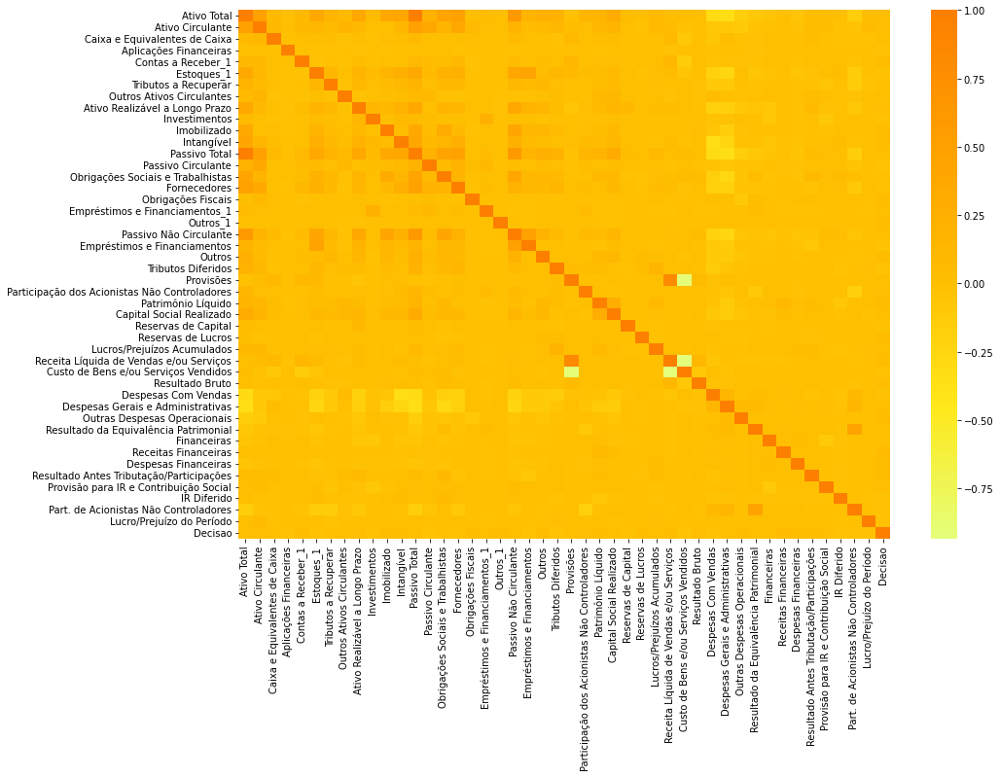

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber_1,Estoques_1,Tributos a Recuperar,Outros Ativos Circulantes,Ativo Realizável a Longo Prazo,Investimentos,...,Resultado da Equivalência Patrimonial,Financeiras,Receitas Financeiras,Despesas Financeiras,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Decisao
Ativo Total,1.000000,0.494661,0.082103,-0.002671,0.097397,0.370069,0.177047,0.089177,0.388200,0.062259,...,-0.087527,-0.044386,-0.002565,-0.043445,0.026303,0.020900,0.017757,-0.148551,6.765985e-03,0.017936
Ativo Circulante,0.494661,1.000000,0.118680,0.015468,0.086831,0.126900,0.068392,0.174508,0.100028,0.004085,...,-0.032667,-0.007287,0.013999,-0.014031,0.037559,0.028403,-0.004956,-0.031559,4.257516e-02,0.024995
Caixa e Equivalentes de Caixa,0.082103,0.118680,1.000000,-0.003816,0.007998,0.013025,0.020939,-0.014937,0.014026,-0.006956,...,-0.017696,0.003840,-0.003466,0.002785,0.029189,-0.003394,-0.019675,-0.024773,-5.846247e-03,0.015452
Aplicações Financeiras,-0.002671,0.015468,-0.003816,1.000000,0.002612,-0.006766,-0.005848,-0.002052,-0.011919,-0.002593,...,-0.015220,-0.000672,-0.003344,0.002863,-0.001570,0.001454,0.002122,0.002395,-4.744325e-04,-0.014766
Contas a Receber_1,0.097397,0.086831,0.007998,0.002612,1.000000,-0.016282,0.001451,-0.024892,0.040726,-0.000631,...,-0.019974,0.005962,0.005102,-0.008291,0.006821,-0.001063,0.004655,-0.030843,-1.081310e-04,0.040908
Estoques_1,0.370069,0.126900,0.013025,-0.006766,-0.016282,1.000000,0.147974,0.018008,0.177995,0.045599,...,-0.065500,-0.040734,0.002184,-0.042426,-0.018770,0.011355,0.035354,-0.125747,-4.073814e-03,-0.026530
Tributos a Recuperar,0.177047,0.068392,0.020939,-0.005848,0.001451,0.147974,1.000000,-0.013931,0.101835,0.023660,...,-0.020940,-0.004288,-0.003863,-0.009916,-0.007173,-0.054855,-0.001759,-0.133064,-3.107182e-02,-0.003075
Outros Ativos Circulantes,0.089177,0.174508,-0.014937,-0.002052,-0.024892,0.018008,-0.013931,1.000000,-0.024380,-0.002376,...,-0.001500,0.011929,0.008878,-0.001255,0.040850,0.017815,-0.021283,-0.018394,-4.311524e-03,0.005915
Ativo Realizável a Longo Prazo,0.388200,0.100028,0.014026,-0.011919,0.040726,0.177995,0.101835,-0.024380,1.000000,0.141104,...,-0.043372,-0.083685,-0.001066,-0.024840,0.058752,-0.012249,-0.007797,-0.088871,2.274327e-05,0.025531
Investimentos,0.062259,0.004085,-0.006956,-0.002593,-0.000631,0.045599,0.023660,-0.002376,0.141104,1.000000,...,-0.003319,-0.072312,-0.001962,-0.007874,-0.000401,-0.093748,0.000496,0.000523,-2.960457e-03,-0.008858


In [25]:
correlacoes = base_dados.corr() # tabela de correlações

fig, ax = plt.subplots(figsize=(15, 10))
sns.heatmap(correlacoes, cmap="Wistia", ax=ax) # gráfico de calor
plt.show()
display(correlacoes)

#### Vamos remover Todas as Colunas "já explicadas" pelo Ativo Total

In [26]:
correlacoes_encontradas = []

for coluna in correlacoes:
    for linha in correlacoes.index:
        if linha != coluna:
            valor = abs(correlacoes.loc[linha, coluna])
            
            if valor > 0.8 and (coluna, linha, valor) not in correlacoes_encontradas: # correlação forte
                correlacoes_encontradas.append((linha, coluna, valor))
                print(f"Correlação Encontrada: {linha} e {coluna}. Valor {valor}")

Correlação Encontrada: Passivo Total e Ativo Total. Valor 1.0
Correlação Encontrada: Receita Líquida de Vendas e/ou Serviços e Provisões. Valor 0.8305438549210247
Correlação Encontrada: Custo de Bens e/ou Serviços Vendidos e Provisões. Valor 0.9126643380921734
Correlação Encontrada: Custo de Bens e/ou Serviços Vendidos e Receita Líquida de Vendas e/ou Serviços. Valor 0.9331404447456305


In [27]:
# Removendo as correlações fortes com 'Ativo total'
remover = ['Ativo Circulante', 'Contas a Receber_1', 'Tributos a Recuperar', 'Passivo Total', 'Passivo Circulante', 'Patrimônio Líquido', 'Capital Social Realizado', 'Receita Líquida de Vendas e/ou Serviços', 'Resultado Bruto', 'Despesas Gerais e Administrativas']
base_dados = base_dados.drop(remover, axis=1)

In [28]:
print(base_dados.shape)

(1305, 36)


### Vamos partir para Feature Selection

Será que todas essas features são importantes mesmo para o nosso modelo? Muitas features nem sempre é bom, se pudermos reduzir sem perder eficiência do nosso modelo, melhor

Aqui temos 2 alternativas:

1. Seguir com todas as features e depois tentar melhorar o nosso modelo
2. Usar algum critério para selecionar as melhores features para prever e criar o modelo a partir apenas dessa seleção menor de features

Vou seguir com a opção 2, porque é mais rápida e, caso dê certo, facilita a nossa vida. Se der errado, a gente volta aqui e refaz o processo

In [29]:
# treinar uma arvore de decisao e pegar as caracteristicas mais importantes dela

from sklearn.ensemble import ExtraTreesClassifier

modelo = ExtraTreesClassifier(random_state=1) # arvore de decisão
x = base_dados.drop("Decisao", axis=1)
y = base_dados["Decisao"]
modelo.fit(x, y) # treinando a ia

# DataFrame com as características importantes
caracteristicas_importantes = pd.DataFrame(modelo.feature_importances_, x.columns).sort_values(by=0, ascending=False)
display(caracteristicas_importantes)

top10 = list(caracteristicas_importantes.index)[:10]
#top10 = list(caracteristicas_importantes.index)
print(top10)

,0
Resultado Antes Tributação/Participações,0.034372
Estoques_1,0.031583
Obrigações Fiscais,0.031483
Provisão para IR e Contribuição Social,0.031326
Lucro/Prejuízo do Período,0.031179
Outras Despesas Operacionais,0.030959
Lucros/Prejuízos Acumulados,0.030725
Ativo Realizável a Longo Prazo,0.030689
Outros_1,0.030409
Outros,0.030364


['Resultado Antes Tributação/Participações', 'Estoques_1', 'Obrigações Fiscais', 'Provisão para IR e Contribuição Social', 'Lucro/Prejuízo do Período', 'Outras Despesas Operacionais', 'Lucros/Prejuízos Acumulados', 'Ativo Realizável a Longo Prazo', 'Outros_1', 'Outros']


### Aplicação do StandardScaler para melhorar nossos modelos de MachineLearning

In [30]:
from sklearn.preprocessing import StandardScaler

def ajustar_scaler(tabela_original):
    scaler = StandardScaler() 
    
    tabela_auxiliar = tabela_original.drop("Decisao", axis=1)
    
    # criando a tabela ajustada
    tabela_auxiliar = pd.DataFrame(scaler.fit_transform(tabela_auxiliar), tabela_auxiliar.index, tabela_auxiliar.columns)

    tabela_auxiliar["Decisao"] = tabela_original["Decisao"] # reinserindo a coluna de decisão
    
    return tabela_auxiliar

nova_base_dados = ajustar_scaler(base_dados) # aplicando scaler na base de dados
top10.append("Decisao") 

nova_base_dados = nova_base_dados[top10].reset_index(drop=True) # base de dados com apenas as colunas do top10
display(nova_base_dados)

,Resultado Antes Tributação/Participações,Estoques_1,Obrigações Fiscais,Provisão para IR e Contribuição Social,Lucro/Prejuízo do Período,Outras Despesas Operacionais,Lucros/Prejuízos Acumulados,Ativo Realizável a Longo Prazo,Outros_1,Outros,Decisao
0,0.019209,-0.265233,-0.035928,0.045607,-0.024675,0.061239,-0.104017,0.092798,-0.041246,-0.059831,2
1,0.022692,-0.140561,-0.027884,-0.001067,-0.031544,0.061239,-0.091815,-0.199248,-0.038575,-0.065300,2
2,-0.256661,0.040843,-0.023491,0.044566,-0.153311,0.061239,-0.113893,-0.123706,-0.030445,-0.057038,0
3,-0.029449,0.020111,-0.035340,0.046110,-0.063893,0.061239,-0.156828,0.513228,-0.038981,-0.063017,2
4,0.043211,-0.940214,-0.056340,0.045969,-0.017710,0.061239,-0.085778,-0.176088,0.033320,-0.060575,2
...,...,...,...,...,...,...,...,...,...,...,...
1300,0.000646,-0.414453,-0.038884,0.055791,-0.042620,0.073770,0.092929,-0.029319,-0.038775,-0.063888,2
1301,-0.020114,0.543761,-0.062853,0.034462,-0.052637,0.066243,-0.271296,-0.001719,-0.037133,-0.033021,2
1302,-0.001662,-0.154096,-0.041187,0.048368,-0.041911,0.051431,-0.001393,-0.017384,-0.037194,-0.063489,0
1303,0.041711,-0.243608,-0.041803,0.022685,-0.020213,0.062061,0.552953,-0.399440,-0.038427,-0.064051,2


### Separação dos dados em treino e teste

In [31]:
from sklearn.model_selection import train_test_split

x = nova_base_dados.drop("Decisao", axis=1)
y = nova_base_dados["Decisao"]

# separando dados de treino e dados de teste
x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, random_state=1)

### Métricas de Avaliação

- Precisão vai ser nossa métrica principal
- Recall pode ser útil, mas precisão no caso de ações é muito mais importante.

In [35]:
from sklearn.metrics import classification_report, confusion_matrix

In [36]:
def avaliar(y_teste, previsoes, nome_modelo):
    print(nome_modelo)
    report = classification_report(y_teste, previsoes)
    print(report)
    
    # mostrando o report porém de forma gráfica
    cf_matrix = pd.DataFrame(confusion_matrix(y_teste, previsoes), index=["Vender", "Comprar"], columns=["Vender", "Comprar"])
    sns.heatmap(cf_matrix, annot=True, cmap="Blues", fmt=',')
    plt.show()
    print("#"*60)

### Modelos para testar
- AdaBoost
- Decision Tree
- Random Forest
- ExtraTree
- Gradient Boost
- K Nearest Neighbors (KNN)
- Logistic Regression
- Naive Bayes
- Support Vector Machine (SVM)
- Rede Neural

In [37]:
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, RandomForestClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier

# Criando os modelos
modelos = {
    "AdaBoost": AdaBoostClassifier(random_state=1),
    "DecisionTree": DecisionTreeClassifier(random_state=1),
    "RandomForest": RandomForestClassifier(random_state=1),
    "ExtraTree": ExtraTreesClassifier(random_state=1),
    "GradientBoost": GradientBoostingClassifier(random_state=1),
    "KNN": KNeighborsClassifier(),
    "LogisticRegression": LogisticRegression(random_state=1),
    "NaiveBayes": GaussianNB(),
    "SVM": SVC(random_state=1),
    "RedeNeural": MLPClassifier(random_state=1, max_iter=400),
}

AdaBoost
              precision    recall  f1-score   support

           0       0.60      0.64      0.62       175
           2       0.55      0.50      0.52       152

    accuracy                           0.57       327
   macro avg       0.57      0.57      0.57       327
weighted avg       0.57      0.57      0.57       327



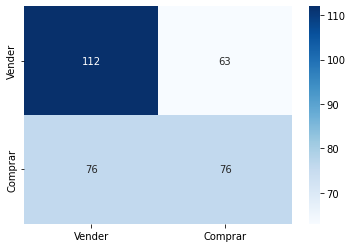

############################################################
DecisionTree
              precision    recall  f1-score   support

           0       0.56      0.50      0.53       175
           2       0.49      0.55      0.51       152

    accuracy                           0.52       327
   macro avg       0.52      0.52      0.52       327
weighted avg       0.52      0.52      0.52       327



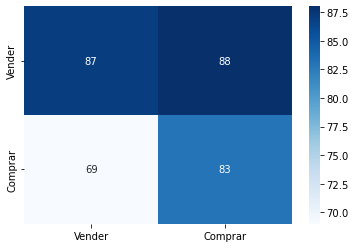

############################################################
RandomForest
              precision    recall  f1-score   support

           0       0.60      0.71      0.65       175
           2       0.58      0.45      0.50       152

    accuracy                           0.59       327
   macro avg       0.59      0.58      0.58       327
weighted avg       0.59      0.59      0.58       327



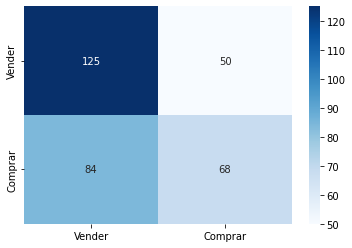

############################################################
ExtraTree
              precision    recall  f1-score   support

           0       0.62      0.71      0.66       175
           2       0.60      0.50      0.54       152

    accuracy                           0.61       327
   macro avg       0.61      0.60      0.60       327
weighted avg       0.61      0.61      0.61       327



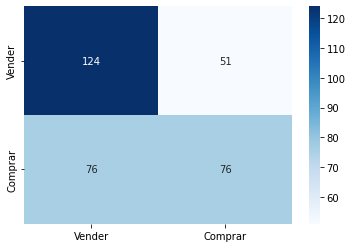

############################################################
GradientBoost
              precision    recall  f1-score   support

           0       0.60      0.68      0.64       175
           2       0.57      0.49      0.52       152

    accuracy                           0.59       327
   macro avg       0.59      0.58      0.58       327
weighted avg       0.59      0.59      0.59       327



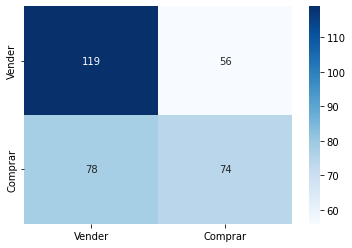

############################################################
KNN
              precision    recall  f1-score   support

           0       0.58      0.67      0.62       175
           2       0.54      0.45      0.49       152

    accuracy                           0.57       327
   macro avg       0.56      0.56      0.56       327
weighted avg       0.57      0.57      0.56       327



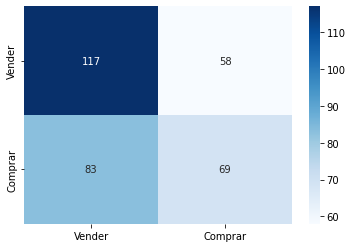

############################################################
LogisticRegression
              precision    recall  f1-score   support

           0       0.54      0.95      0.69       175
           2       0.58      0.07      0.13       152

    accuracy                           0.54       327
   macro avg       0.56      0.51      0.41       327
weighted avg       0.56      0.54      0.43       327



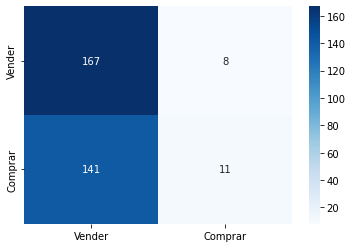

############################################################
NaiveBayes
              precision    recall  f1-score   support

           0       0.54      0.98      0.70       175
           2       0.67      0.05      0.10       152

    accuracy                           0.55       327
   macro avg       0.60      0.51      0.40       327
weighted avg       0.60      0.55      0.42       327



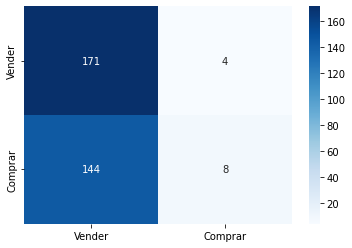

############################################################
SVM
              precision    recall  f1-score   support

           0       0.54      0.95      0.69       175
           2       0.58      0.07      0.13       152

    accuracy                           0.54       327
   macro avg       0.56      0.51      0.41       327
weighted avg       0.56      0.54      0.43       327



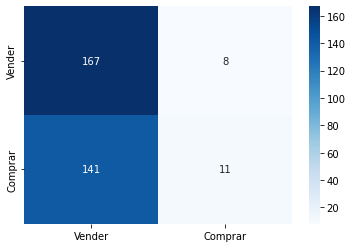

############################################################
RedeNeural
              precision    recall  f1-score   support

           0       0.56      0.76      0.65       175
           2       0.53      0.32      0.40       152

    accuracy                           0.55       327
   macro avg       0.55      0.54      0.52       327
weighted avg       0.55      0.55      0.53       327



/Users/victoriar.b/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:614: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (400) reached and the optimization hasn't converged yet.



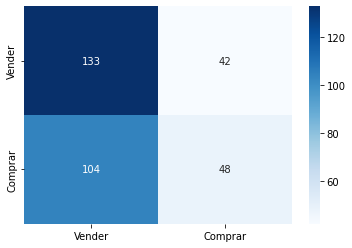

############################################################


In [38]:
# comparar os modelos
for nome_modelo in modelos:
    modelo = modelos[nome_modelo]
    
    modelo.fit(x_treino, y_treino) # treinando o modelo
    
    previsoes = modelo.predict(x_teste) # fazendo as previsoes com os testes
    
    avaliar(y_teste, previsoes, nome_modelo) # avaliando o modelo
    
    modelos[nome_modelo] = modelo # adicionando no dicionário o modelo já treinado

### Melhoria do modelo

In [39]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, precision_score

modelo_final = modelos["RandomForest"]

# testes dos parâmetros
n_estimators = [100]
#n_estimators = range(10, 251, 30)

max_features = list(range(2, 11, 2))

max_features.append('sqrt')

min_samples_split = range(2, 11, 2)

precision2_score = make_scorer(precision_score, labels=[2], average='macro') # criando parâmetro de avaliação

# aplicando cross validation
grid = GridSearchCV(
        estimator=RandomForestClassifier(), # modelo que será usado
        param_grid={ # dicionário de parâmetros
            'n_estimators': n_estimators,
            'max_features': max_features,
            'max_depth': [3, 5, 7, 9],
            'min_samples_split': min_samples_split,
            'random_state': [1],
        },
        scoring=precision2_score, # pontuação
)

resultado_grid = grid.fit(x_treino, y_treino)
print("Ajuste feito!")

Ajuste feito!


RandomForest Tunado
              precision    recall  f1-score   support

           0       0.62      0.65      0.63       175
           2       0.58      0.55      0.56       152

    accuracy                           0.60       327
   macro avg       0.60      0.60      0.60       327
weighted avg       0.60      0.60      0.60       327



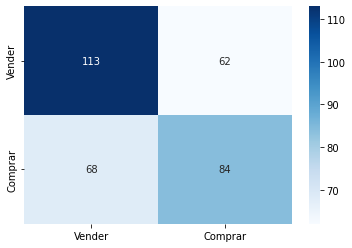

############################################################


In [40]:
modelo_tunado = resultado_grid.best_estimator_
previsoes = modelo_tunado.predict(x_teste)
avaliar(y_teste, previsoes, "RandomForest Tunado")

### Repetindo os passos com a base fundamentos só que pegando apenas o último trimestre de cada empresa

In [41]:
ult_tri_fundamentos = fundamentos.copy()
ult_tri_base_dados = pd.DataFrame()
lista_empresas = []

for empresa in ult_tri_fundamentos:
    ult_tri_fundamentos[empresa] = ult_tri_fundamentos[empresa][-4:]
    
    ult_tri_fundamentos[empresa] = ult_tri_fundamentos[empresa].reset_index(drop=True)
    
    ult_tri_base_dados = ult_tri_base_dados.append(ult_tri_fundamentos[empresa])
    
    lista_empresas.append(empresa)
    
display(ult_tri_base_dados)
print(lista_empresas)

,Ativo Total,Ativo Circulante,Caixa e Equivalentes de Caixa,Aplicações Financeiras,Contas a Receber_1,Estoques_1,Tributos a Recuperar,Outros Ativos Circulantes,Ativo Realizável a Longo Prazo,Investimentos,...,Resultado da Equivalência Patrimonial,Financeiras,Receitas Financeiras,Despesas Financeiras,Resultado Antes Tributação/Participações,Provisão para IR e Contribuição Social,IR Diferido,Part. de Acionistas Não Controladores,Lucro/Prejuízo do Período,Decisao
0,1.759452,1.278916,0.560041,0.792664,1.588447,2.449131,0.656688,0.815513,0.243624,0.193484,...,0.033613,-1.253821,-0.033677,-0.281229,1.463316,1.000000,1.000000,1.000000,38.169617,0
1,0.023785,0.057897,0.236101,-0.057003,0.140276,0.051159,-0.048779,0.124745,-0.005806,0.026369,...,0.226584,0.138531,-0.355400,0.262091,-1.000000,-1.000000,-0.722897,-0.030449,-0.898910,0
2,-0.041260,-0.084104,-0.396180,0.318433,-0.180871,-0.132256,0.005437,-0.274528,-0.002732,-0.035470,...,-0.177883,0.257187,0.475632,-0.107537,-65.621926,0.344426,0.724279,1.463999,-1.000000,0
3,-0.034104,-0.060578,-0.025244,-0.063181,-0.054489,-0.089177,-0.189797,0.231327,-0.011736,-0.031268,...,-0.031908,-0.192104,0.003782,-0.067225,-0.063903,-3.712071,0.210287,0.108683,-0.238127,0
0,0.036507,0.084327,-0.082875,0.203379,0.338028,0.049476,-0.075410,-0.068273,0.044674,0.029825,...,0.069470,1.000000,2.364865,-0.136150,-0.155567,0.085106,-1.000000,0.250000,-0.172896,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,0.058342,0.111019,0.136798,0.034814,0.000000,0.000000,0.000000,0.000000,0.084368,0.043598,...,0.000000,0.205087,0.205087,0.000000,0.120137,1.000000,0.000000,0.000000,0.000000,0
0,0.030217,-0.178535,-0.513039,-0.969098,0.048131,0.005327,-0.220173,0.161284,0.097438,0.017610,...,-0.078996,-0.147101,0.321062,-0.217811,-0.036505,0.304005,-0.528722,1.711104,0.008540,0
1,0.019687,0.184980,0.924416,0.032529,0.008763,-0.037378,0.171822,0.109339,-0.080180,0.021936,...,-0.302889,0.937566,1.308929,-0.052980,0.927510,-2.104248,5.826880,-0.804835,0.887827,2
2,-0.004330,-0.011448,-0.140595,0.065041,-0.021549,0.468152,-0.062403,-0.259921,0.034584,0.240735,...,-0.166886,-16.517840,-0.583248,0.016366,-0.396971,0.727244,-1.000000,-0.975646,-0.420285,1


['MRFG3', 'ITSA4', 'HAPV3', 'AZUL4', 'CIEL3', 'PRIO3', 'TAEE11', 'BRAP4', 'JBSS3', 'CVCB3', 'CRFB3', 'MGLU3', 'PETR4', 'CYRE3', 'YDUQ3', 'GOLL4', 'SBSP3', 'MULT3', 'ECOR3', 'RAIL3', 'MRVE3', 'EZTC3', 'CCRO3', 'ELET6', 'VALE3', 'ABEV3', 'HYPE3', 'BHIA3', 'SUZB3', 'EQTL3', 'AMER3', 'BEEF3', 'BRKM5', 'CPFE3', 'JHSF3', 'RENT3', 'CSNA3', 'GOAU4', 'WEGE3', 'BRFS3', 'USIM5', 'ENGI11', 'COGN3', 'ENEV3', 'CPLE6', 'PCAR3', 'TOTS3', 'KLBN11', 'UGPA3', 'EGIE3', 'GGBR4', 'LREN3', 'CSAN3', 'QUAL3', 'EMBR3', 'VBBR3', 'CMIG4', 'B3SA3', 'FLRY3', 'RADL3', 'NTCO3', 'TIMS3', 'BBSE3', 'VIVT3']


In [42]:
# ajustando o índice
ult_tri_base_dados = ult_tri_base_dados.reset_index(drop=True)

# pegar apenas os fundamentos mais importantes (top10)
ult_tri_base_dados = ult_tri_base_dados[top10]

# ajustando a base de dados com o scaler
ult_tri_base_dados = ajustar_scaler(ult_tri_base_dados)

# excluindo a coluna de decisão
ult_tri_base_dados = ult_tri_base_dados.drop("Decisao", axis=1)

display(ult_tri_base_dados)

,Resultado Antes Tributação/Participações,Estoques_1,Obrigações Fiscais,Provisão para IR e Contribuição Social,Lucro/Prejuízo do Período,Outras Despesas Operacionais,Lucros/Prejuízos Acumulados,Ativo Realizável a Longo Prazo,Outros_1,Outros
0,0.221278,8.317139,-0.162310,0.237706,7.133061,0.486848,13.464998,1.081728,0.869685,-0.046691
1,-0.183891,0.067167,-0.169952,0.059712,-0.211091,0.180413,-0.141426,-0.298010,-0.428172,-0.080840
2,-10.812967,-0.563852,-0.176271,0.179362,-0.230094,0.486848,-0.484601,-0.281010,0.618429,-0.082110
3,-0.029920,-0.415643,-0.037640,-0.181653,-0.086876,-0.126022,-0.567678,-0.330812,-0.512821,-0.086436
4,-0.044997,0.061377,-0.194432,0.156283,-0.074614,0.180413,-0.135912,-0.018776,-0.036220,-0.079671
...,...,...,...,...,...,...,...,...,...,...
249,0.000351,-0.108840,-0.100248,0.237706,-0.042112,0.180413,-0.071696,0.200795,-0.187048,-0.083654
250,-0.025414,-0.090513,-0.104589,0.175764,-0.040507,0.006276,-0.006937,0.273091,0.069928,-0.082175
251,0.133148,-0.237437,-0.107687,-0.038562,0.124783,0.195012,0.842903,-0.709416,-0.161581,-0.082768
252,-0.084704,1.501789,-0.100255,0.213431,-0.121118,0.333460,-0.394666,-0.074591,0.138915,-0.072282


In [43]:
# previsões
previsoes_ult_tri = modelo_tunado.predict(ult_tri_base_dados)
print(previsoes_ult_tri)

for i, empresa in enumerate(lista_empresas):
    if previsoes_ult_tri[i] == 2: # se for para comprar
        print(empresa)

[2 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 2 0 0 2 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 2 0
 2 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 0 2 0 2 2 0 0 0 2 0 0 2 0 0 0 0 0 0 0 2
 2 0 2 0 0 2 2 0 0 2 0 0 0 0 0 2 0 0 2 0 0 2 0 0 0 0 0 0 0 0 2 0 0 2 0 0 0
 0 0 2 0 0 0 2 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 2 0 0 0 0 0
 0 0 0 0 0 2 0 0 2 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 2 0 2 0 2 2 0 0 0 0 0 0
 0 0 0 2 2 0 0 2 0 0 0 0 2 2 0 0 0 0 0 2 0 0 2 0 0 2 0 0 0 0 0 0 2 0 0 2 0
 2 2 0 2 2 0 0 0 0 0 0 0 0 0 2 0 0 2 0 0 0 0 0 2 0 0 0 0 0 2 0 0]
MRFG3
MGLU3
SBSP3
RAIL3
HYPE3
RENT3
GOAU4
USIM5
QUAL3
VBBR3
B3SA3
FLRY3
BBSE3


In [44]:
# armazenar a inteligencia artificial
#import joblib

#joblib.dump(modelo_tunado, "ia_carteiraacoes.joblib")

# modelo_tunado = joblib.load("ia_carteiraacoes.joblib")